In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve
from math import pi, exp, log10, sqrt, log
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

In [19]:
class FirstOlderForward:
    
    # constant parameters used in computing
    _c1 =  1.211243
    _c2 = -0.08972168
    _c3 =  0.001384277
    _c4 = -0.00176566
    _c5 =  0.0001186795
    
    # model parameters
    _pmodel = None
    _vpmodel = None
    _vsmodel = None
    _c11 = None   # = c33 = λ+ 2μ
    _c13 = None   # = λ
    _c44 = None   # = μ
    _vx = None
    _vx = None
    _dt = 0
    _dx = 0
    _dz = 0
    _nt = 0
    _nx = 0
    _nz = 0
    _tmax = 0
    _xmax = 0
    _zmax = 0
    
    def __init__(self, pmodel=None, vpmodel=None, vsmodel=None, tmax=1., xmax=1000., zmax=800., nt=1000, nx=100, nz=80):
        # if not setting model parameter, using a easy model to test

        self._pmodel = pmodel
        self._vpmodel = vpmodel
        self._vsmodel = vsmodel
        # setting other parameters     
        self._tmax = tmax
        self._xmax = xmax
        self._zmax = zmax
        self._nt = nt
        self._nx = nx
        self._nz = nz
        
        # computing some parameters
        self._dt = tmax/nt
        self._dx = xmax/nx
        self._dz = zmax/nz
        
        self._c11 = self._pmodel * np.power(self._vpmodel, 2)
        self._c44 = self._pmodel * np.power(self._vsmodel, 2)
        self._c13 = self._c11 - 2 * self._c44
        
        # initialize the u
        self._vx = np.zeros((nx, nz, nt), dtype=float)
        self._vz = np.zeros((nx, nz, nt), dtype=float)

    # forward modeling operator with precion of O(4,10)
    def o4xFM(self, wavelet, wavalet_position, wavalet_direction='z'):
        # setting time array
        t_array = np.arange(0, self._tmax, self._dt)
        
        # initialize parameter used in process
        u = np.zeros((self._nx, self._nz), dtype=float)
        v = np.zeros((self._nx, self._nz), dtype=float)
        r = np.zeros((self._nx, self._nz), dtype=float)
        t = np.zeros((self._nx, self._nz), dtype=float)
        h = np.zeros((self._nx, self._nz), dtype=float)
        
        # start to compute
        for tk, tt in enumerate(t_array):
            if tk >= 1:  # the first step needs not to compute
                u = self.o4xComputeVx(u, v, r, t, h)
                v = self.o4xComputeVz(u, v, r, t, h)
                r = self.o4xComputeTauxx(u ,v, r, t, h)
                t = self.o4xComputeTauzz(u ,v, r, t, h)
                h = self.o4xComputeTauxz(u ,v, r, t, h)
                
                if tk < len(wavelet):  # source is active
                    if wavalet_direction=='x':
                        u[wavalet_position[0], wavalet_position[1]] += wavelet[tk]
                    else:
                        v[wavalet_position[0], wavalet_position[1]] += wavelet[tk]
                
                self._vx[:,:,tk] = u
                self._vz[:,:,tk] = v
      
    # function to oompute the velocity in x axis of the next time step
    def o4xComputeVx(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        
        # compute the 1st item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[5,:] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[:,5] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        one = self._dt / (self._dx * self._pmodel * 2) * convolve(r, kernal, mode='same', method='direct')
        
        # compute the 2nd item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[:,5] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[5,:] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        two = self._dt / (self._dz * self._pmodel * 2) * convolve(h, kernal, mode='same', method='direct')
        
        # compute the 3rd item
        kernal = np.zeros((5, 5), dtype=float)
        # kernal[2,:] = [-1, 3, -3, 1, 0]
        kernal[:,2] = [0, 1, -3, 3, -1]
        three = self._dt**3 * self._c11 / (24 * self._pmodel**2 * self._dx**3) * convolve(r, kernal, mode='same' , method='direct')
        
        # compute the 4th item
        # kernal = np.array([[-1, 2, -1],[1, -2, 1],[0, 0, 0]])
        kernal = np.array([[0, 1, -1],[0, -2, 2],[0, 1, -1]])
        four = self._dt**3 * (self._c44 + self._c11 + self._c13) \
                / (24 * self._pmodel**2 * self._dz * self._dx**2) * convolve(h, kernal, mode='same' , method='direct')
        
        # compute the 5th item
        # kernal = np.array([[-1, 1, 0],[2, -2, 0],[-1, 1, 0]])
        kernal = np.array([[0, 0, 0],[1, -2, 1],[-1, 2, -1]])
        five = self._dt**3 * (self._c44 + self._c13) \
                / (24 * self._pmodel**2 * self._dz**2 * self._dx) * convolve(t, kernal, mode='same', method='direct')
        
        # compute the 6th item
        # kernal = np.array([[-1, 1, 0],[2, -2, 0],[-1, 1, 0]])
        kernal = np.array([[0, 0, 0],[1, -2, 1],[-1, 2, -1]])
        six = self._dt**3 * self._c44 \
                / (24 * self._pmodel**2 * self._dz**2 * self._dx) * convolve(r, kernal, mode='same', method='direct')  
         
        # compute the 7th item
        kernal = np.zeros((5, 5), dtype=float)
        # kernal[:,2] = [-1, 3, -3, 1, 0]
        kernal[2, :] = [0, 1, -3, 3, -1]
        seven = self._dt**3 * self._c44 \
                / (24 * self._pmodel**2 * self._dz**3) * convolve(h, kernal, mode='same', method='direct')
        
        # sum all
        output = u + one + two + three + four + five + six + seven
        
        return output    
    
    # function to oompute the velocity in z axis of the next time step
    def o4xComputeVz(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        
        # compute the 1st item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[5,:] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[:,5] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]       
        one = self._dt / (self._dx * self._pmodel * 2) * convolve(h, kernal, mode='same', method='direct')
        
        # compute the 2nd item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[:,5] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[5,:] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        two = self._dt / (self._dz * self._pmodel * 2) * convolve(t, kernal, mode='same', method='direct')
        
        # compute the 3rd item
        kernal = np.zeros((5, 5), dtype=float)
        # kernal[2,:] = [0, -1, 3, -3, 1]
        kernal[:,2] = [1, -3, 3, -1, 0]
        three = self._dt**3 * self._c44 / (24 * self._pmodel**2 * self._dx**3) * convolve(h, kernal, mode='same', method='direct')
        
        # compute the 4th item
        # kernal = np.array([[0, -1, 1],[0, 2, -2],[0, -1, 1]])
        kernal = np.array([[1, -2, 1],[-1, 2, -1],[0, 0, 0]])
        four = self._dt**3 * (self._c44 + self._c11 + self._c13) \
                / (24 * self._pmodel**2 * self._dx * self._dz**2) * convolve(h, kernal, mode='same', method='direct')
        
        # compute the 5th item
        # kernal = np.array([[0, 0, 0],[-1, 2, -1],[1, -2, 1]])
        kernal = np.array([[1, -1, 0],[-2, 2, 0],[1, -1, 0]])
        five = self._dt**3 * (self._c44 + self._c13) \
                / (24 * self._pmodel**2 * self._dx**2 * self._dz) * convolve(r, kernal, mode='same', method='direct')      
        
        # compute the 6th item
        # kernal = np.array([[0, 0, 0],[-1, 2, -1],[1, -2, 1]])
        kernal = np.array([[1, -1, 0],[-2, 2, 0],[1, -1, 0]])
        six = self._dt**3 * self._c44 \
                / (24 * self._pmodel**2 * self._dx**2 * self._dz) * convolve(t, kernal, mode='same', method='direct')
        
        # compute the 7th item
        kernal = np.zeros((5, 5), dtype=float)
        # kernal[:,2] = [0, -1, 3, -3, 1]
        kernal[2,:] = [1, -3, 3, -1, 0]
        seven = self._dt**3 * self._c11 \
                / (24 * self._pmodel**2 * self._dz**3) * convolve(t, kernal, mode='same', method='direct')
        
        # sum all
        output = v + one + two + three + four + five + six + seven
        
        return output

    # function to oompute the stress on xx
    def o4xComputeTauxx(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        
        # compute the 1st item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[5,:] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[:,5] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]       
        one = self._dt * self._c11 / self._dx * convolve(u, kernal, mode='same', method='direct') * 0.5
        
        # compute the 2nd item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[:,5] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[5,:] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]       
        two = self._dt * self._c13 / self._dz * convolve(v, kernal, mode='same', method='direct') * 0.5
        
        # computer the 3rd item
        kernal = np.zeros((5,5), dtype=float)
        # kernal[2,:] = [0, -1, 3, -3, 1]
        kernal[:,2] = [1, -3, 3, -1, 0]
        three = self._dt**3 * self._c11**2 / (24 * self._pmodel * self._dx**3) * convolve(u, kernal, mode='same', method='direct')
        
        # computer the 4th item
        # kernal = np.array([[-1, 2, -1],[1, -2, 1],[0, 0, 0]])
        kernal = np.array([[0, 1, -1],[0, -2, 2],[0, 1, -1]])
        four = self._dt**3 * (self._c11*self._c13 + self._c11*self._c44 + self._c13*self._c44) \
                / (24 * self._pmodel * self._dx**2 * self._dz) * convolve(v, kernal, mode='same', method='direct')  
        
        # computer the 5th item
        # kernal = np.array([[0, -1, 1],[0, 2, -2],[0, -1, 1]])
        kernal = np.array([[1, -2, 1],[-1, 2, -1],[0, 0, 0]])
        five = self._dt**3 * (self._c13**2 + self._c11*self._c44 + self._c13*self._c44) \
                / (24 * self._pmodel * self._dz**2 * self._dx) * convolve(u, kernal, mode='same', method='direct')  

        # computer the 6th item
        kernal = np.zeros((5,5), dtype=float)
        # kernal[:,2] = [-1, 3, -3, 1, 0]
        kernal[2, :] = [0, 1, -3, 3, -1]
        six = self._dt**3 * self._c11* self._c13 / (24 * self._pmodel * self._dz**3) * convolve(v, kernal, mode='same', method='direct')
        
        # sum all
        output = r + one + two + three + four + five + six
        
        return output
    
    # function to oompute the stress on zz
    def o4xComputeTauzz(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        
        # compute the 1st item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[5,:] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[:,5] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]       
        one = self._dt * self._c13 / self._dx * convolve(u, kernal, mode='same', method='direct') * 0.5
        
        # compute the 2nd item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[:,5] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[5, :] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]               
        two= self._dt * self._c11 / self._dz * convolve(v, kernal, mode='same', method='direct') * 0.5
        
        # computer the 3rd item
        kernal = np.zeros((5,5), dtype=float)
        # kernal[2,:] = [0, -1, 3, -3, 1]
        kernal[:,2] = [1, -3, 3, -1, 0]
        three = self._dt**3 * self._c11 * self._c13 / (24 * self._pmodel * self._dx**3) * convolve(u, kernal, mode='same', method='direct')
        
        # computer the 4th item
        # kernal = np.array([[-1, 2, -1],[1, -2, 1],[0, 0, 0]])
        kernal = np.array([[0, 1, -1],[0, -2, 2],[0, 1, -1]])
        four = self._dt**3 * (self._c13**2 + self._c13*self._c44 + self._c11*self._c44) \
                / (24 * self._pmodel * self._dx**2 * self._dz) * convolve(v, kernal, mode='same', method='direct')  
        
        # computer the 5th item
        # kernal = np.array([[0, -1, 1],[0, 2, -2],[0, -1, 1]])
        kernal = np.array([[1, -2, 1],[-1, 2, -1],[0, 0, 0]])
        five = self._dt**3 * (self._c13 * self._c11 + self._c13 * self._c44 + self._c11 * self._c44) \
                / (24 * self._pmodel * self._dz**2 * self._dx) * convolve(u, kernal, mode='same', method='direct')  

        # computer the 6th item
        kernal = np.zeros((5,5), dtype=float)
        # kernal[:,2] = [-1, 3, -3, 1, 0]
        kernal[2, :] = [0, 1, -3, 3, -1]
        six = self._dt**3 * self._c11**2 / (24 * self._pmodel * self._dz**3) * convolve(v, kernal, mode='same', method='direct')
        
        # sum all
        output = t + one + two + three + four + five + six
        
        return output
    
    # function to oompute the stress on xz
    def o4xComputeTauxz(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        
        # compute the 1st item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[5,:] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[:,5] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]       
        one = self._dt * self._c44 / self._dx * convolve(v, kernal, mode='same', method='direct') * 0.5
        
        # compute the 2nd item
        kernal = np.zeros((11, 11), dtype=float)
        # kernal[:,5] = [-self._c5, -self._c4, -self._c3, -self._c2, -self._c1, 0, self._c1, self._c2, self._c3, self._c4, self._c5]
        kernal[5, :] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]       
        two = self._dt * self._c44 / self._dz * convolve(u, kernal, mode='same', method='direct') * 0.5
        
        # computer the 3rd item
        kernal = np.zeros((5,5), dtype=float)
        # kernal[2,:] = [-1, 3, -3, 1, 0]
        kernal[:,2] = [0, 1, -3, 3, -1]
        three = self._dt**3 * self._c44**2 / (24 * self._pmodel * self._dx**3) * convolve(v, kernal, mode='same', method='direct')
        
        # computer the 4th item
        # kernal = np.array([[0, 0, 0],[-1, 2, -1],[1, -2, 1]])
        kernal = np.array([[1, -1, 0],[-2, 2, 0],[1, -1, 0]])
        four = self._dt**3 * (self._c44**2 + self._c11*self._c44 + self._c13*self._c44) \
                / (24 * self._pmodel * self._dx**2 * self._dz) * convolve(u, kernal, mode='same', method='direct')  
        
        # computer the 5th item
        # kernal = np.array([[-1 ,1, 0],[2, -2, 0],[-1, 1, 0]])
        kernal = np.array([[0,0,0],[1, -2, 1],[-1, 2, -1]])
        five = self._dt**3 * self._c44 * (self._c13 + self._c44 + self._c11) \
                / (24 * self._pmodel * self._dz**2 * self._dx) * convolve(v, kernal, mode='same', method='direct')  

        # computer the 6th item
        kernal = np.zeros((5,5), dtype=float)
        # kernal[:,2] = [0, -1, 3, -3, 1]
        kernal[2, :] = [1, -3, 3, -1, 0]
        six = self._dt**3 * self._c44**2 / (24 * self._pmodel * self._dz**3) * convolve(u, kernal, mode='same', method='direct')
        
        # sum all
        output = t + one + two + three + four + five + six
        
        return output
    
    def DrawModel(self):
        if self._nx > self._nz:
            plt.figure(figsize=(20, 4))
        elif self._nx == self._nz:
            plt.figure(figsize=(20, 6))
        else:
            plt.figure(figsize=(20, 8))
        
        ax1 = plt.subplot(1,3,1)
        plt.imshow(self._pmodel.T, cmap=plt.cm.cool, aspect='auto')
        plt.title("density model")
        plt.colorbar(shrink=0.8)
        
        plt.subplot(1,3,2)
        plt.imshow(self._vpmodel.T, cmap=plt.cm.cool, aspect='auto')
        plt.title("P wave velocity model")
        plt.colorbar(shrink=0.8)

        plt.subplot(1,3,3)
        plt.imshow(self._vsmodel.T, cmap=plt.cm.cool, aspect='auto')
        plt.title("S wave velocitydensity model")
        plt.colorbar(shrink=0.8)
        
    def RangeInOne(self, array):
        _max = max(np.max(array), abs(np.min(array)))
        return array / _max        

    def DrawWaveField(self):
        iterations_to_show = [150, 250, 370, 500]
        fgr, axs = plt.subplots(1,len(iterations_to_show), figsize = (18,10))
        for j, ax in enumerate(axs):
            ax.imshow(self.RangeInOne(self._vx[:, :, iterations_to_show[j]].T), cmap = plt.cm.coolwarm, vmin = -1, vmax = 1, interpolation='bilinear', aspect='auto')
            ax.annotate("t = {0} ms".format(iterations_to_show[j]), xy=(0.05, 0.05), xycoords="axes fraction")
        plt.show()
        
    def DrawXWaveField(self, iterations_to_show):
        # iterations_to_show = [150, 250, 370, 500]
        fgr, axs = plt.subplots(1,len(iterations_to_show), figsize = (18,10))
        for j, ax in enumerate(axs):
            ax.imshow(self.RangeInOne(self._vx[:, :, iterations_to_show[j]].T), cmap = plt.cm.coolwarm, vmin = -1, vmax = 1, interpolation='bilinear')
            ax.annotate("t = {0} ms".format(iterations_to_show[j]), xy=(0.05, 0.05), xycoords="axes fraction")
        plt.show()
        
    def DrawZWaveField(self, iterations_to_show):
        # iterations_to_show = [150, 250, 370, 500]
        fgr, axs = plt.subplots(1,len(iterations_to_show), figsize = (18,10))
        for j, ax in enumerate(axs):
            ax.imshow(self.RangeInOne(self._vz[:, :, iterations_to_show[j]].T), cmap = plt.cm.coolwarm, vmin = -1, vmax = 1, interpolation='bilinear')
            ax.annotate("t = {0} ms".format(iterations_to_show[j]), xy=(0.05, 0.05), xycoords="axes fraction")
        plt.show()
        
    
    def o24FM(self, wavelet, wavalet_position, wavalet_direction='z'):    
        # setting time array
        t_array = np.arange(0, self._tmax, self._dt)
        
        # initialize parameter used in process
        u = np.zeros((self._nx, self._nz), dtype=float)
        v = np.zeros((self._nx, self._nz), dtype=float)
        r = np.zeros((self._nx, self._nz), dtype=float)
        t = np.zeros((self._nx, self._nz), dtype=float)
        h = np.zeros((self._nx, self._nz), dtype=float)
        for tk, tt in enumerate(t_array):
            if tk >= 1:  # the first step needs not to compute
                u = self.o24ComputeVx(u, v, r, t, h)
                v = self.o24ComputeVz(u, v, r, t, h)
                r = self.o24ComputeTauxx(u ,v, r, t, h)
                t = self.o24ComputeTauzz(u ,v, r, t, h)
                h = self.o24ComputeTauxz(u ,v, r, t, h)
                
                if tk < len(wavelet):  # source is active
                    if wavalet_direction=='x':
                        u[wavalet_position[1], wavalet_position[0]] += wavelet[tk]
                    else:
                        v[wavalet_position[1], wavalet_position[0]] += wavelet[tk]
                
            self._vx[:,:,tk] = u
            self._vz[:,:,tk] = v
            
    def o24ComputeVx(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        kernal = np.array([[0,0,0],[0,1,0],[0,-1,0]])
        one = self._dt / (self._pmodel * self._dx) * convolve(r, kernal, mode='same', method='direct')
        
        kernal = np.array([[0,0,0],[0,1,-1],[0,0,0]])
        two = self._dt / (self._pmodel * self._dz) * convolve(h, kernal, mode='same', method='direct')
        
        output = u + one + two
        
        return output
        
    def o24ComputeVz(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        
        kernal = np.array([[0,1,0],[0,-1,0],[0,0,0]])
        one = self._dt / (self._pmodel * self._dx) * convolve(h, kernal, mode='same', method='direct')
        
        kernal = np.array([[0,0,0],[1,-1,0],[0,0,0]])
        two = self._dt / (self._pmodel * self._dz) * convolve(t, kernal, mode='same', method='direct')
        
        output = v + one + two
               
        return output

    def o24ComputeTauxx(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        
        kernal = np.array([[0,1,0],[0,-1,0],[0,0,0]])
        one = (self._dt * self._c11) / (self._dx) * convolve(u, kernal, mode='same', method='direct')
        
        kernal = np.array([[0,0,0],[0,1,-1],[0,0,0]])
        two = (self._dt * self._c13) / (self._dz) * convolve(v, kernal, mode='same', method='direct')
        
        output = r + one + two
        
        return output

        
    def o24ComputeTauzz(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        
        kernal = np.array([[0,0,0],[0,1,-1],[0,0,0]])
        one = (self._dt * self._c11) / (self._dz) * convolve(v, kernal, mode='same', method='direct')
        
        kernal = np.array([[0,1,0],[0,-1,0],[0,0,0]])
        two = (self._dt * self._c13) / (self._dx) * convolve(u, kernal, mode='same', method='direct')
        
        output = t + one + two     
            
        return output

    def o24ComputeTauxz(self, u, v, r, t, h):
        output = np.zeros((self._nx, self._nz), dtype=float)
        
        kernal = np.array([[0,0,0],[1,-1,0],[0,0,0]])
        one = (self._dt * self._c44) / (self._dz) * convolve(u, kernal, mode='same', method='direct')
        
        kernal = np.array([[0,0,0],[0,1,0],[0,-1,0]])
        two = (self._dt * self._c44) / (self._dx) * convolve(v, kernal, mode='same', method='direct')
        
        output = h + one + two

        return output

In [20]:
class FristOlderForward_PML(FirstOrderForward):
    # extra parameters
    _kai_x = None
    _kai_z = None
    _sigma_x = None
    _sigma_z = None
    _alpha_x = None
    _alpha_z = None
    _pml_x = 0
    _pml_z = 0
    def __init__(self, pmodel, vpmodel, vsmodel, tmax, xmax, zmax, nt, nx, nz, kai_x, kai_z, sigma_x, sigma_z, alpha_x, alpha_z):
        
        self._pmodel = pmodel
        self._vpmodel = vpmodel
        self._vsmodel = vsmodel
        # setting other parameters     
        self._tmax = tmax
        self._xmax = xmax
        self._zmax = zmax
        self._nt = nt
        self._nx = nx
        self._nz = nz
        
        # computing some parameters
        self._dt = tmax/nt
        self._dx = xmax/nx
        self._dz = zmax/nz
        
        self._c11 = self._pmodel * np.power(self._vpmodel, 2)
        self._c44 = self._pmodel * np.power(self._vsmodel, 2)
        self._c13 = self._c11 - 2 * self._c44
        
        # initialize the amplitude u
        self._vx = np.zeros((nx, nz, nt), dtype=float)
        self._vz = np.zeros((nx, nz, nt), dtype=float)
        
        # initial kai sigma alpha
        self._kai_x = kai_x
        self._kai_z = kai_z
        self._sigma_x = sigma_x
        self._sigma_z = sigma_z
        self._alpha_x = alpha_x
        self._alpha_z = alpha_z
        
    def o24FM(self, wavelet, wavalet_position, wavalet_direction='z'):
        # a o(2,4) forward modeling
        t_array = np.arange(0, self._tmax, self._dt)
        
        # set auxiliary parameters
        u = np.zeros((nx,nz), dtype=float)
        v = np.zeros((nx,nz), dtype=float)
        r = np.zeros((nx,nz), dtype=float)
        t = np.zeros((nx,nz), dtype=float)
        h = np.zeros((nx,nz), dtype=float)
        
        omega_xx = np.zeros((nx,nz), dtype=float)
        omega_xz = np.zeros((nx,nz), dtype=float)
        omega_zx = np.zeros((nx,nz), dtype=float)
        omega_zz = np.zeros((nx,nz), dtype=float)
        phi_xx = np.zeros((nx,nz), dtype=float)
        phi_zz = np.zeros((nx,nz), dtype=float)
        phi_zx = np.zeros((nx,nz), dtype=float)
        phi_xz = np.zeros((nx,nz), dtype=float)

        for tk, tt in enumerate(t_array):
            if tk >= 1:  # the first step needs not to compute

                u = self.o24ComputeVx(u, v, r, t, h)
                v = self.o24ComputeVz(u, v, r, t, h)
                
                print("origin vx and vz for" + str(tk) + "times:")
                print("ux in souece:")
                print(u[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("ux in pml layer:")
                print(u[0:5,0:5])
                
                print("uz in souece:")
                print(v[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("uz in pml layer:")
                print(v[0:5,0:5])
                
                # update pml correction
                correction_u = self.o24Correction_u(u, v, r ,t ,h, omega_xx, omega_xz)
                correction_v = self.o24Correction_v(u, v, r, t, h, omega_zx, omega_zz)
                u -= correction_u
                v -= correction_v
                
                print("correction of vx and vz for" + str(tk) + "times:")
                print("ux in souece:")
                print(correction_u[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("ux in pml layer:")
                print(correction_u[0:5,0:5])
                
                print("uz in souece:")
                print(correction_v[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("uz in pml layer:")
                print(correction_v[0:5,0:5])
                
                print("after correction vx and vz for" + str(tk) + "times:")
                print("ux in souece:")
                print(u[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("ux in pml layer:")
                print(u[0:5,0:5])
                
                print("uz in souece:")
                print(v[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("uz in pml layer:")
                print(v[0:5,0:5])
                
                # update omega
                omega_xx = self.o24Update_Omega_xx(omega_xx, r)
                omega_xz = self.o24Update_Omega_xz(omega_xz, h)
                omega_zx = self.o24Update_Omega_zx(omega_zx, h)
                omega_zz = self.o24Update_Omega_zz(omega_zz, t)
                print("omega for" + str(tk) + "times:")
                print("omega_xx in souece:")
                print(omega_xx[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("omega_xx in pml layer:")
                print(omega_xx[0:5,0:5])
                
                print("omega_xz in souece:")
                print(omega_xz[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("omega_xz in pml layer:")
                print(omega_xz[0:5,0:5])
                
                print("omega_zx in souece:")
                print(omega_zx[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("omega_zx in pml layer:")
                print(omega_zx[0:5,0:5])
                
                print("omega_zz in souece:")
                print(omega_zz[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("omega_zz in pml layer:")
                print(omega_zz[0:5,0:5])
                
                r = self.o24ComputeTauxx(u ,v, r, t, h)
                t = self.o24ComputeTauzz(u ,v, r, t, h)
                h = self.o24ComputeTauxz(u ,v, r, t, h)
                
                print("origin r, t and h for" + str(tk) + "times:")
                
                print("r in souece:")
                print(r[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("r in pml layer:")
                print(r[0:5,0:5])
                
                print("t in souece:")
                print(t[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("t in pml layer:")
                print(t[0:5,0:5])
                               
                print("h in souece:")
                print(h[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("h in pml layer:")
                print(h[0:5,0:5])
                
                
                # update pml correction
                correction_r = self.o24Correction_r(u, v, r, t, h, phi_xx, phi_zz)
                correction_t = self.o24Correction_t(u, v, r, t, h, phi_xx, phi_zz)
                correction_h = self.o24Correction_h(u, v, r, t, h, phi_zx, phi_xz)
                r -= correction_r
                t -= correction_t
                h -= correction_h
                
                print("correction of r, t and h for" + str(tk) + "times:")
                
                print("correction of r in souece:")
                print(correction_r[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("correction_r in pml layer:")
                print(correction_r[0:5,0:5])
                
                print("correction_t in souece:")
                print(correction_t[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("correction_t in pml layer:")
                print(correction_t[0:5,0:5])
                               
                print("correction_h in souece:")
                print(correction_h[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("correction_h in pml layer:")
                print(correction_h[0:5,0:5])
                
                print("after correction of r, t and h for" + str(tk) + "times:")
                
                print("r in souece:")
                print(r[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("r in pml layer:")
                print(r[0:5,0:5])
                
                print("t in souece:")
                print(t[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("t in pml layer:")
                print(t[0:5,0:5])
                               
                print("h in souece:")
                print(h[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("h in pml layer:")
                print(h[0:5,0:5])
                
       
                # update phi
                phi_xx = self.o24Update_Phi_xx(phi_xx, u)
                phi_zz = self.o24Update_Phi_zz(phi_zz, v)
                phi_zx = self.o24Update_Phi_zx(phi_zx, v)
                phi_xz = self.o24Update_Phi_xz(phi_xz, u)
                
                print("phi for" + str(tk) + "times:")
                print("phi_xx in souece:")
                print(phi_xx[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("phi_xx in pml layer:")
                print(phi_xx[0:5,0:5])
                
                print("phi_zz in souece:")
                print(phi_zz[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("phi_zz in pml layer:")
                print(phi_zz[0:5,0:5])
                
                print("phi_zx in souece:")
                print(phi_zx[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("phi_zx in pml layer:")
                print(phi_zx[0:5,0:5])
                
                print("phi_xz in souece:")
                print(phi_xz[wavalet_position[1]-2:wavalet_position[1]+3, wavalet_position[0]-2:wavalet_position[0]+3])
                print("phi_xz in pml layer:")
                print(phi_xz[0:5,0:5])
                
                if tk < len(wavelet):  # source is active
                    if wavalet_direction=='x':
                        u[wavalet_position[1], wavalet_position[0]] += wavelet[tk]
                    else:
                        v[wavalet_position[1], wavalet_position[0]] += wavelet[tk]
                
            self._vx[:,:,tk] = u
            self._vz[:,:,tk] = v
            
    def o24Correction_u(self, u, v, r, t, h, omega_xx, omega_xz):
        kernal_1 = np.array([[0, 0, 0],[0, 1, 0],[0, -1, 0]])
        kernal_2 = np.array([[0, 0, 0],[0, 1, -1],[0, 0, 0]])
        one = (1 - 1 / self._kai_x) * convolve(r, kernal_1, mode='same')
        two = (1 - 1 / self._kai_z) * convolve(h, kernal_2, mode='same')
        return self._dt / self._pmodel * (one + two + omega_xx + omega_xz)
    
    def o24Correction_v(self, u, v, r, t, h, omega_zx, omega_zz):
        kernal_1 = np.array([[0, 1, 0], [0, -1, 0], [0, 0, 0]])
        kernal_2 = np.array([[0, 0, 0], [1, -1, 0], [0, 0, 0]])
        one = (1 - 1 / self._kai_x) * convolve(h, kernal_1, mode='same')
        two = (1 - 1 / self._kai_z) * convolve(t, kernal_2, mode='same')
        return self._dt / self._pmodel *(one + two + omega_zx + omega_zz)
    
    def o24Correction_r(self, u, v, r, t, h, phi_xx, phi_zz):
        kernal_1 = np.array([[0,1,0],[0,-1,0],[0,0,0]])
        kernal_2 = np.array([[0,0,0],[0,1,-1],[0,0,0]])
        one = self._c11 * (phi_xx + (1 - 1 / self._kai_x) * convolve(u, kernal_1, mode='same'))
        two = self._c13 * (phi_zz + (1 - 1 / self._kai_z) * convolve(v, kernal_2, mode='same'))
        return self._dt * (one + two)
    
    def o24Correction_t(self, u, v, r, t, h, phi_xx, phi_zz):
        kernal_1 = np.array([[0,1,0],[0,-1,0],[0,0,0]])
        kernal_2 = np.array([[0,0,0],[0,1,-1],[0,0,0]])
        one = self._c13 * (phi_xx + (1 - 1 / self._kai_x) * convolve(u, kernal_1, mode='same'))
        two = self._c11 * (phi_zz + (1 - 1 / self._kai_z) * convolve(v, kernal_2, mode='same'))
        return self._dt * (one + two)
    
    def o24Correction_h(self, u, v, r, t, h, phi_zx, phi_xz):
        kernal_1 = np.array([[0,0,0],[0,1,0],[0,-1,0]])
        kernal_2 = np.array([[0,0,0],[1,-1,0],[0,0,0]])
        one = self._c44 * (phi_zx + (1 - 1 / self._kai_x) * convolve(v, kernal_1, mode='same'))
        two = self._c44 * (phi_xz + (1 - 1 / self._kai_z) * convolve(u, kernal_2, mode='same'))
        return self._dt * (one + two)
    
    def o24Update_Omega_xx(self, omega_xx, r):
        epsilon = 1e-10  # used for avoiding to devide zero
        # c_x = 1 - 1 / self._kai_x
        b_x = np.exp(-(self._alpha_x + self._sigma_x / self._kai_x) * dt)
        a_x = (1 - b_x) * self._sigma_x / ((self._kai_x * (self._kai_x * self._alpha_x + self._sigma_x)) + epsilon)
        kernal = np.zeros((11,11), dtype=float)
        kernal[:,5] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        return b_x * omega_xx + a_x * convolve(r, kernal, mode='same') * 0.5
    
    def o24Update_Omega_xz(self, omega_xz, h):
        epsilon = 1e-10
        b_z = np.exp(-(self._alpha_z + self._sigma_z / self._kai_z) * dt)
        a_z = (1 - b_z) * self._sigma_z / ((self._kai_z * (self._kai_z * self._alpha_z + self._sigma_z)) + epsilon)
        kernal = np.zeros((11,11), dtype=float)
        kernal[5,:] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        return b_z * omega_xz + a_z * convolve(h, kernal, mode='same') * 0.5
    
    def o24Update_Omega_zx(self, omega_zx, h):
        epsilon = 1e-10  # used for avoiding to devide zero
        # c_x = 1 - 1 / self._kai_x
        b_x = np.exp(-(self._alpha_x + self._sigma_x / self._kai_x) * dt)
        a_x = (1 - b_x) * self._sigma_x / ((self._kai_x * (self._kai_x * self._alpha_x + self._sigma_x)) + epsilon)
        kernal = np.zeros((11,11), dtype=float)
        kernal[:,5] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        return b_x * omega_zx + a_x * convolve(h, kernal, mode='same') * 0.5

    def o24Update_Omega_zz(self, omega_zz, t):
        epsilon = 1e-10
        b_z = np.exp(-(self._alpha_z + self._sigma_z / self._kai_z) * dt)
        a_z = (1 - b_z) * self._sigma_z / ((self._kai_z * (self._kai_z * self._alpha_z + self._sigma_z)) + epsilon)
        kernal = np.zeros((11,11), dtype=float)
        kernal[5,:] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        return b_z * omega_zz + a_z * convolve(t, kernal, mode='same') * 0.5
    
    def o24Update_Phi_xx(self, phi_xx, u):
        epsilon = 1e-10  # used for avoiding to devide zero
        # c_x = 1 - 1 / self._kai_x
        b_x = np.exp(-(self._alpha_x + self._sigma_x / self._kai_x) * dt)
        a_x = (1 - b_x) * self._sigma_x / ((self._kai_x * (self._kai_x * self._alpha_x + self._sigma_x)) + epsilon)
        kernal = np.zeros((11,11), dtype=float)
        kernal[:,5] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        return b_x * phi_xx + a_x * convolve(u, kernal, mode='same') * 0.5
 
    def o24Update_Phi_zz(self, phi_zz, v):
        epsilon = 1e-10
        b_z = np.exp(-(self._alpha_z + self._sigma_z / self._kai_z) * dt)
        a_z = (1 - b_z) * self._sigma_z / ((self._kai_z * (self._kai_z * self._alpha_z + self._sigma_z)) + epsilon)
        kernal = np.zeros((11,11), dtype=float)
        kernal[5,:] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        return b_z * phi_zz + a_z * convolve(v, kernal, mode='same') * 0.5
    
    def o24Update_Phi_zx(self, phi_zx, v):
        epsilon = 1e-10  # used for avoiding to devide zero
        # c_x = 1 - 1 / self._kai_x
        b_x = np.exp(-(self._alpha_x + self._sigma_x / self._kai_x) * dt)
        a_x = (1 - b_x) * self._sigma_x / ((self._kai_x * (self._kai_x * self._alpha_x + self._sigma_x)) + epsilon)
        kernal = np.zeros((11,11), dtype=float)
        kernal[:,5] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        return b_x * phi_zx + a_x * convolve(v, kernal, mode='same') * 0.5
    
    def o24Update_Phi_xz(self, phi_xz, u):
        epsilon = 1e-10
        b_z = np.exp(-(self._alpha_z + self._sigma_z / self._kai_z) * dt)
        a_z = (1 - b_z) * self._sigma_z / ((self._kai_z * (self._kai_z * self._alpha_z + self._sigma_z)) + epsilon)
        kernal = np.zeros((11,11), dtype=float)
        kernal[5,:] = [self._c5, self._c4, self._c3, self._c2, self._c1, 0, -self._c1, -self._c2, -self._c3, -self._c4, -self._c5]
        return b_z * phi_xz + a_z * convolve(u, kernal, mode='same') * 0.5
    
    # a easy version of setting auxiliary parameters 
    def Cal_Auxiliary_Para(vsmodel, nx, nz, xmax, zmax, pml_x, pml_z):
        kai_x = np.zeros((nx, nz), dtype=float)
        kai_z = np.zeros((nx, nz), dtype=float)
        sigma_x = np.zeros((nx, nz), dtype=float)
        sigma_z = np.zeros((nx, nz), dtype=float)
        alpha_x = np.zeros((nx, nz), dtype=float)
        alpha_z = np.zeros((nx, nz), dtype=float)
        # sigma_max = -np.max(vsmodel) * 3 * log10(0.00001) / (2 * sqrt((xmax / nx * pml_x)**2 + (zmax / nz * pml_z)**2))
        sigma_max = 1200
        alpha_max = 150
        kai_max = 2
        ratio = np.ones((nx, nz), dtype=float)
        for tx in range(nx):
            for tz in range(nz):
                if tx < pml_x and tz < pml_z:  # locating the left top block
                    ratio[tx, tz] = sqrt(((tx - pml_x)**2 + (tz - pml_z)**2) / (pml_x**2 + pml_z**2))

                elif tx < pml_x and tz > nz - pml_z - 1: # locating the right top block
                    ratio[tx, tz] = sqrt(((tx - pml_x)**2 + (tz + pml_z - nz + 1)**2) / (pml_x**2 + pml_z**2))

                elif tx < pml_x:  # middle top block
                    ratio[tx, tz] = 1 / sqrt(pml_x**2 + pml_z**2) * (pml_x - tx)

                elif tx > nx - pml_x - 1 and tz < pml_z:  # left bottom block
                    ratio[tx, tz] = sqrt(((tx + pml_x - nx + 1)**2 + (tz - pml_z)**2) / (pml_x**2 + pml_z**2))

                elif tx > nx - pml_x - 1 and tz > nz - pml_z - 1: # the right bottom block
                    ratio[tx, tz] = sqrt(((tx + pml_x - nx + 1)**2 + (tz + pml_z - nz + 1)**2) / (pml_x**2 + pml_z**2))

                elif tz < pml_z: # the left middle block
                    ratio[tx, tz] = 1 / sqrt(pml_x**2 + pml_z**2) * (pml_z - tz)

                elif tz > nz - pml_z - 1: # the right middle block
                    ratio[tx, tz] = 1 / sqrt(pml_x**2 + pml_z**2) * (pml_z + tz - nz + 1)

                elif tx > nx - pml_x - 1: # the bottom middle block
                    ratio[tx, tz] = 1 / sqrt(pml_x**2 + pml_z**2) * (pml_x + tx - nx + 1)

                else:
                        ratio[tx, tz] = 0
        
        ratio = np.power(ratio, 2)
        
        sigma_x = sigma_max * ratio
        sigma_z = sigma_max * ratio
        
        alpha_x = alpha_max * ratio
        alpha_z = alpha_max * ratio
        
        kai_x = 1 + (kai_max - 1) * ratio
        kai_z = 1 + (kai_max - 1) * ratio

        return kai_x, kai_z, sigma_x, sigma_z, alpha_x, alpha_z

In [9]:
# a test model
xmax = 1500
zmax = 1500
nx = 150
nz = 150
tmax = 0.5
nt = 500
f_m = 30

source_position = [75, 75]
source_direction = 'z'

pmodel = 3000 * np.ones((nx, nz), dtype=float)
vpmodel = 3000 * np.ones((nx, nz), dtype=float)
vsmodel = 1800 * np.ones((nx, nz), dtype=float)

test = FirstOrderForward(pmodel, vpmodel, vsmodel, tmax, xmax, zmax, nt, nx, nz)

# 30Hz ricker wavelet
# f(t)=(1-2*pi^2*f_m^2*t^2)e^(-pi^2*f_m^2*t^2)
source_array = np.zeros(40)
for tk , t in enumerate(np.arange(0, 0.04, 0.001)):
    #print(t,tk)
    source_array[tk] = \
            ((-4 * pi**2 * f_m**2 * t) + (2 * pi**2 * f_m**2 * t**2 - 1) * (pi**2 * f_m**2 * 2 * t)) * exp(-pi**2 * f_m**2 * t**2)

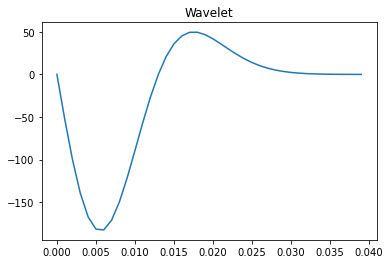

In [10]:
# draw wavelat
plt.plot(np.arange(0, 0.04, 0.001), source_array)
plt.title('Wavelet')
plt.show()

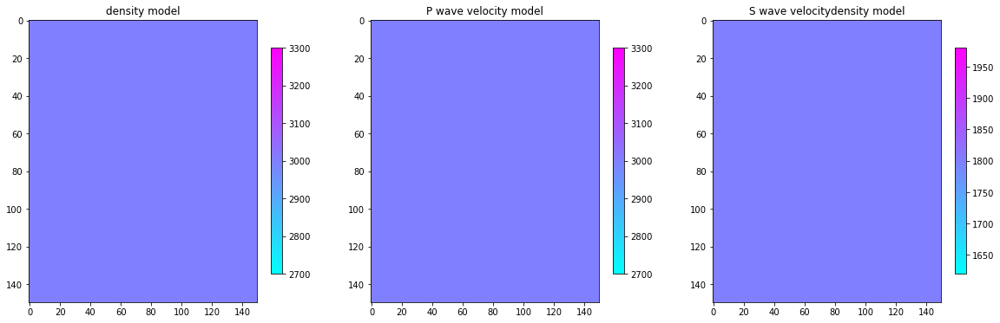

In [11]:
# draw model
test.DrawModel()


In [11]:
test.o24FM(wavelet=source_array, wavalet_position=source_position, wavalet_direction='x')

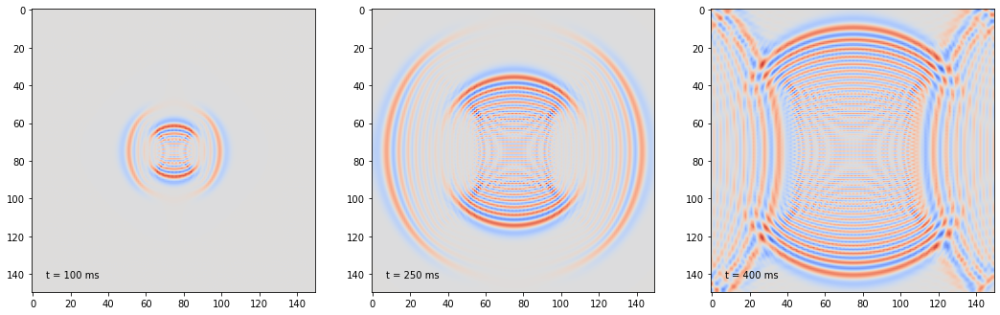

In [12]:
test.DrawXWaveField([100,250, 400])

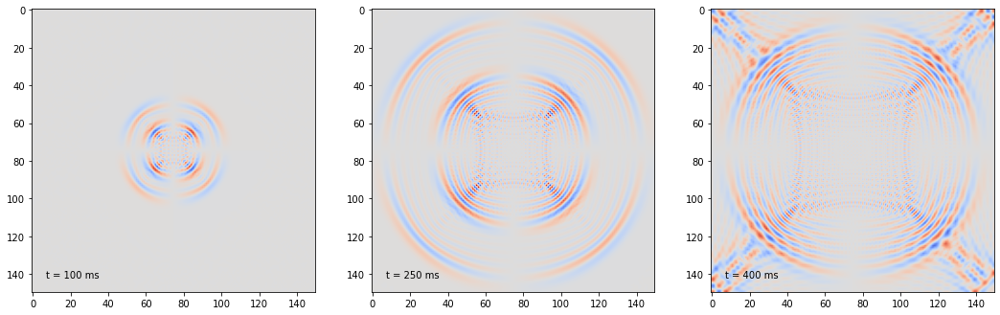

In [9]:
test.DrawZWaveField([100,250, 400])

In [12]:
test_2 = FirstOrderForward(pmodel, vpmodel, vsmodel, tmax, xmax, zmax, nt, nx, nz)
test.o4xFM(wavelet=source_array, wavalet_position=source_position, wavalet_direction='x')

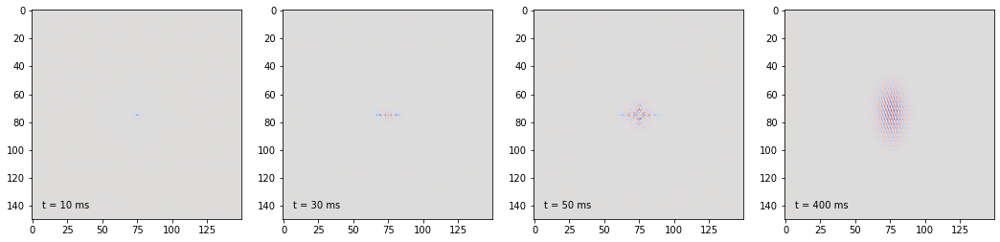

In [13]:
test.DrawXWaveField([10, 30, 50, 400])

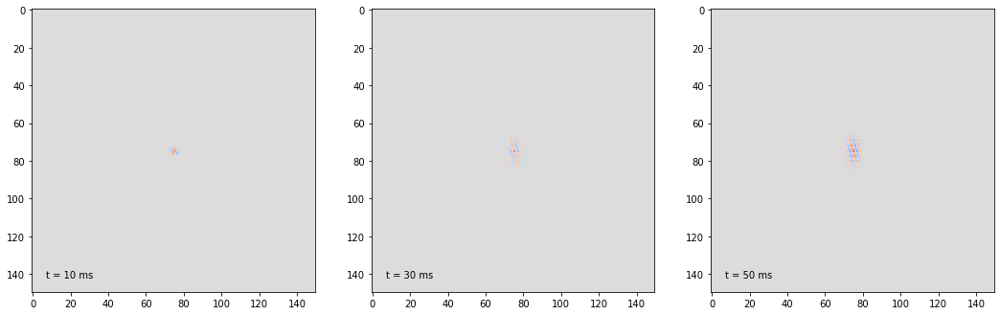

In [14]:
test.DrawZWaveField([10, 30, 50])

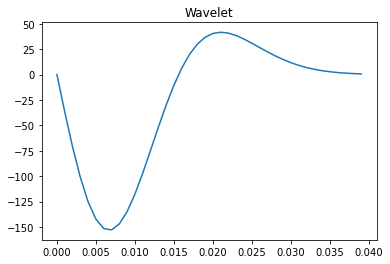

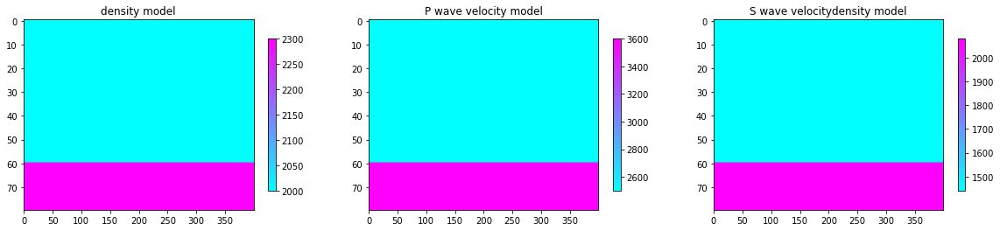

In [21]:
f_m = 25
source_array = np.zeros(40)
for tk , t in enumerate(np.arange(0, 0.04, 0.001)):
    #print(t,tk)
    source_array[tk] = \
            ((-4 * pi**2 * f_m**2 * t) + (2 * pi**2 * f_m**2 * t**2 - 1) * (pi**2 * f_m**2 * 2 * t)) * exp(-pi**2 * f_m**2 * t**2)

# draw wavelat
plt.plot(np.arange(0, 0.04, 0.001), source_array)
plt.title('Wavelet')
plt.show()

nx = 400
nz = 80
nt = 1900
dx = dz =7.5
dt = 0.6 / 1000
x_max = nx * dx 
z_max = nz * dz
t_max = nt * dt

pmodel = np.ones((nx,nz), dtype=float)
vsmodel = np.ones((nx,nz), dtype=float)
vpmodel = np.ones((nx,nz), dtype=float)

pmodel[:, 0:60] = 2000
vpmodel[:, 0:60] = 2500
vsmodel[:, 0:60] = 1440

pmodel[:, 60:] = 2300
vpmodel[:, 60:] = 3600
vsmodel[:, 60:] = 2080

pml_x = 10
pml_z = 10

kai_x, kai_z, sigma_x, sigma_z, alpha_x, alpha_z = FristOlderForward_PML.Cal_Auxiliary_Para(vsmodel, nx, nz, x_max, z_max, pml_x, pml_z)
test_3 = FristOlderForward_PML(pmodel, vpmodel, vsmodel, t_max, x_max, z_max, nt, nx, nz, kai_x, kai_z, sigma_x, sigma_z, alpha_x, alpha_z)
test_3.DrawModel()
test_4 = FirstOlderForward(pmodel, vpmodel, vsmodel, t_max, x_max, z_max, nt, nx, nz)

In [23]:
wavelet_position_pml = [11,100]  # [z,x]
test_4.o24FM(source_array, wavelet_position_pml, wavalet_direction='x')

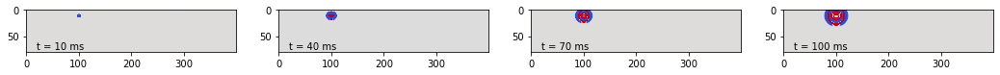

In [34]:
iterations_to_show = [10, 40, 70, 100]

fgr, axs = plt.subplots(1,len(iterations_to_show), figsize = (18,5))
        
for j, ax in enumerate(axs):
    ax.imshow(test_4._vx[:, :, iterations_to_show[j]].T, cmap = plt.cm.coolwarm, vmin = -1, vmax = 1, interpolation='quadric', aspect='auto')
    ax.annotate("t = {0} ms".format(iterations_to_show[j]), xy=(0.05, 0.05), xycoords="axes fraction")
plt.show()

In [17]:
wavelet_position_pml = [11,100]  # [z,x]
test_3.o24FM(source_array, wavelet_position_pml, wavalet_direction='x')

====after add source====1
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
====after add source====2
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
====after add source====3
[[ 4.27378493e-17  1.42931890e-16  1.61924380e-16  1.05446085e-18
   1.95163499e-16 -1.72762114e-16]
 [-8.26560665e-17  5.65661710e-18 -3.03207799e-16 -3.10753081e-16
   1.07494337e-16  1.65778000e-16]
 [ 2.84787187e-17 -3.09722180e-18  1.60431445e-16  6.74836092e-17
   6.88337824e-18 -5.77995227e-17]
 [-1.81190245e-16 -2.13326366e-16  1.38350848e-17  2.89865287e-17
  -1.42901713e-16 -1.69661678e-17]
 [-6.63812373e-17  4.77648013e-16  2.55185794e-16 -8.09580458e-17
   2.25820495e-17 -1.63001932e-16]
 [ 5.02379605e-17 -4.29919212e-17 -3.11030943e-16 -2.15826058e-16
   2.75468709e-16  5.30328906e-18]]
====after add source====4
[[ 5.43741167e-16  5.15958690e-16 -

====after add source====17
[[ 4.94703950e-06 -8.85345620e-06  6.80190141e-06 -3.50728159e-06
   1.35434881e-06 -4.08123636e-07]
 [-9.66126545e-06  1.69874198e-05 -1.27657539e-05  6.41770525e-06
  -2.40915170e-06  7.03602667e-07]
 [ 8.26103316e-06 -1.41485583e-05  1.02727055e-05 -4.95732128e-06
   1.77452647e-06 -4.90045915e-07]
 [-4.86793848e-06  8.07465524e-06 -5.61978092e-06  2.57765379e-06
  -8.69120355e-07  2.23283163e-07]
 [ 2.22970582e-06 -3.56505937e-06  2.36344336e-06 -1.02230190e-06
   3.21435111e-07 -7.57305557e-08]
 [-8.43757046e-07  1.29489033e-06 -8.13253064e-07  3.29468923e-07
  -9.57199894e-08  2.03808627e-08]]
====after add source====18
[[-3.11632894e-05  5.60055342e-05 -4.33983802e-05  2.26996907e-05
  -8.97064108e-06  2.81113925e-06]
 [ 6.08304805e-05 -1.07422971e-04  8.14444489e-05 -4.15530998e-05
   1.59761688e-05 -4.85898156e-06]
 [-5.19435046e-05  8.93821074e-05 -6.55218730e-05  3.21306190e-05
  -1.18073829e-05  3.41136052e-06]
 [ 3.05285908e-05 -5.09065904e-05  3

====after add source====33
[[ 3.34628428e+07 -6.11086335e+07  4.88986258e+07 -2.69130784e+07
   1.14666840e+07 -4.00926477e+06]
 [-6.51514558e+07  1.16938236e+08 -9.15895684e+07  4.92011834e+07
  -2.04138566e+07  6.93755613e+06]
 [ 5.52925216e+07 -9.67764546e+07  7.33910828e+07 -3.79821001e+07
   1.51198816e+07 -4.91256021e+06]
 [-3.21712396e+07  5.46296403e+07 -3.98436992e+07  1.97101093e+07
  -7.46263733e+06  2.29637405e+06]
 [ 1.44508819e+07 -2.37090417e+07  1.65435882e+07 -7.77607016e+06
   2.78204259e+06 -8.05159509e+05]
 [-5.31535995e+06  8.39538353e+06 -5.58012037e+06  2.48003087e+06
  -8.34015512e+05  2.25755202e+05]]
====after add source====34
[[-2.12523490e+08  3.88142439e+08 -3.10650916e+08  1.71030063e+08
  -7.29005321e+07  2.55034216e+07]
 [ 4.13766290e+08 -7.42732080e+08  5.81847498e+08 -3.12659638e+08
   1.29779191e+08 -4.41293215e+07]
 [-3.51130854e+08  6.14636091e+08 -4.66209212e+08  2.41352723e+08
  -9.61189593e+07  3.12474398e+07]
 [ 2.04280995e+08 -3.46925270e+08  2

====after add source====49
[[ 2.34882822e+20 -4.29138825e+20  3.43714700e+20 -1.89444580e+20
   8.08737043e+19 -2.83495739e+19]
 [-4.57240111e+20  8.21078145e+20 -6.43695445e+20  3.46279793e+20
  -1.43955020e+20  4.90478075e+19]
 [ 3.87917728e+20 -6.79290655e+20  5.15635846e+20 -2.67243496e+20
   1.06596505e+20 -3.47245282e+19]
 [-2.25590465e+20  3.83267091e+20 -2.79806810e+20  1.38622455e+20
  -5.25931078e+19  1.62273853e+19]
 [ 1.01263525e+20 -1.66227371e+20  1.16106968e+20 -5.46583787e+19
   1.95967635e+19 -5.68743628e+18]
 [-3.72151653e+19  5.88124391e+19 -3.91317811e+19  1.74195613e+19
  -5.87105383e+18  1.59384591e+18]]
====after add source====50
[[-1.49197566e+21  2.72589626e+21 -2.18329112e+21  1.20336892e+21
  -5.13721975e+20  1.80083039e+20]
 [ 2.90438603e+21 -5.21549518e+21  4.08877786e+21 -2.19959786e+21
   9.14423017e+20 -3.11562650e+20]
 [-2.46404508e+21  4.31485022e+21 -3.27533133e+21  1.69754926e+21
  -6.77115052e+20  2.20577600e+20]
 [ 1.43294083e+21 -2.43450205e+21  1

====after add source====64
[[-2.59729596e+32  4.74539987e+32 -3.80086586e+32  2.09498480e+32
  -8.94387178e+31  3.13537987e+31]
 [ 5.05605985e+32 -9.07940146e+32  7.11807542e+32 -3.82933647e+32
   1.59199863e+32 -5.42451378e+31]
 [-4.28945976e+32  7.51144615e+32 -5.70191282e+32  2.95528278e+32
  -1.17883943e+32  3.84037647e+31]
 [ 2.49445838e+32 -4.23801173e+32  3.09405950e+32 -1.53291722e+32
   5.81613123e+31 -1.79465232e+31]
 [-1.11969176e+32  1.83803286e+32 -1.28386401e+32  6.04411321e+31
  -2.16711025e+31  6.28985185e+30]
 [ 4.11483587e+31 -6.50290300e+31  4.32691120e+31 -1.92619880e+31
   6.49234226e+30 -1.76262458e+30]]
====after add source====65
[[ 1.64980691e+33 -3.01428646e+33  2.41431712e+33 -1.33073855e+33
   5.68116698e+32 -1.99160093e+32]
 [-3.21161787e+33  5.76725177e+33 -4.52141466e+33  2.43240212e+33
  -1.01124098e+33  3.44566421e+32]
 [ 2.72467194e+33 -4.77128338e+33  3.62186525e+33 -1.87720133e+33
   7.48801300e+32 -2.43941620e+32]
 [-1.58448388e+33  2.69199192e+33 -1

====after add source====79
[[ 2.87208249e+44 -5.24745147e+44  4.20299089e+44 -2.31663288e+44
   9.89014133e+43 -3.46711197e+43]
 [-5.59097550e+44  1.00399778e+45 -7.87115390e+44  4.23447701e+44
  -1.76043313e+44  5.99844148e+43]
 [ 4.74326945e+44 -8.30613350e+44  6.30516147e+44 -3.26794787e+44
   1.30356091e+44 -4.24669678e+43]
 [-2.75836147e+44  4.68637703e+44 -3.42140140e+44  1.69509684e+44
  -6.43147549e+43  1.98452941e+43]
 [ 1.23814930e+44 -2.03248788e+44  1.41969162e+44 -6.68356286e+43
   2.39638766e+43 -6.95532292e+42]
 [-4.55015881e+43  7.19087071e+43 -4.78467555e+43  2.12998272e+43
  -7.17921593e+42  1.94910963e+42]]
====after add source====80
[[-1.82435191e+45  3.33319052e+45 -2.66974731e+45  1.47152935e+45
  -6.28223551e+44  2.20231577e+44]
 [ 3.55139758e+45 -6.37741174e+45  4.99977099e+45 -2.68974736e+45
   1.11823028e+45 -3.81022082e+44]
 [-3.01293318e+45  5.27607077e+45 -4.00504979e+45  2.07580632e+45
  -8.28024224e+44  2.69750943e+44]
 [ 1.75211609e+45 -2.97679501e+45  2

====after add source====94
[[-3.17594159e+56  5.80261868e+56 -4.64765688e+56  2.56172697e+56
  -1.09364945e+56  3.83392430e+55]
 [ 6.18248658e+56 -1.11021822e+57  8.70390237e+56 -4.68247428e+56
   1.94668271e+56 -6.63306249e+55]
 [-5.24509529e+56  9.18490140e+56 -6.97223174e+56  3.61368867e+56
  -1.44147449e+56  4.69598725e+55]
 [ 3.05018902e+56 -5.18218374e+56  3.78337699e+56 -1.87443385e+56
   7.11190983e+55 -2.19448788e+55]
 [-1.36914227e+56  2.24751983e+56 -1.56989135e+56  7.39066688e+55
  -2.64991952e+55  7.69117926e+54]
 [ 5.03155355e+55 -7.95164587e+55  5.29088172e+55 -2.35532941e+55
   7.93875883e+54 -2.15532063e+54]]
====after add source====95
[[ 2.01736375e+57 -3.68583372e+57  2.95219993e+57 -1.62721353e+57
   6.94688080e+56 -2.43531554e+56]
 [-3.92712648e+57  7.05212587e+57 -5.52873428e+57  2.97431600e+57
  -1.23653632e+57  4.21333311e+56]
 [ 3.33169387e+57 -5.83426572e+57  4.42877401e+57 -2.29542148e+57
   9.15627163e+56 -2.98289947e+56]
 [-1.93748550e+57  3.29173234e+57 -2

====after add source====109
[[ 3.51194823e+68 -6.41652117e+68  5.13936732e+68 -2.83275125e+68
   1.20935482e+68 -4.23954388e+67]
 [-6.83657813e+68  1.22767651e+69 -9.62475339e+68  5.17786831e+68
  -2.15263686e+68  7.33482389e+67]
 [ 5.80001320e+68 -1.01566409e+69  7.70987635e+68 -3.99600787e+68
   1.59397888e+68 -5.19281094e+67]
 [-3.37289136e+68  5.73044576e+68 -4.18364878e+68  2.07274424e+68
  -7.86433205e+67  2.42665920e+67]
 [ 1.51399408e+68 -2.48530178e+68  1.73598191e+68 -8.17258088e+67
   2.93027436e+67 -8.50488674e+66]
 [-5.56387926e+67  8.79291000e+67 -5.85064370e+67  2.60451734e+67
  -8.77865958e+66  2.38334814e+66]]
====after add source====110
[[-2.23079577e+69  4.07578567e+69 -3.26453527e+69  1.79936864e+69
  -7.68184336e+68  2.69296582e+68]
 [ 4.34260660e+69 -7.79822308e+69  6.11366049e+69 -3.28899117e+69
   1.36735877e+69 -4.65909319e+68]
 [-3.68417871e+69  6.45151638e+69 -4.89732718e+69  2.53827131e+69
  -1.01249822e+69  3.29848275e+68]
 [ 2.14246659e+69 -3.63998935e+69 

====after add source====122
[[-9.62499011e+78  1.75853824e+79 -1.40851620e+79  7.76355487e+78
  -3.31440768e+78  1.16190688e+78]
 [ 1.87366079e+79 -3.36462087e+79  2.63779959e+79 -1.41906793e+79
   5.89960533e+78 -2.01021207e+78]
 [-1.58957553e+79  2.78357088e+79 -2.11300050e+79  1.09516239e+79
  -4.36852422e+78  1.42316317e+78]
 [ 9.24388510e+78 -1.57050959e+79  1.14658803e+79 -5.68064833e+78
   2.15533126e+78 -6.65060225e+77]
 [-4.14931458e+78  6.81132051e+78 -4.75770358e+78  2.23981121e+78
  -8.03083071e+77  2.33088432e+77]
 [ 1.52485969e+78 -2.40982116e+78  1.60345153e+78 -7.13804759e+77
   2.40591564e+77 -6.53190218e+76]]
====after add source====123
[[ 6.11381085e+79 -1.11702662e+80  8.94691995e+79 -4.93142387e+79
   2.10531766e+79 -7.38045316e+78]
 [-1.19015267e+80  2.13721317e+80 -1.67553500e+80  9.01394478e+79
  -3.74743981e+79  1.27689029e+79]
 [ 1.00970121e+80 -1.76812918e+80  1.34218168e+80 -6.95649100e+79
   2.77489436e+79 -9.03995782e+78]
 [-5.87173228e+79  9.97590488e+79 

====after add source====135
[[ 2.63786447e+89 -4.81952241e+89  3.86023755e+89 -2.12771185e+89
   9.08360234e+88 -3.18436988e+88]
 [-5.13503200e+89  9.22121866e+89 -7.22926231e+89  3.88915608e+89
  -1.61687016e+89  5.50927008e+88]
 [ 4.35645623e+89 -7.62876910e+89  5.79097627e+89 -3.00144720e+89
   1.19725576e+89 -3.90037967e+88]
 [-2.53341726e+89  4.30420333e+89 -3.14238643e+89  1.55686190e+89
  -5.90698972e+88  1.82269147e+88]
 [ 1.13717826e+89 -1.86673858e+89  1.30391586e+89 -6.13851893e+88
   2.20096257e+88 -6.38811766e+87]
 [-4.17909332e+88  6.60445523e+88 -4.39448537e+88  1.95628275e+88
  -6.59375158e+87  1.79016004e+87]]
====after add source====136
[[-1.67557621e+90  3.06136922e+90 -2.45202977e+90  1.35152636e+90
  -5.76992038e+89  2.02271742e+89]
 [ 3.26178147e+90 -5.85733451e+90  4.59204029e+90 -2.47039887e+90
   1.02703880e+90 -3.49949816e+89]
 [-2.76722875e+90  4.84580772e+90 -3.67843844e+90  1.90652460e+90
  -7.60498989e+89  2.47752811e+89]
 [ 1.60923115e+90 -2.73403762e+90 

====after add source====148
[[-7.22944011e+099  1.32085818e+100 -1.05795262e+100  5.83129482e+099
  -2.48948951e+099  8.72721538e+098]
 [ 1.40732804e+100 -2.52720520e+100  1.98128143e+100 -1.06587815e+100
   4.43126101e+099 -1.50989327e+099]
 [-1.19394835e+100  2.09077191e+100 -1.58709883e+100  8.22588992e+099
  -3.28124849e+099  1.06895413e+099]
 [ 6.94318779e+099 -1.17962771e+100  8.61215380e+099 -4.26679991e+099
   1.61889395e+099 -4.99534339e+098]
 [-3.11659762e+099  5.11606071e+099 -3.57356555e+099  1.68234781e+099
  -6.03204877e+098  1.75075386e+098]
 [ 1.14533954e+099 -1.81004423e+099  1.20437078e+099 -5.36146915e+098
   1.80711074e+098 -4.90618641e+097]]
====after add source====149
[[ 4.59215323e+100 -8.39011468e+100  6.72013386e+100 -3.70404885e+100
   1.58132817e+100 -5.54354275e+099]
 [-8.93937276e+100  1.60528524e+101 -1.25851349e+101  6.77047698e+100
  -2.81474488e+100  9.59086894e+099]
 [ 7.58398120e+100 -1.32806204e+101  1.00812800e+101 -5.22509992e+100
   2.08425488e+10

====after add source====164
[[-5.07799151e+112  9.27776775e+112 -7.43110716e+112  4.09592792e+112
  -1.74862872e+112  6.13003565e+111]
 [ 9.88513596e+112 -1.77512039e+113  1.39166106e+113 -7.48677645e+112
   3.11253783e+112 -1.06055588e+112]
 [-8.38634737e+112  1.46856767e+113 -1.11478542e+113  5.77790238e+112
  -2.30476382e+112  7.50838228e+111]
 [ 4.87692658e+112 -8.28575851e+112  6.04921588e+112 -2.99701960e+112
   1.13711845e+112 -3.50875184e+111]
 [-2.18911230e+112  3.59354424e+112 -2.51008865e+112  1.18168873e+112
  -4.23693840e+111  1.22973745e+111]
 [ 8.04491689e+111 -1.27138327e+112  8.45955495e+111 -3.76592024e+111
   1.26932278e+111 -3.44612758e+110]]
====after add source====165
[[ 3.22554925e+113 -5.89325459e+113  4.72025250e+113 -2.60174071e+113
   1.11073207e+113 -3.89380956e+112]
 [-6.27905596e+113  1.12755963e+114 -8.83985584e+113  4.75561373e+113
  -1.97708957e+113  6.73666983e+112]
 [ 5.32702278e+113 -9.32836798e+113  7.08113680e+113 -3.67013388e+113
   1.46399008e+11

====after add source====180
[[-3.56680426e+125  6.51674613e+125 -5.21964336e+125  2.87699834e+125
  -1.22824474e+125  4.30576484e+124]
 [ 6.94336432e+125 -1.24685261e+126  9.77509040e+125 -5.25874572e+125
   2.18626068e+125 -7.44939258e+124]
 [-5.89060841e+125  1.03152859e+126 -7.83030330e+125  4.05842483e+125
  -1.61887655e+125  5.27392176e+124]
 [ 3.42557534e+125 -5.81995435e+125  4.24899666e+125 -2.10512016e+125
   7.98717157e+124 -2.46456320e+124]
 [-1.53764241e+125  2.52412177e+125 -1.76309765e+125  8.30023519e+124
  -2.97604474e+124  8.63773161e+123]
 [ 5.65078610e+124 -8.93025375e+124  5.94202976e+124 -2.64519945e+124
   8.91578074e+123 -2.42057563e+123]]
====after add source====181
[[ 2.26564042e+126 -4.13944875e+126  3.31552675e+126 -1.82747447e+126
   7.80183244e+125 -2.73502949e+125]
 [-4.41043738e+126  7.92002999e+126 -6.20915482e+126  3.34036465e+126
  -1.38871668e+126  4.73186743e+125]
 [ 3.74172495e+126 -6.55228797e+126  4.97382260e+126 -2.57791868e+126
   1.02831327e+12

====after add source====196
[[-2.50533949e+138  4.57739203e+138 -3.66630116e+138  2.02081668e+138
  -8.62724673e+137  3.02438874e+137]
 [ 4.87705058e+138 -8.75794928e+138  6.86606782e+138 -3.69376684e+138
   1.53563941e+138 -5.23248713e+137]
 [-4.13759006e+138  7.24550358e+138 -5.50004054e+138  2.85065600e+138
  -1.13710623e+138  3.70442656e+137]
 [ 2.40613965e+138 -4.08796232e+138  2.98451452e+138 -1.47864594e+138
   5.61022553e+137 -1.73112037e+137]
 [-1.08004700e+138  1.77295457e+138 -1.23840778e+138  5.83012283e+137
  -2.09038732e+137  6.06718185e+136]
 [ 3.96913778e+137 -6.27265072e+137  4.17370864e+137 -1.85800009e+137
   6.26248482e+136 -1.70022330e+136]]
====after add source====197
[[ 1.59139610e+139 -2.90756757e+139  2.32884102e+139 -1.28362635e+139
   5.48004248e+138 -1.92109711e+138]
 [-3.09791121e+139  5.56306498e+139 -4.36133850e+139  2.34628727e+139
  -9.75440890e+138  3.32368514e+138]
 [ 2.62820457e+139 -4.60235677e+139  3.49363554e+139 -1.81074177e+139
   7.22291903e+13

====after add source====209
[[ 6.86623668e+148 -1.25449893e+149  1.00480161e+149 -5.53833350e+148
   2.36441881e+148 -8.28876447e+147]
 [-1.33662459e+149  2.40023969e+149 -1.88174285e+149  1.01232897e+149
  -4.20863669e+148  1.43403699e+148]
 [ 1.13396499e+149 -1.98573258e+149  1.50736379e+149 -7.81262536e+148
   3.11640022e+148 -1.01525041e+148]
 [-6.59436553e+148  1.12036381e+149 -8.17948353e+148  4.05243803e+148
  -1.53756154e+148  4.74437985e+147]
 [ 2.96002133e+148 -4.85903240e+148  3.39403142e+148 -1.59782750e+148
   5.72900167e+147 -1.66279687e+147]
 [-1.08779826e+148  1.71910852e+148 -1.14386380e+148  5.09211164e+147
  -1.71632241e+147  4.65970207e+146]]
====after add source====210
[[-4.36144576e+149  7.96859954e+149 -6.38251772e+149  3.51795930e+149
  -1.50188303e+149  5.26503795e+148]
 [ 8.49026318e+149 -1.52463652e+150  1.19528641e+150 -6.43033163e+149
   2.67333352e+149 -9.10902851e+148]
 [-7.20296580e+149  1.26134087e+150 -9.57480160e+149  4.96259353e+149
  -1.97954297e+14

====after add source====223
[[ 1.19531581e+160 -2.18390724e+160  1.74921912e+160 -9.64146430e+159
   4.11612256e+159 -1.44295801e+159]
 [-2.32687653e+160  4.17848171e+160 -3.27585121e+160  1.76232320e+160
  -7.32664805e+159  2.49645791e+159]
 [ 1.97407450e+160 -3.45688279e+160  2.62410960e+160 -1.36006884e+160
   5.42521706e+159 -1.76740902e+159]
 [-1.14798684e+160  1.95039674e+160 -1.42393372e+160  7.05472802e+159
  -2.67667966e+159  8.25930199e+158]
 [ 5.15298328e+159 -8.45889604e+159  5.90853417e+159 -2.78159428e+159
   9.97339092e+158 -2.89469687e+158]
 [-1.89370469e+159  2.99272757e+159 -1.99130694e+159  8.86465442e+158
  -2.98787735e+158  8.11188981e+157]]
====after add source====224
[[-7.59266728e+160  1.38722177e+161 -1.11110710e+161  6.12427529e+160
  -2.61456838e+160  9.16569495e+159]
 [ 1.47803611e+161 -2.65417902e+161  2.08082652e+161 -1.11943083e+161
   4.65389988e+160 -1.58575451e+160]
 [-1.25393564e+161  2.19581810e+161 -1.66683909e+161  8.63918150e+160
  -3.44610754e+16

====after add source====238
[[-1.32177722e+172  2.41495915e+172 -1.93428211e+172  1.06615070e+172
  -4.55159800e+171  1.59561934e+171]
 [ 2.57305422e+172 -4.62055458e+172  3.62242804e+172 -1.94877257e+172
   8.10178902e+171 -2.76057689e+171]
 [-2.18292663e+172  3.82261231e+172 -2.90173381e+172  1.50396071e+172
  -5.99919141e+171  1.95439646e+171]
 [ 1.26944097e+172 -2.15674382e+172  1.57458233e+172 -7.80110053e+171
   2.95986565e+171 -9.13311540e+170]
 [-5.69815597e+171  9.35382600e+171 -6.53364225e+171  3.07587997e+171
  -1.10285506e+171  3.20094853e+170]
 [ 2.09405389e+171 -3.30935064e+171  2.20198222e+171 -9.80251260e+170
   3.30398727e+170 -8.97010739e+169]]
====after add source====239
[[ 8.39595242e+172 -1.53398635e+173  1.22865944e+173 -6.77220824e+172
   2.89118315e+172 -1.01354025e+172]
 [-1.63440862e+173  2.93498450e+173 -2.30097274e+173  1.23786380e+173
  -5.14627081e+172  1.75352335e+172]
 [ 1.38659888e+173 -2.42813015e+173  1.84318648e+173 -9.55318522e+172
   3.81069706e+17

====after add source====253
[[ 1.46161793e+184 -2.67045576e+184  2.13892430e+184 -1.17894677e+184
   5.03314564e+183 -1.76443186e+183]
 [-2.84527690e+184  5.10939765e+184 -4.00567184e+184  2.15494781e+184
  -8.95893796e+183  3.05263899e+183]
 [ 2.41387479e+184 -4.22703510e+184  3.20872996e+184 -1.66307598e+184
   6.63389080e+183 -2.16116670e+183]
 [-1.40374463e+184  2.38492191e+184 -1.74116919e+184  8.62643738e+183
  -3.27301201e+183  1.00993761e+183]
 [ 6.30100657e+183 -1.03434373e+184  7.22488519e+183 -3.40130035e+183
   1.21953436e+183 -3.53960085e+182]
 [-2.31559953e+183  3.65947163e+183 -2.43494641e+183  1.08395938e+183
  -3.65354083e+182  9.91912223e+181]]
====after add source====254
[[-9.28422311e+184  1.69627825e+185 -1.35864852e+185  7.48869086e+184
  -3.19706307e+184  1.12077026e+184]
 [ 1.80732495e+185 -3.24549849e+185  2.54440988e+185 -1.36882669e+185
   5.69073334e+184 -1.93904172e+184]
 [-1.53329756e+185  2.68502022e+185 -2.03819098e+185  1.05638882e+185
  -4.21385924e+18

====after add source====268
[[-1.61625344e+196  2.95298328e+196 -2.36521712e+196  1.30367638e+196
  -5.56563981e+195  1.95110432e+195]
 [ 3.14630005e+196 -5.64995910e+196  4.42946186e+196 -2.38293588e+196
   9.90677110e+195 -3.37560053e+195]
 [-2.66925668e+196  4.67424480e+196 -3.54820553e+196  1.83902524e+196
  -7.33573979e+195  2.38981271e+195]
 [ 1.55225729e+196 -2.63724066e+196  1.92538052e+196 -9.53909280e+195
   3.61928846e+195 -1.11678647e+195]
 [-6.96763724e+195  1.14377470e+196 -7.98925991e+195  3.76114938e+195
  -1.34855803e+195  3.91408173e+194]
 [ 2.56058415e+195 -4.04663454e+195  2.69255763e+195 -1.19863956e+195
   4.04007627e+194 -1.09685405e+194]]
====after add source====269
[[ 1.02664706e+197 -1.87574023e+197  1.50239013e+197 -8.28097556e+196
   3.53530432e+196 -1.23934494e+196]
 [-1.99853540e+197  3.58886408e+197 -2.81360206e+197  1.51364511e+197
  -6.29279864e+196  2.14418747e+196]
 [ 1.69551659e+197 -2.96908862e+197  2.25382647e+197 -1.16815211e+197
   4.65967497e+19

====after add source====283
[[ 1.78724899e+208 -3.26540149e+208  2.61545116e+208 -1.44160207e+208
   6.15447053e+207 -2.15752626e+207]
 [-3.47917070e+208  6.24771059e+208 -4.89808781e+208  2.63504451e+208
  -1.09548826e+208  3.73273059e+207]
 [ 2.95165733e+208 -5.16876817e+208  3.92359677e+208 -2.03358950e+208
   8.11184264e+207 -2.64264890e+207]
 [-1.71648222e+208  2.91625410e+208 -2.12908095e+208  1.05483049e+208
  -4.00220009e+207  1.23493968e+207]
 [ 7.70479577e+207 -1.26478319e+208  8.83450355e+207 -4.15906955e+207
   1.49123209e+207 -4.32818175e+206]
 [-2.83148752e+207  4.47475831e+207 -2.97742346e+207  1.32545262e+207
  -4.46750620e+206  1.21289845e+206]]
====after add source====284
[[-1.13526374e+209  2.07418884e+209 -1.66133923e+209  9.15708198e+208
  -3.90933064e+208  1.37046452e+208]
 [ 2.20997542e+209 -3.96855689e+209  3.11127410e+209 -1.67378497e+209
   6.95856094e+208 -2.37103712e+208]
 [-1.87489799e+209  3.28321074e+209 -2.49227565e+209  1.29173967e+209
  -5.15265689e+20

====after add source====296
[[-4.89820827e+218  8.94929395e+218 -7.16801327e+218  3.95091405e+218
  -1.68671957e+218  5.91300542e+217]
 [ 9.53515865e+218 -1.71227332e+219  1.34239014e+219 -7.22171162e+218
   3.00234029e+218 -1.02300754e+218]
 [-8.08943377e+218  1.41657391e+219 -1.07531711e+219  5.57333921e+218
  -2.22316504e+218  7.24255251e+217]
 [ 4.70426192e+218 -7.99240620e+218  5.83504702e+218 -2.89091192e+218
   1.09685946e+218 -3.38452659e+217]
 [-2.11160809e+218  3.46631696e+218 -2.42122046e+218  1.13985175e+218
  -4.08693214e+217  1.18619933e+217]
 [ 7.76009144e+217 -1.22637071e+218  8.16004949e+217 -3.63259010e+217
   1.22438317e+217 -3.32411950e+216]]
====after add source====297
[[ 3.11135061e+219 -5.68460745e+219  4.55313479e+219 -2.50962764e+219
   1.07140727e+219 -3.75595157e+218]
 [-6.05674975e+219  1.08763906e+220 -8.52688605e+219  4.58724408e+219
  -1.90709190e+219  6.49816208e+218]
 [ 5.13842273e+219 -8.99810271e+219  6.83043341e+219 -3.54019499e+219
   1.41215839e+21

====after add source====309
[[ 1.34242315e+229 -2.45268040e+229  1.96449527e+229 -1.08280379e+229
   4.62269318e+228 -1.62054264e+228]
 [-2.61324489e+229  4.69272685e+229 -3.67900975e+229  1.97921206e+229
  -8.22833758e+228  2.80369663e+228]
 [ 2.21702357e+229 -3.88232086e+229  2.94705839e+229 -1.52745232e+229
   6.09289775e+228 -1.98492380e+228]
 [-1.28926942e+229  2.19043179e+229 -1.59917704e+229  7.92295239e+228
  -3.00609825e+228  9.27577310e+227]
 [ 5.78716019e+228 -9.49993117e+228  6.63569662e+228 -3.12392469e+228
   1.12008147e+228 -3.25094680e+227]
 [-2.12676265e+228  3.36104213e+228 -2.23637680e+228  9.95562618e+227
  -3.35559498e+227  9.11021894e+226]]


KeyboardInterrupt: 

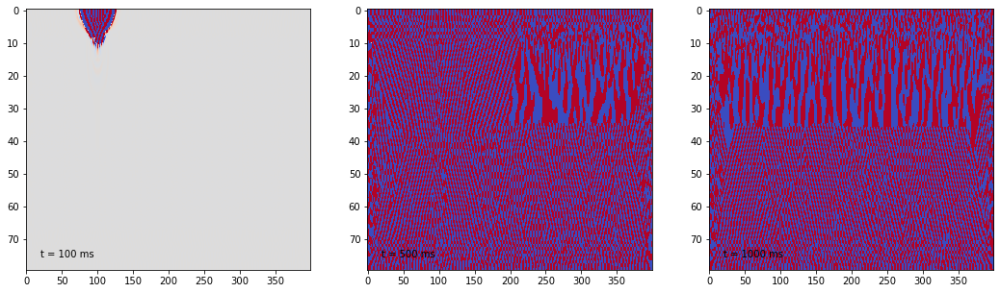

In [45]:
iterations_to_show = [100, 500, 1000]

fgr, axs = plt.subplots(1,len(iterations_to_show), figsize = (18,5))
        
for j, ax in enumerate(axs):
    ax.imshow(test_3._vx[:, :, iterations_to_show[j]].T, cmap = plt.cm.coolwarm, vmin = -1000, vmax = 1000, interpolation='quadric', aspect='auto')
    ax.annotate("t = {0} ms".format(iterations_to_show[j]), xy=(0.05, 0.05), xycoords="axes fraction")
plt.show()

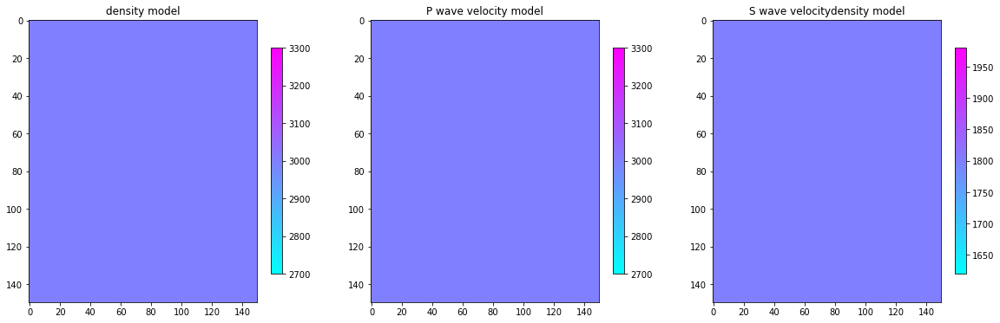

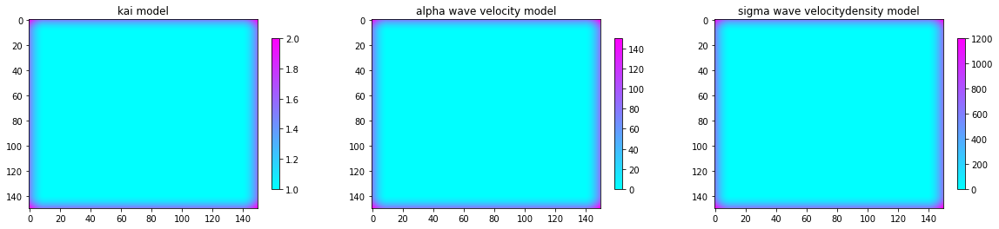

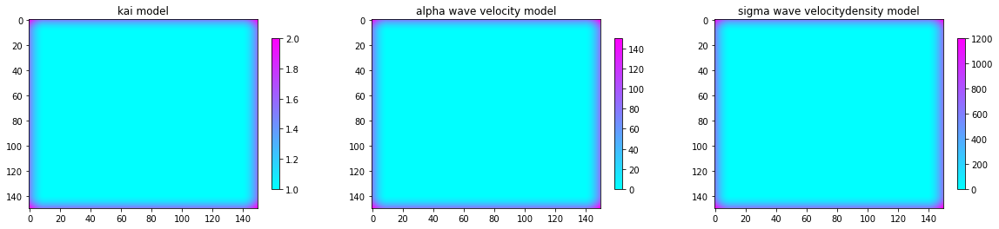

In [6]:
# a test model
x_max = 1500
z_max = 1500
nx = 150
nz = 150
t_max = 0.5
nt = 500
dx = 10
dz = 10
dt = 0.5 / 500
f_m = 30

source_position = [75, 75]
source_direction = 'z'

pmodel = 3000 * np.ones((nx, nz), dtype=float)
vpmodel = 3000 * np.ones((nx, nz), dtype=float)
vsmodel = 1800 * np.ones((nx, nz), dtype=float)

pml_x = 10
pml_z = 10

kai_x, kai_z, sigma_x, sigma_z, alpha_x, alpha_z = FristOlderForward_PML.Cal_Auxiliary_Para(vsmodel, nx, nz, x_max, z_max, pml_x, pml_z)
test_3 = FristOlderForward_PML(pmodel, vpmodel, vsmodel, t_max, x_max, z_max, nt, nx, nz, kai_x, kai_z, sigma_x, sigma_z, alpha_x, alpha_z)
test_3.DrawModel()

plt.figure(figsize=(20, 4))
        
ax1 = plt.subplot(1,3,1)
plt.imshow(test_3._kai_x.T, cmap=plt.cm.cool, aspect='auto')
plt.title("kai model")
plt.colorbar(shrink=0.8)

plt.subplot(1,3,2)
plt.imshow(test_3._alpha_x.T, cmap=plt.cm.cool, aspect='auto')
plt.title("alpha wave velocity model")
plt.colorbar(shrink=0.8)

plt.subplot(1,3,3)
plt.imshow(test_3._sigma_x.T, cmap=plt.cm.cool, aspect='auto')
plt.title("sigma wave velocitydensity model")
plt.colorbar(shrink=0.8)
plt.show()

plt.figure(figsize=(20, 4))
        
ax1 = plt.subplot(1,3,1)
plt.imshow(test_3._kai_z.T, cmap=plt.cm.cool, aspect='auto')
plt.title("kai model")
plt.colorbar(shrink=0.8)

plt.subplot(1,3,2)
plt.imshow(test_3._alpha_z.T, cmap=plt.cm.cool, aspect='auto')
plt.title("alpha wave velocity model")
plt.colorbar(shrink=0.8)

plt.subplot(1,3,3)
plt.imshow(test_3._sigma_z.T, cmap=plt.cm.cool, aspect='auto')
plt.title("sigma wave velocitydensity model")
plt.colorbar(shrink=0.8)
plt.show()

# 30Hz ricker wavelet
# f(t)=(1-2*pi^2*f_m^2*t^2)e^(-pi^2*f_m^2*t^2)
source_array = np.zeros(40)
for tk , t in enumerate(np.arange(0, 0.04, 0.001)):
    #print(t,tk)
    source_array[tk] = \
            ((-4 * pi**2 * f_m**2 * t) + (2 * pi**2 * f_m**2 * t**2 - 1) * (pi**2 * f_m**2 * 2 * t)) * exp(-pi**2 * f_m**2 * t**2)

In [7]:
wavelet_position_pml = [75,75]  # [z,x]
test_3.o24FM(source_array, wavelet_position_pml, wavalet_direction='x')

origin vx and vz for1times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction of vx and vz for1times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
after correction vx and vz for1times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0

[[ 2.66285887e-10  7.10462304e-10 -2.73631263e-09 -3.14708816e-09
   2.16660856e-09]
 [-4.51077015e-09  4.17032137e-09  1.17333245e-09  1.01674136e-09
  -6.07865093e-10]
 [ 7.90262490e-09 -1.14749806e-08  5.19246147e-09 -2.24810760e-09
   2.35739793e-09]
 [ 2.99208061e-09 -1.83858252e-10 -4.64754703e-09  3.61593108e-09
  -1.28367485e-09]
 [-1.45206655e-09  6.21657358e-10 -8.74463956e-10 -9.18394236e-10
   1.08644210e-09]]
correction_h in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_h in pml layer:
[[-1.15562443e-09 -1.62119383e-09  1.54413771e-09 -1.62521100e-09
   1.70713981e-09]
 [-4.00735818e-09 -1.62264059e-09 -4.92816211e-10  5.03809232e-09
   1.04065912e-09]
 [ 7.25597834e-09 -5.33952184e-09 -1.34533272e-09  1.13548143e-09
   7.90598976e-10]
 [ 9.41278877e-10  1.01589978e-09 -3.12128645e-10 -4.45022416e-10
   1.62280920e-09]
 [-3.39341131e-09  1.39324479e-09  9.28231521e-10 -6.36182483e-10
  -2.53267394e-11]]
after 

correction of r, t and h for8times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 2.82980794e-06 -2.65050171e-06  8.38129576e-07  7.85275035e-08
  -8.83163555e-08]
 [-3.07363052e-06  2.83575680e-06 -9.54787427e-07  9.66293149e-08
   2.06485807e-08]
 [ 1.77339600e-06 -1.53828757e-06  4.80605489e-07 -3.57253468e-08
  -5.90663736e-09]
 [-7.17169095e-07  4.97636374e-07 -1.46092062e-07 -3.08661408e-08
  -2.98701937e-08]
 [ 2.26015508e-07 -1.29045243e-07  2.74203593e-08  2.00636124e-08
   6.89105965e-09]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 2.24966659e-06 -2.85984925e-06  1.10822521e-06 -1.46865371e-08
  -1.45777837e-07]
 [-2.38287844e-06  3.02396490e-06 -1.34938245e-06  3.46800976e-07
  -7.21581600e-08]
 [ 1.20959215e-06 -1.42802885e-06  5.72801456e-07 -1.08239358e-07
  -1.63123173e-

correction of r, t and h for12times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 1.63857413e-03 -2.13085475e-03  1.06552146e-03 -3.34073281e-04
   7.45568483e-05]
 [-1.55367953e-03  1.88025229e-03 -8.58700912e-04  2.42545067e-04
  -4.81449363e-05]
 [ 8.25764662e-04 -9.09348780e-04  3.69043315e-04 -9.10797365e-05
   1.54020799e-05]
 [-3.11289116e-04  3.06753418e-04 -1.08453900e-04  2.29047503e-05
  -3.14393148e-06]
 [ 9.23895595e-05 -8.01391443e-05  2.42568259e-05 -4.21950205e-06
   5.48423179e-07]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 1.55693878e-03 -2.42965699e-03  1.44620991e-03 -5.34137936e-04
   1.39143133e-04]
 [-1.28373359e-03  1.87850859e-03 -1.02205507e-03  3.39841643e-04
  -7.89388350e-05]
 [ 5.97306544e-04 -8.07792655e-04  3.94059386e-04 -1.15261114e-04
   2.31578655e

correction of r, t and h for16times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 1.14333356e+00 -1.54764966e+00  8.27641945e-01 -2.87359706e-01
   7.49334582e-02]
 [-1.05204366e+00  1.32494111e+00 -6.46098587e-01  2.01331155e-01
  -4.64668618e-02]
 [ 5.35337968e-01 -6.13930601e-01  2.66057844e-01 -7.23432583e-02
   1.43482236e-02]
 [-1.91496113e-01  1.96774594e-01 -7.44321261e-02  1.73293446e-02
  -2.89588889e-03]
 [ 5.35233513e-02 -4.86311085e-02  1.58312279e-02 -3.10979113e-03
   4.30389467e-04]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 1.11467622e+00 -1.78590684e+00  1.11923222e+00 -4.49112859e-01
   1.33132613e-01]
 [-8.79571181e-01  1.32020120e+00 -7.52968125e-01  2.69579741e-01
  -7.01830135e-02]
 [ 3.87748489e-01 -5.37634231e-01  2.74155329e-01 -8.58677789e-02
   1.92284720e

omega_zz in pml layer:
[[-20.0924369    0.03250927  15.5868217  -12.19295137   5.43423357]
 [ 14.63315398   1.50585103 -12.03665183   8.243576    -3.22613708]
 [ -5.82200923  -1.30397363   5.02925014  -2.97261693   1.00222355]
 [  1.62153584   0.580281    -1.45250842   0.73453243  -0.21057712]
 [ -0.35299252  -0.17778468   0.32399154  -0.13933353   0.0336284 ]]
origin r, t and h for20times:
r in souece:
[[-9.72858075e+06 -1.47587781e+08  1.01156750e+09 -1.47587781e+08
  -9.72858075e+06]
 [-3.73871176e+08  1.15941913e+08  9.55881738e+08  1.15941913e+08
  -3.73871176e+08]
 [ 3.73871176e+08 -1.15941913e+08 -9.55881738e+08 -1.15941913e+08
   3.73871176e+08]
 [ 9.72858075e+06  1.47587781e+08 -1.01156750e+09  1.47587781e+08
   9.72858075e+06]
 [ 6.25340603e+07  1.52535662e+08 -1.26138468e+08  1.52535662e+08
   6.25340603e+07]]
r in pml layer:
[[ 2.71448117e+02 -3.82235409e+02  2.13249379e+02 -7.76604576e+01
   2.13722819e+01]
 [-2.52072727e+02  3.31449132e+02 -1.69428083e+02  5.56924272e+01


ux in pml layer:
[[ 2.02215052e-02 -2.86047895e-02  1.59831548e-02 -5.78789658e-03
   1.57068043e-03]
 [-3.25429991e-02  4.35931757e-02 -2.27662501e-02  7.63939361e-03
  -1.90951391e-03]
 [ 2.02376925e-02 -2.48832027e-02  1.16503412e-02 -3.44231332e-03
   7.46023975e-04]
 [-8.06565507e-03  8.92451741e-03 -3.65810442e-03  9.26381598e-04
  -1.68955780e-04]
 [ 2.39101201e-03 -2.34362449e-03  8.26231292e-04 -1.75828437e-04
   2.63913855e-05]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-4.76412226e-02  4.32806124e-02 -2.17320408e-02  7.65266811e-03
  -2.09722993e-03]
 [ 3.69018715e-02 -3.10730364e-02  1.41399437e-02 -4.43812039e-03
   1.06987370e-03]
 [-1.57091278e-02  1.20874192e-02 -4.90080402e-03  1.34674174e-03
  -2.80506338e-04]
 [ 4.70283833e-03 -3.27287620e-03  1.16902175e-03 -2.78163328e-04
   4.95316331e-05]
 [-1.10322830e-03  6.89014997e-04 -2.15107622e-04  4.39903154e-05
  -6.64424772e-06]]
after cor

 [-43.04138765  18.84166387 -18.84166387  43.04138765  61.59296215]]
uz in pml layer:
[[-1.14507253e+01  1.05754432e+01 -5.36428043e+00  1.90029990e+00
  -5.21513127e-01]
 [ 9.04771973e+00 -7.77718748e+00  3.58576912e+00 -1.13440450e+00
   2.74072196e-01]
 [-3.90649691e+00  3.07904696e+00 -1.26635408e+00  3.50389517e-01
  -7.28898527e-02]
 [ 1.18089144e+00 -8.44161056e-01  3.05614310e-01 -7.28961529e-02
   1.28543915e-02]
 [-2.78464477e-01  1.79005333e-01 -5.64761562e-02  1.14831550e-02
  -1.69299043e-03]]
correction of vx and vz for28times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 1.45291726e+01 -2.05586632e+01  1.14928249e+01 -4.16459494e+00
   1.13115209e+00]
 [-2.33777549e+01  3.13252718e+01 -1.63672006e+01  5.49571273e+00
  -1.37486431e+00]
 [ 1.45321858e+01 -1.78737156e+01  8.37252579e+00 -2.47542373e+00
   5.36935045e-01]
 [-5.78833713e+00  6.40695106e+00 -2.62749441e+00  6.65832898e-01
  -1.2154

phi for31times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-263.09457469  348.01665729 -178.34508489   58.25946556  -14.07249263]
 [  -2.08560216   34.42391918  -37.39832708   19.38014374   -6.53050187]
 [ 206.55668021 -287.33017605  154.26930773  -52.254945     12.93815734]
 [-158.20860523  195.22067595  -90.81086294   26.25729997   -5.48650502]
 [  69.06147506  -75.60955659   30.32772796   -7.40200067    1.28214856]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 346.34125174  201.8231056  -307.81494585  179.79559263  -69.61748645]
 [-247.76429241 -178.16818795  228.66896579 -118.70333172   40.71214835]
 [  95.75406896   84.33069729  -91.22059972   41.48677961  -12.41799021]
 [ -25.68364281  -27.29335112   25.04798999   -9.90355212    2.56778291]
 [   5.34511732    6.75537065   -5.29562367    1.8124997    -0.405

phi for35times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-189056.22088158  250083.71108088 -128161.13082638   41867.30029915
   -10113.39169222]
 [  -1502.18645786   24741.19196525  -26877.0243362    13927.93431107
    -4693.40624563]
 [ 148431.32627299 -206477.14765468  110860.9553162   -37552.48136733
     9298.22693075]
 [-113685.58588746  140283.54590247  -65257.1087225    18869.16507595
    -3942.89415462]
 [  49624.79303138  -54330.80820765   21793.10992387   -5319.14317047
      921.40045499]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 248884.71717996  145025.94355956 -221196.58092303  129204.50840372
   -50029.824667  ]
 [-178042.614624   -128026.69286387  164319.26200208  -85300.81060863
    29256.69977226]
 [  68806.60242635   60596.36527649  -65548.50375843   29811.77793837
    -8923.59420686]
 [ 

correction of vx and vz for39times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-1.04127422e+09  1.47349490e+09 -8.23812200e+08  2.98565706e+08
  -8.11101107e+07]
 [ 1.67535772e+09 -2.24506895e+09  1.17315804e+09 -3.93976740e+08
   9.85805154e+07]
 [-1.04134382e+09  1.28088410e+09 -6.00066390e+08  1.77442005e+08
  -3.84957363e+07]
 [ 4.14721253e+08 -4.59080490e+08  1.88290827e+08 -4.77219711e+07
   8.71310218e+06]
 [-1.22821308e+08  1.20445999e+08 -4.24907215e+07  9.05011280e+06
  -1.35996834e+06]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 2.45383927e+09 -2.23000847e+09  1.12035114e+09 -3.94824567e+08
   1.08315571e+08]
 [-1.89976131e+09  1.60022024e+09 -7.28574389e+08  2.28848634e+08
  -5.52227362e+07]
 [ 8.08153918e+08 -6.22042280e+08  2.52334806e+08 -6.93920687e+07
   1.44677959e+07]
 [-2.41708180e+08  1.68269555e+08 -6.01

  -1.68372758e+07]]
correction of vx and vz for42times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 1.44520567e+11 -2.04509458e+11  1.14338722e+11 -4.14386427e+10
   1.12574813e+10]
 [-2.32526225e+11  3.11597739e+11 -1.62825149e+11  5.46809464e+10
  -1.36822383e+10]
 [ 1.44530070e+11 -1.77776415e+11  8.32844581e+10 -2.46275705e+10
   5.34291645e+09]
 [-5.75598824e+10  6.37166158e+10 -2.61332484e+10  6.62343212e+09
  -1.20931144e+09]
 [ 1.70465578e+10 -1.67168963e+10  5.89736176e+09 -1.25608248e+09
   1.88752903e+08]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-3.40573465e+11  3.09507671e+11 -1.55496063e+11  5.47986511e+10
  -1.50334000e+10]
 [ 2.63671641e+11 -2.22097844e+11  1.01120405e+11 -3.17624259e+10
   7.66450049e+09]
 [-1.12165168e+11  8.63344309e+10 -3.50220520e+10  9.63107337e+09
  -2.00801899e+09]
 [ 3.35470757e+10 -

   4.91229682e+16]]
correction_h in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_h in pml layer:
[[ 6.02144426e+19 -5.23756707e+19  2.49735958e+19 -8.32604520e+18
   2.15981941e+18]
 [-9.14333365e+19  7.56486476e+19 -3.39345686e+19  1.05735840e+19
  -2.55384734e+18]
 [ 5.15007517e+19 -3.92403096e+19  1.58427753e+19 -4.37020836e+18
   9.22142380e+17]
 [-1.82893522e+19  1.26176054e+19 -4.48856077e+18  1.07044217e+18
  -1.92337336e+17]
 [ 4.78887641e+18 -2.95466451e+18  9.12863628e+17 -1.85321245e+17
   2.78777264e+16]]
after correction of r, t and h for44times:
r in souece:
[[-7.37651352e+07  1.06744289e+08 -1.57685724e+08  1.06744047e+08
  -7.37649005e+07]
 [ 1.59259377e+07 -1.32450820e+07  4.60162077e+07 -1.32448091e+07
   1.59255836e+07]
 [-1.59259961e+07  1.32451277e+07 -4.60159830e+07  1.32449280e+07
  -1.59259209e+07]
 [ 7.37653114e+07 -1.06743984e+08  1.57685592e+08 -1.06744090e+08
   7.37650631e+07]
 [ 2.84126274e+0

omega_xz in pml layer:
[[ 1.13244668e+20  7.48105328e+19 -1.03435591e+20  5.68315620e+19
  -2.07498411e+19]
 [-1.61456350e+20 -1.21338694e+20  1.50153243e+20 -7.63027042e+19
   2.57630372e+19]
 [ 8.23207166e+19  7.43384247e+19 -7.87341823e+19  3.53633421e+19
  -1.04942121e+19]
 [-2.58334313e+19 -2.81587044e+19  2.53141771e+19 -9.85212051e+18
   2.51497019e+18]
 [ 5.86457430e+18  7.67523573e+18 -5.85208769e+18  1.94977192e+18
  -4.22838477e+17]]
omega_zx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_zx in pml layer:
[[ 1.96567172e+20 -1.62202533e+20  7.22375477e+19 -2.22203666e+19
   5.27186667e+18]
 [ 1.99883353e+19 -2.98769050e+19  2.04430342e+19 -8.68446719e+18
   2.65482091e+18]
 [-1.64457082e+20  1.40489940e+20 -6.46040909e+19  2.03585215e+19
  -4.90432801e+18]
 [ 1.11636425e+20 -8.56653923e+19  3.46341576e+19 -9.46997161e+18
   1.96122184e+18]
 [-4.34752323e+19  2.99093085e+19 -1.05694074e+19  2.48270185e+18
  -4.358189

  -1.70355827e+19]]
origin r, t and h for49times:
r in souece:
[[ 1.77816547e+08 -1.04330289e+08  1.35756922e+08 -1.04326410e+08
   1.77807242e+08]
 [-9.63215774e+07  2.67155794e+07 -7.64303491e+07  2.67104005e+07
  -9.63058670e+07]
 [ 9.63192726e+07 -2.67197811e+07  7.64325096e+07 -2.67150576e+07
   9.63134423e+07]
 [-1.77817089e+08  1.04330928e+08 -1.35760508e+08  1.04328469e+08
  -1.77811092e+08]
 [-3.37725340e+07 -1.29013288e+07  6.21445999e+07 -1.28976250e+07
  -3.37729561e+07]]
r in pml layer:
[[-1.38883315e+23  1.95941896e+23 -1.09641106e+23  4.00877172e+22
  -1.10889377e+22]
 [ 1.28740668e+23 -1.69617163e+23  8.69632017e+22 -2.86987811e+22
   7.07289224e+21]
 [-6.51643026e+22  7.83752910e+22 -3.58128638e+22  1.03445651e+22
  -2.19870992e+21]
 [ 2.29728952e+22 -2.47957048e+22  9.90180661e+21 -2.45106838e+21
   4.39550500e+20]
 [-6.26700688e+21  5.98464131e+21 -2.05645144e+21  4.29089186e+20
  -6.37934254e+19]]
t in souece:
[[-1.08608785e+08  1.42465915e+08 -7.26615630e+07  1.424

correction of r, t and h for51times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-1.12144361e+25  1.53155227e+25 -8.30682398e+24  2.94066256e+24
  -7.86875186e+23]
 [ 1.02385769e+25 -1.30139809e+25  6.43768810e+24 -2.04567318e+24
   4.84617619e+23]
 [-5.14578679e+24  5.96063049e+24 -2.62222549e+24  7.27690156e+23
  -1.48355885e+23]
 [ 1.80985758e+24 -1.88069651e+24  7.22975895e+23 -1.72018237e+23
   2.96273321e+22]
 [-4.94916186e+23  4.55460016e+23 -1.50911298e+23  3.03424827e+22
  -4.34656795e+21]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-1.09988101e+25  1.77232135e+25 -1.12272076e+25  4.57776915e+24
  -1.38764718e+24]
 [ 8.58409443e+24 -1.29597375e+25  7.46893092e+24 -2.71533590e+24
   7.22176669e+23]
 [-3.72655973e+24  5.19903617e+24 -2.67882870e+24  8.51773396e+23
  -1.94826944e

phi for53times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-1.35137876e+18  1.78761090e+18 -9.16107021e+17  2.99273276e+17
  -7.22926011e+16]
 [-1.07436042e+16  1.76858523e+17 -1.92122886e+17  9.95599666e+16
  -3.35497219e+16]
 [ 1.06099516e+18 -1.47591334e+18  7.92445539e+17 -2.68430761e+17
   6.64657061e+16]
 [-8.12625835e+17  1.00275138e+18 -4.66462229e+17  1.34878980e+17
  -2.81845174e+16]
 [ 3.54716162e+17 -3.88355964e+17  1.55777712e+17 -3.80216422e+16
   6.58630275e+15]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 1.77904877e+18  1.03664686e+18 -1.58112715e+18  9.23566927e+17
  -3.57620571e+17]
 [-1.27265740e+18 -9.15133805e+17  1.17455968e+18 -6.09736047e+17
   2.09130139e+17]
 [ 4.91829665e+17  4.33140097e+17 -4.68540016e+17  2.13095222e+17
  -6.37863942e+16]
 [-1.31914913e+17 -1.40178644e+17  1.286492

origin vx and vz for56times:
ux in souece:
[[-25.95656728   3.50288705  -7.52434859   3.50250383 -25.95610809]
 [ -8.03034744  10.28620129   3.01237931  10.28626664  -8.03071129]
 [-33.95560543  14.39177868 -16.9468426   14.39166381 -33.95484604]
 [ -8.02936642  10.28528755   3.0127856   10.28572786  -8.03029045]
 [-25.95694127   3.50315407  -7.52418201   3.50272687 -25.95641892]]
ux in pml layer:
[[ 4.64021169e+20 -6.81994356e+20  3.94642657e+20 -1.48139874e+20
   4.17085437e+19]
 [-7.81458890e+20  1.09248614e+21 -5.94383545e+20  2.08217244e+20
  -5.44385442e+19]
 [ 5.03832519e+20 -6.50270839e+20  3.19721934e+20 -9.95880450e+19
   2.28388832e+19]
 [-2.08106920e+20  2.43401066e+20 -1.05804593e+20  2.86000793e+19
  -5.60570111e+18]
 [ 6.39417222e+19 -6.67950743e+19  2.52689756e+19 -5.83014565e+18
   9.59946759e+17]]
uz in souece:
[[  4.78263381   0.07315539  -0.07381792  -4.78112849 -13.60868495]
 [  0.07226996  -4.77401086   4.77441301  -0.07357399  16.79459137]
 [ -0.07147293   4.7730

  -1.49716244e+18]]
phi_zx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zx in pml layer:
[[ 1.08068443e+21 -9.10066053e+20  4.13388800e+20 -1.29220733e+20
   3.09885230e+19]
 [ 9.27447180e+20 -9.08863650e+20  4.89437498e+20 -1.82055089e+20
   5.18843887e+19]
 [-1.03650874e+21  8.92899391e+20 -4.14773213e+20  1.32091980e+20
  -3.21404168e+19]
 [ 5.01726160e+20 -3.89871899e+20  1.59595601e+20 -4.41460793e+19
   9.24021026e+18]
 [-1.64733398e+20  1.15358471e+20 -4.16184758e+19  1.00209096e+19
  -1.81395155e+18]]
phi_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xz in pml layer:
[[-8.53720396e+20 -1.29770902e+20  7.15248543e+20 -4.79475154e+20
   1.89837891e+20]
 [ 1.28029381e+21  2.98169468e+20 -1.10358361e+21  6.74590626e+20
  -2.44180127e+20]
 [-7.15786566e+20 -2.57048385e+20  6.40955081e+20 -3.41412430e+20
   1.07342551e+20]
 [ 2.49403820e+20  1.28107209e+20 -2.30

[[-1.02048485e+07  7.16270996e+07 -7.16268773e+07  1.02058595e+07
  -6.39253639e+06]
 [-7.79253020e+06  1.28019741e+07 -1.28028858e+07  7.79447471e+06
   1.10284979e+08]
 [ 4.98127061e+07  1.11175524e+07 -1.11175911e+07 -4.98122577e+07
   7.40830631e+07]
 [-7.79770228e+06  1.28070577e+07 -1.28063261e+07  7.79657970e+06
   1.10285805e+08]
 [-1.02061345e+07  7.16259027e+07 -7.16261435e+07  1.02047965e+07
  -6.39125546e+06]]
h in pml layer:
[[ 2.08123493e+30 -1.79413279e+30  8.49289264e+29 -2.81226667e+29
   7.24966951e+28]
 [-3.09633740e+30  2.52994219e+30 -1.12242863e+30  3.45824017e+29
  -8.25666423e+28]
 [ 1.71321704e+30 -1.28441417e+30  5.11059447e+29 -1.38833659e+29
   2.88145226e+28]
 [-5.97123741e+29  4.03580684e+29 -1.40911882e+29  3.29321393e+28
  -5.78157602e+27]
 [ 1.53266939e+29 -9.21648522e+28  2.78122408e+28 -5.49780042e+27
   7.99923995e+26]]
phi for59times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx 

origin vx and vz for62times:
ux in souece:
[[ -6.28693637  23.56437896 -14.36714096  23.5632158   -6.28573886]
 [-17.40171088  16.6074776  -25.1965732   16.60860173 -17.4025154 ]
 [  0.53029602  17.76010671 -10.88637448  17.75916525   0.53081514]
 [-17.40207052  16.60823282 -25.19677147  16.60848405 -17.40216827]
 [ -6.28683362  23.56421842 -14.36741221  23.56405628  -6.2859814 ]]
ux in pml layer:
[[ 8.93854954e+24 -1.31374186e+25  7.60209487e+24 -2.85365345e+24
   8.03441547e+23]
 [-1.50534274e+25  2.10448190e+25 -1.14497508e+25  4.01093803e+24
  -1.04866256e+24]
 [ 9.70544498e+24 -1.25263210e+25  6.15887926e+24 -1.91838807e+24
   4.39950811e+23]
 [-4.00881281e+24  4.68869231e+24 -2.03813890e+24  5.50930094e+23
  -1.07983947e+23]
 [ 1.23172452e+24 -1.28668931e+24  4.86762253e+23 -1.12307475e+23
   1.84916815e+22]]
uz in souece:
[[ -0.3134772   -3.13065018   3.13070685   0.31350902   7.96952309]
 [ -3.13019246   4.58329972  -4.58310898   3.13023645 -11.14050437]
 [  3.1295552   -4.5827

correction of vx and vz for64times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 7.42341204e+26 -1.05047905e+27  5.87310106e+26 -2.12853042e+26
   5.78250255e+25]
 [-1.19438899e+27  1.60054629e+27 -8.36364453e+26  2.80873197e+26
  -7.02799879e+25]
 [ 7.42389694e+26 -9.13162269e+26  4.27797185e+26 -1.26501513e+26
   2.74443394e+25]
 [-2.95660582e+26  3.27285177e+26 -1.34235437e+26  3.40217829e+25
  -6.21172753e+24]
 [ 8.75608503e+25 -8.58675443e+25  3.02922353e+25 -6.45196367e+24
   9.69544318e+23]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-1.74938251e+27  1.58981091e+27 -7.98718215e+26  2.81477865e+26
  -7.72203641e+25]
 [ 1.35436982e+27 -1.14082301e+27  5.19413048e+26 -1.63150308e+26
   3.93693577e+25]
 [-5.76144835e+26  4.43463389e+26 -1.79893492e+26  4.94707765e+25
  -1.03143553e+25]
 [ 1.72316983e+26 -1.19961685e+26  4.28

correction of vx and vz for66times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 1.98997057e+28 -2.81598594e+28  1.57438361e+28 -5.70588411e+27
   1.55009716e+27]
 [-3.20176075e+28  4.29053376e+28 -2.24201572e+28  7.52927887e+27
  -1.88397339e+27]
 [ 1.99010055e+28 -2.44788519e+28  1.14678237e+28 -3.39108601e+27
   7.35691719e+26]
 [-7.92567964e+27  8.77343014e+27 -3.59840686e+27  9.12011164e+26
  -1.66515814e+26]
 [ 2.34721600e+27 -2.30182408e+27  8.12034362e+26 -1.72955748e+26
   2.59902676e+25]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-4.68951433e+28  4.26175579e+28 -2.14109864e+28  7.54548802e+27
  -2.07002186e+27]
 [ 3.63061632e+28 -3.05816812e+28  1.39237412e+28 -4.37351867e+27
   1.05536191e+27]
 [-1.54445322e+28  1.18877827e+28 -4.82234790e+27  1.32614745e+27
  -2.76493657e+26]
 [ 4.61924683e+27 -3.21577491e+27  1.14

[[-5.35600438  4.49810032 -4.49806465  5.3557768  -3.29026424]
 [ 4.49815413 -1.87298235  1.87276213 -4.49790763  3.07625802]
 [-4.49816059  1.87333984 -1.87298806  4.49793296 -3.07634809]
 [ 5.35655454 -4.49867536  4.49847266 -5.35619849  3.29129199]
 [-3.29083727  3.07538556 -3.07579576  3.29139893 -7.26938758]]
uz in pml layer:
[[-4.20440244e+29  3.88331622e+29 -1.97001104e+29  6.97997218e+28
  -1.91600470e+28]
 [ 3.32171733e+29 -2.85547357e+29  1.31670565e+29 -4.16625126e+28
   1.00678891e+28]
 [-1.43397421e+29  1.13032203e+29 -4.64933135e+28  1.28663653e+28
  -2.67711482e+27]
 [ 4.33382026e+28 -3.09826624e+28  1.12179957e+28 -2.67617252e+27
   4.72016023e+26]
 [-1.02166721e+28  6.56808166e+27 -2.07244555e+27  4.21447632e+26
  -6.21486400e+25]]
correction of vx and vz for68times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 5.33445110e+29 -7.54872437e+29  4.22040031e+29 -1.52955829e+29
   4.15529638e+28

origin vx and vz for70times:
ux in souece:
[[ 12.8996923  -15.19878366  15.64845672 -15.19945138  12.89967835]
 [ 23.64592447 -25.47476698  29.31129085 -25.47433193  23.64540095]
 [  5.73152393 -11.20212429  12.18973192 -11.20220344   5.73176367]
 [ 23.64572654 -25.47474585  29.31087476 -25.47413459  23.64523071]
 [ 12.89909651 -15.19871472  15.64793062 -15.19894646  12.89932607]]
ux in pml layer:
[[ 4.61571936e+30 -6.78394600e+30  3.92559624e+30 -1.47357951e+30
   4.14883946e+29]
 [-7.77334132e+30  1.08671970e+31 -5.91246224e+30  2.07118216e+30
  -5.41512026e+29]
 [ 5.01173150e+30 -6.46838528e+30  3.18034353e+30 -9.90623918e+29
   2.27183333e+29]
 [-2.07008473e+30  2.42116327e+30 -1.05246127e+30  2.84491202e+29
  -5.57611267e+28]
 [ 6.36042197e+29 -6.64425111e+29  2.51355988e+29 -5.79937251e+28
   9.54879894e+27]]
uz in souece:
[[ -1.46701339   4.9387297   -4.9393784    1.46810525  -4.1481367 ]
 [  4.93853669  -6.74170581   6.74230964  -4.93982816   7.91405108]
 [ -4.9390639    6.7423

correction of vx and vz for72times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 3.83332738e+32 -5.42450033e+32  3.03277239e+32 -1.09913795e+32
   2.98598882e+31]
 [-6.16762748e+32  8.26495669e+32 -4.31884791e+32  1.45038280e+32
  -3.62914250e+31]
 [ 3.83357777e+32 -4.71541915e+32  2.20907401e+32 -6.53232921e+31
   1.41718036e+31]
 [-1.52674242e+32  1.69004660e+32 -6.93169626e+31  1.75682868e+31
  -3.20763351e+30]
 [ 4.52149770e+31 -4.43405818e+31  1.56424100e+31 -3.33168748e+30
   5.00656674e+29]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-9.03352238e+32  8.20952100e+32 -4.12444895e+32  1.45350521e+32
  -3.98753207e+31]
 [ 6.99374210e+32 -5.89102159e+32  2.68216320e+32 -8.42481247e+31
   2.03296861e+31]
 [-2.97511678e+32  2.28997170e+32 -9.28940283e+31  2.55458920e+31
  -5.32616272e+30]
 [ 8.89816444e+31 -6.19462328e+31  2.21

origin r, t and h for74times:
r in souece:
[[-24983842.14668491 -34242588.64595404   4767423.40727227
  -34239709.44009086 -24986645.78850897]
 [-12698225.29161396  62546716.61778113 -27666675.51456506
   62547490.61447474 -12694335.22822473]
 [ 12694036.95137422 -62549434.68941396  27664841.5476081
  -62546605.98952901  12696570.66370981]
 [ 24979001.52416345  34242918.41938804  -4766916.96344993
   34242592.19326705  24982273.02272086]
 [  2153358.28068626 -45609051.11965287  11170578.63121961
  -45614917.36098425   2156981.08214455]]
r in pml layer:
[[ 9.90121855e+40 -1.39690182e+41  7.81649386e+40 -2.85791903e+40
   7.90548554e+39]
 [-9.17813257e+40  1.20922848e+41 -6.19974890e+40  2.04598309e+40
  -5.04238082e+39]
 [ 4.64566950e+40 -5.58750250e+40  2.55315760e+40 -7.37480969e+39
   1.56749632e+39]
 [-1.63777516e+40  1.76772625e+40 -7.05915961e+39  1.74740671e+39
  -3.13362745e+38]
 [ 4.46785123e+39 -4.26654829e+39  1.46607776e+39 -3.05904685e+38
   4.54793756e+37]]
t in souece:
[[

correction of r, t and h for76times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 7.99495482e+42 -1.09186865e+43  5.92207068e+42 -2.09644646e+42
   5.60976201e+41]
 [-7.29924882e+42  9.27787972e+42 -4.58953312e+42  1.45839388e+42
  -3.45491833e+41]
 [ 3.66851548e+42 -4.24943089e+42  1.86942742e+42 -5.18782214e+41
   1.05765338e+41]
 [-1.29027703e+42  1.34077927e+42 -5.15421331e+41  1.22634614e+41
  -2.11218097e+40]
 [ 3.52833828e+41 -3.24704882e+41  1.07587130e+41 -2.16316518e+40
   3.09873937e+39]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 7.84123159e+42 -1.26351687e+43  8.00405992e+42 -3.26356652e+42
   9.89276389e+41]
 [-6.11974123e+42  9.23920872e+42 -5.32472298e+42  1.93580738e+42
  -5.14851564e+41]
 [ 2.65672532e+42 -3.70647785e+42  1.90978077e+42 -6.07243180e+41
   1.38895315e

phi for78times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 9.63420011e+35 -1.27441704e+36  6.53107675e+35 -2.13356813e+35
   5.15385779e+34]
 [ 7.65929353e+33 -1.26085336e+35  1.36967548e+35 -7.09779290e+34
   2.39181457e+34]
 [-7.56400797e+35  1.05220275e+36 -5.64947384e+35  1.91368680e+35
  -4.73844892e+34]
 [ 5.79334242e+35 -7.14877850e+35  3.32548550e+35 -9.61574307e+34
   2.00932035e+34]
 [-2.52882950e+35  2.76865314e+35 -1.11056477e+35  2.71062504e+34
  -4.69548295e+33]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-1.26831296e+36 -7.39042494e+35  1.12721140e+36 -6.58425965e+35
   2.54953554e+35]
 [ 9.07298271e+35  6.52413849e+35 -8.37362799e+35  4.34690798e+35
  -1.49092296e+35]
 [-3.50633408e+35 -3.08792654e+35  3.34029836e+35 -1.51919068e+35
   4.54743633e+34]
 [ 9.40442970e+34  9.99356460e+34 -9.171618

origin vx and vz for81times:
ux in souece:
[[-3.32120186 11.94099507 -8.12652018 11.9415369  -3.3220933 ]
 [ 8.24837002 -4.16003065 -0.28025752 -4.1606824   8.24929407]
 [ 3.63635787  3.48484026 -0.5719331   3.48479773  3.63575482]
 [ 8.24930812 -4.16055498 -0.28074626 -4.16091292  8.25033266]
 [-3.32158272 11.9408289  -8.12577766 11.94158153 -3.32249391]]
ux in pml layer:
[[-3.30808278e+38  4.86204927e+38 -2.81347203e+38  1.05611339e+38
  -2.97347029e+37]
 [ 5.57114819e+38 -7.78851232e+38  4.23745748e+38 -1.48441478e+38
   3.88101284e+37]
 [-3.59190440e+38  4.63588713e+38 -2.27934995e+38  7.09979457e+37
  -1.62822133e+37]
 [ 1.48362825e+38 -1.73524599e+38  7.54298242e+37 -2.03894642e+37
   3.99639598e+36]
 [-4.55850990e+37  4.76193004e+37 -1.80146658e+37  4.15640615e+36
  -6.84361740e+35]]
uz in souece:
[[-10.34858395   6.47954381  -6.47971265  10.34891455  -5.55320037]
 [  6.47986709  -2.68316717   2.68279886  -6.47947334   2.45575514]
 [ -6.47990335   2.68322744  -2.68346746   6.479

correction of vx and vz for83times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-2.74734300e+40  3.88773552e+40 -2.17358581e+40  7.87751388e+39
  -2.14005606e+39]
 [ 4.42033422e+40 -5.92348857e+40  3.09531522e+40 -1.03948832e+40
   2.60100385e+39]
 [-2.74752246e+40  3.37953754e+40 -1.58324177e+40  4.68171569e+39
  -1.01569216e+39]
 [ 1.09421520e+40 -1.21125520e+40  4.96794178e+39 -1.25911786e+39
   2.29890865e+38]
 [-3.24055418e+39  3.17788634e+39 -1.12109041e+39  2.38781805e+38
  -3.58820282e+37]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 6.47431906e+40 -5.88375785e+40  2.95598963e+40 -1.04172615e+40
   2.85786139e+39]
 [-5.01240998e+40  4.22209098e+40 -1.92230445e+40  6.03805710e+39
  -1.45702716e+39]
 [ 2.13226407e+40 -1.64122109e+40  6.65770839e+39 -1.83087226e+39
   3.81725703e+38]
 [-6.37730812e+39  4.43968209e+39 -1.58

origin r, t and h for85times:
r in souece:
[[ 38711214.63750416 -98693757.55457512  36588608.41755737
  -98704320.77515046  38723758.39977805]
 [ -9627986.9585872   66668033.24431993  -4597737.89913228
   66673698.29815532  -9627158.46786143]
 [  9625904.78258863 -66673465.92942648   4596536.42361554
  -66669553.26454045   9622763.95266883]
 [-38714427.94063454  98697896.89040959 -36583915.09975941
   98697887.27997449 -38710302.84672797]
 [-30422586.0797638  -41178211.17760896 -19114117.80612791
  -41178964.10979678 -30422385.53292378]]
r in pml layer:
[[-7.09619628e+48  1.00115854e+49 -5.60207558e+48  2.04826853e+48
  -5.66585586e+47]
 [ 6.57796108e+48 -8.66653190e+48  4.44335562e+48 -1.46635463e+48
   3.61387075e+47]
 [-3.32954802e+48  4.00455906e+48 -1.82984623e+48  5.28552085e+47
  -1.12342349e+47]
 [ 1.17379229e+48 -1.26692815e+48  5.05929467e+47 -1.25236515e+47
   2.24586856e+46]
 [-3.20210579e+47  3.05783212e+47 -1.05073689e+47  2.19241670e+46
  -3.25950361e+45]]
t in souece:
[

origin r, t and h for87times:
r in souece:
[[  6908374.22692612 -53439589.72520941  30120611.15146948
  -53433947.43783122   6905392.20491204]
 [  6812570.39061709  38541209.89692939  -9287041.00667684
   38537976.47814123   6825528.83355048]
 [ -6819311.72742975 -38542972.7771334    9290723.77765915
  -38539726.10548799  -6829809.84560188]
 [ -6904200.09176229  53438865.76509732 -30125919.93338185
   53437500.01427776  -6895482.78573471]
 [-52872575.57578678  16015522.61390888 -32131223.42308569
   16021226.90611645 -52876690.38987797]]
r in pml layer:
[[-1.90225487e+50  2.68377400e+50 -1.50173067e+50  5.49072862e+49
  -1.51882804e+49]
 [ 1.76333320e+50 -2.32320977e+50  1.19111628e+50 -3.93081043e+49
   9.68758891e+48]
 [-8.92541399e+49  1.07348947e+50 -4.90521087e+49  1.41687284e+49
  -3.01152580e+48]
 [ 3.14654783e+49 -3.39621417e+49  1.35622911e+49 -3.35717560e+48
   6.02042877e+47]
 [-8.58378364e+48  8.19703377e+48 -2.81667711e+48  5.87714204e+47
  -8.73764816e+46]]
t in souece:
[

correction of r, t and h for89times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-1.53601718e+52  2.09773419e+52 -1.13776782e+52  4.02776231e+51
  -1.07776604e+51]
 [ 1.40235584e+52 -1.78249696e+52  8.81756292e+51 -2.80191458e+51
   6.63770343e+50]
 [-7.04807335e+51  8.16414726e+51 -3.59160583e+51  9.96701558e+50
  -2.03199867e+50]
 [ 2.47892293e+51 -2.57594950e+51  9.90244518e+50 -2.35609678e+50
   4.05799198e+49]
 [-6.77876027e+50  6.23833765e+50 -2.06699954e+50  4.15594452e+49
  -5.95340062e+48]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-1.50648336e+52  2.42751043e+52 -1.53776648e+52  6.27007200e+51
  -1.90063054e+51]
 [ 1.17574494e+52 -1.77506736e+52  1.02300340e+52 -3.71913720e+51
   9.89149864e+50]
 [-5.10418861e+51  7.12100790e+51 -3.66913401e+51  1.16665569e+51
  -2.66850276e

phi for91times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-1.85095441e+45  2.44845219e+45 -1.25477208e+45  4.09908169e+44
  -9.90176215e+43]
 [-1.47152882e+43  2.42239320e+44 -2.63146586e+44  1.36365146e+44
  -4.59523331e+43]
 [ 1.45322224e+45 -2.02152675e+45  1.08539561e+45 -3.67663841e+44
   9.10366488e+43]
 [-1.11303612e+45  1.37344698e+45 -6.38903279e+44  1.84740838e+44
  -3.86037275e+43]
 [ 4.85847092e+44 -5.31922805e+44  2.13365380e+44 -5.20774254e+43
   9.02111723e+42]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 2.43672483e+45  1.41987290e+45 -2.16563584e+45  1.26498975e+45
  -4.89825205e+44]
 [-1.74313146e+45 -1.25343908e+45  1.60876912e+45 -8.35142346e+44
   2.86441054e+44]
 [ 6.73648508e+44  5.93262667e+44 -6.41749176e+44  2.91871940e+44
  -8.73668518e+43]
 [-1.80681016e+44 -1.91999670e+44  1.762081

phi for93times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-4.96179489e+46  6.56348827e+46 -3.36362779e+46  1.09882785e+46
  -2.65433404e+45]
 [-3.94468073e+44  6.49363277e+45 -7.05408724e+45  3.65549730e+45
  -1.23182965e+45]
 [ 3.89560687e+46 -5.41904277e+46  2.90958565e+46 -9.85584820e+45
   2.44039063e+45]
 [-2.98368069e+46  3.68175585e+46 -1.71268780e+46  4.95228917e+45
  -1.03483790e+45]
 [ 1.30239492e+46 -1.42590862e+46  5.71961820e+45 -1.39602306e+45
   2.41826234e+44]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 6.53205112e+46  3.80620833e+46 -5.80535144e+46  3.39101799e+46
  -1.31305892e+46]
 [-4.67275734e+46 -3.36005446e+46  4.31257646e+46 -2.23873965e+46
   7.67853466e+45]
 [ 1.80582823e+46  1.59034045e+46 -1.72031670e+46  7.82411871e+45
  -2.34201554e+45]
 [-4.84345880e+45 -5.14687439e+45  4.723556

phi for95times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-1.33009265e+48  1.75945352e+48 -9.01677055e+47  2.94559305e+47
  -7.11538923e+46]
 [-1.05743808e+46  1.74072758e+47 -1.89096684e+47  9.79917591e+46
  -3.30212674e+46]
 [ 1.04428300e+48 -1.45266564e+48  7.79963416e+47 -2.64202603e+47
   6.54187790e+46]
 [-7.99825838e+47  9.86956637e+47 -4.59114796e+47  1.32754448e+47
  -2.77405721e+46]
 [ 3.49128883e+47 -3.82238811e+47  1.53323995e+47 -3.74227482e+46
   6.48255930e+45]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 1.75102627e+48  1.02031822e+48 -1.55622218e+48  9.09019459e+47
  -3.51987549e+47]
 [-1.25261127e+48 -9.00719162e+47  1.15605872e+48 -6.00131852e+47
   2.05836048e+47]
 [ 4.84082657e+47  4.26317531e+47 -4.61159853e+47  2.09738674e+47
  -6.27816692e+46]
 [-1.29837067e+47 -1.37970632e+47  1.266228

phi for97times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-3.56553726e+49  4.71651137e+49 -2.41709714e+49  7.89615803e+48
  -1.90739987e+48]
 [-2.83464078e+47  4.66631332e+48 -5.06905494e+48  2.62683407e+48
  -8.85190663e+47]
 [ 2.79937639e+49 -3.89411480e+49  2.09082324e+49 -7.08239554e+48
   1.75366050e+48]
 [-2.14406781e+49  2.64570342e+49 -1.23073450e+49  3.55870647e+48
  -7.43632734e+47]
 [ 9.35898746e+48 -1.02465548e+49  4.11010779e+48 -1.00317977e+48
   1.73775915e+47]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 4.69392068e+49  2.73513475e+49 -4.17171554e+49  2.43677969e+49
  -9.43561880e+48]
 [-3.35783538e+49 -2.41452935e+49  3.09901001e+49 -1.60875446e+49
   5.51778178e+48]
 [ 1.29766506e+49  1.14281591e+49 -1.23621662e+49  5.62239823e+48
  -1.68296833e+48]
 [-3.48050115e+48 -3.69853507e+48  3.394339

origin vx and vz for100times:
ux in souece:
[[ 13.79518076 -11.6520353    9.70284374 -11.65131257  13.79540337]
 [  9.28586462  -4.79378503   6.49121388  -4.79339676   9.28485053]
 [ 16.21380651 -14.57378015  12.30305599 -14.57462251  16.2149325 ]
 [  9.28621808  -4.79369446   6.49058224  -4.79256231   9.28539189]
 [ 13.79469433 -11.65121385   9.70243194 -11.65225173  13.79524653]]
ux in pml layer:
[[ 1.22429390e+52 -1.79940396e+52  1.04124258e+52 -3.90858773e+51
   1.10045660e+51]
 [-2.06183557e+52  2.88246358e+52 -1.56824774e+52  5.49369552e+51
  -1.43633054e+51]
 [ 1.32933392e+52 -1.71570324e+52  8.43568441e+51 -2.62757487e+51
   6.02591160e+50]
 [-5.49078466e+51  6.42200097e+51 -2.79159500e+51  7.54597096e+50
  -1.47903289e+50]
 [ 1.68706657e+51 -1.76235067e+51  6.66707784e+50 -1.53825132e+50
   2.53276583e+49]]
uz in souece:
[[ 2.42326592 -3.67954082  3.68022313 -2.42403059  6.3681636 ]
 [-3.68001638  5.0639861  -5.063654    3.67916353 -7.67881109]
 [ 3.6795622  -5.06363804  5.063

correction of vx and vz for102times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 1.01676878e+54 -1.43881855e+54  8.04426016e+53 -2.91540231e+53
   7.92016934e+52]
 [-1.63592890e+54  2.19223381e+54 -1.14555040e+54  3.84705974e+53
  -9.62609873e+52]
 [ 1.01683519e+54 -1.25073871e+54  5.85944600e+53 -1.73266401e+53
   3.75899212e+52]
 [-4.04959938e+53  4.48275465e+53 -1.83859390e+53  4.65989040e+52
  -8.50806955e+51]
 [ 1.19930213e+53 -1.17610928e+53  4.14906229e+52 -8.83711583e+51
   1.32796399e+51]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-2.39609159e+54  2.17752980e+54 -1.09398716e+54  3.85534175e+53
  -1.05767071e+53]
 [ 1.85505121e+54 -1.56256073e+54  7.11428876e+53 -2.23463467e+53
   5.39233622e+52]
 [-7.89133185e+53  6.07402263e+53 -2.46396246e+53  6.77590582e+52
  -1.41273505e+52]
 [ 2.36018865e+53 -1.64308939e+53  5.8

   2.14339592e+58]]
omega_zx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_zx in pml layer:
[[-9.96411965e+60  8.22215363e+60 -3.66176923e+60  1.12636520e+60
  -2.67234459e+59]
 [-1.01322229e+60  1.51448039e+60 -1.03627111e+60  4.40221480e+59
  -1.34574665e+59]
 [ 8.33643824e+60 -7.12152810e+60  3.27482430e+60 -1.03198704e+60
   2.48603681e+59]
 [-5.65892392e+60  4.34243526e+60 -1.75562837e+60  4.80039157e+59
  -9.94156471e+58]
 [ 2.20378802e+60 -1.51612249e+60  5.35770223e+59 -1.25849799e+59
   2.20919525e+58]]
omega_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_zz in pml layer:
[[-1.94961510e+61  8.16287220e+58  1.50892684e+61 -1.18437648e+61
   5.29868190e+60]
 [ 1.41584142e+61  1.42207747e+60 -1.16262143e+61  7.98688285e+60
  -3.13680300e+60]
 [-5.61089086e+60 -1.24272037e+60  4.84068150e+60 -2.86944460e+60
   9.70766793e+59]
 [ 1.55481301e+60  5.52323608e+

omega for106times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-3.01216515e+62  3.79495715e+62 -1.84771766e+62  5.73434472e+61
  -1.31735670e+61]
 [-1.73542158e+62  2.67150998e+62 -1.60687688e+62  6.12989334e+61
  -1.71791728e+61]
 [ 2.67487647e+62 -3.49018438e+62  1.75673654e+62 -5.60100341e+61
   1.31306294e+61]
 [-1.56630216e+62  1.82836276e+62 -8.03812472e+61  2.20365584e+61
  -4.39186575e+60]
 [ 6.06470179e+61 -6.31529167e+61  2.41680004e+61 -5.67670706e+60
   9.59521119e+59]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-1.53882352e+62 -1.01656174e+62  1.40553298e+62 -7.72254871e+61
   2.81958938e+61]
 [ 2.19394721e+62  1.64880891e+62 -2.04035506e+62  1.03683819e+62
  -3.50080678e+61]
 [-1.11861378e+62 -1.01014647e+62  1.06987820e+62 -4.80534239e+61
   1.42600449e+61]
 [ 3.51037157e+61  3.82634074e+6

omega for108times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-8.07461576e+63  1.01730215e+64 -4.95311824e+63  1.53718764e+63
  -3.53139641e+62]
 [-4.65208969e+63  7.16143225e+63 -4.30750398e+63  1.64322110e+63
  -4.60516648e+62]
 [ 7.17045668e+63 -9.35602679e+63  4.70922804e+63 -1.50144325e+63
   3.51988625e+62]
 [-4.19873662e+63  4.90123418e+63 -2.15475465e+63  5.90727046e+62
  -1.17731355e+62]
 [ 1.62574541e+63 -1.69292025e+63  6.47863936e+62 -1.52173689e+62
   2.57215789e+61]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-4.12507549e+63 -2.72506489e+63  3.76776777e+63 -2.07015919e+63
   7.55838401e+62]
 [ 5.88124483e+63  4.41990986e+63 -5.46951523e+63  2.77941931e+63
  -9.38450193e+62]
 [-2.99863256e+63 -2.70786767e+63  2.86798863e+63 -1.28815292e+63
   3.82264511e+62]
 [ 9.41014196e+62  1.02571505e+6

omega for110times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-2.16453669e+65  2.72704967e+65 -1.32776673e+65  4.12069024e+64
  -9.46650257e+63]
 [-1.24707096e+65  1.91974247e+65 -1.15469896e+65  4.40493080e+64
  -1.23449240e+64]
 [ 1.92216162e+65 -2.50804049e+65  1.26238785e+65 -4.02487140e+64
   9.43564765e+63]
 [-1.12554203e+65  1.31385833e+65 -5.77618258e+64  1.58354329e+64
  -3.15598716e+63]
 [ 4.35808426e+64 -4.53815772e+64  1.73670835e+64 -4.07927191e+63
   6.89510224e+62]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-1.10579593e+65 -7.30499519e+64  1.01001358e+65 -5.54941021e+64
   2.02615208e+64]
 [ 1.57656668e+65  1.18483125e+65 -1.46619563e+65  7.45070137e+64
  -2.51567372e+64]
 [-8.03833937e+64 -7.25889514e+64  7.68812632e+64 -3.45311077e+64
   1.02472437e+64]
 [ 2.52254697e+64  2.74960186e+6

correction of vx and vz for112times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 1.40746509e+61 -1.99168870e+61  1.11352901e+61 -4.03565400e+60
   1.09635171e+60]
 [-2.26453926e+61  3.03460593e+61 -1.58573142e+61  5.32530346e+60
  -1.33249547e+60]
 [ 1.40755702e+61 -1.73133864e+61  8.11095489e+60 -2.39844511e+60
   5.20339560e+59]
 [-5.60566953e+60  6.20526596e+60 -2.54507886e+60  6.45046662e+59
  -1.17773196e+59]
 [ 1.66013740e+60 -1.62803264e+60  5.74335135e+59 -1.22328029e+59
   1.83823796e+58]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-3.31679664e+61  3.01425186e+61 -1.51435485e+61  5.33676785e+60
  -1.46408371e+60]
 [ 2.56785994e+61 -2.16297916e+61  9.84797458e+60 -3.09329943e+60
   7.46435684e+59]
 [-1.09235987e+61  8.40798321e+60 -3.41074708e+60  9.37956702e+59
  -1.95558254e+59]
 [ 3.26709789e+60 -2.27445118e+60  8.1

omega for114times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-1.55543234e+68  1.95965320e+68 -9.54130884e+67  2.96112091e+67
  -6.80261244e+66]
 [-8.96143043e+67  1.37952364e+68 -8.29764682e+67  3.16537568e+67
  -8.87104112e+66]
 [ 1.38126203e+68 -1.80227357e+68  9.07149738e+67 -2.89226566e+67
   6.78044015e+66]
 [-8.08812568e+67  9.44136335e+67 -4.15075486e+67  1.13793148e+67
  -2.26788694e+66]
 [ 3.13171185e+67 -3.26111232e+67  1.24799563e+67 -2.93135777e+66
   4.95480859e+65]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-7.94623049e+67 -5.24935696e+67  7.25794019e+67 -3.98779662e+67
   1.45598939e+67]
 [ 1.13291810e+68  8.51417692e+67 -1.05360566e+68  5.35406117e+67
  -1.80775881e+67]
 [-5.77633683e+67 -5.21622955e+67  5.52467434e+67 -2.48139945e+67
   7.36365169e+66]
 [ 1.81269791e+67  1.97585916e+6

omega for116times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-4.16959822e+69  5.25318029e+69 -2.55770846e+69  7.93778309e+68
  -1.82355478e+68]
 [-2.40226229e+69  3.69804534e+69 -2.22432392e+69  8.48532239e+68
  -2.37803191e+68]
 [ 3.70270541e+69 -4.83129772e+69  2.43176759e+69 -7.75320500e+68
   1.81761113e+68]
 [-2.16815825e+69  2.53091639e+69 -1.11267972e+69  3.05041690e+68
  -6.07945273e+67]
 [ 8.39508081e+68 -8.74196056e+68  3.34546237e+68 -7.85799799e+67
   1.32821986e+67]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-2.13012085e+69 -1.40717850e+69  1.94561305e+69 -1.06899602e+69
   3.90302467e+68]
 [ 3.03697770e+69  2.28236846e+69 -2.82436734e+69  1.43524623e+69
  -4.84600181e+68]
 [-1.54844433e+69 -1.39829814e+69  1.48098196e+69 -6.65180896e+68
   1.97395080e+68]
 [ 4.85924189e+68  5.29662311e+6

omega for118times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-1.11773100e+71  1.40820341e+71 -6.85636810e+70  2.12785639e+70
  -4.88834558e+69]
 [-6.43966847e+70  9.91323308e+70 -5.96267471e+70  2.27463351e+70
  -6.37471487e+69]
 [ 9.92572517e+70 -1.29511069e+71  6.51876239e+70 -2.07837712e+70
   4.87241262e+69]
 [-5.81211318e+70  6.78454744e+70 -2.98272529e+70  8.17715604e+69
  -1.62969965e+69]
 [ 2.25044274e+70 -2.34342970e+70  8.96807508e+69 -2.10646865e+69
   3.56051692e+68]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-5.71014755e+70 -3.77217887e+70  5.21554332e+70 -2.86562378e+70
   1.04627147e+70]
 [ 8.14112998e+70  6.11827287e+70 -7.57119211e+70  3.84741914e+70
  -1.29905236e+70]
 [-4.15086570e+70 -3.74837357e+70  3.97002146e+70 -1.78312937e+70
   5.29150743e+69]
 [ 1.30260159e+70  1.41984899e+7

uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-1.71273901e+67  1.55650988e+67 -7.81987834e+66  2.75581878e+66
  -7.56028648e+65]
 [ 1.32600047e+67 -1.11692671e+67  5.08533143e+66 -1.59732874e+66
   3.85447059e+65]
 [-5.64076596e+66  4.34174367e+66 -1.76125346e+66  4.84345350e+65
  -1.00983052e+65]
 [ 1.68707539e+66 -1.17448903e+66  4.19718737e+65 -9.99412636e+64
   1.78141863e+64]
 [-3.95279070e+65  2.46951065e+65 -7.71327527e+64  1.57845554e+64
  -2.38646442e+63]]
after correction vx and vz for120times:
ux in souece:
[[  9.90438364 -11.64089035   8.82011752 -11.64024396   9.90339696]
 [ 19.33887226 -16.26332845  19.78015496 -16.26371941  19.33990212]
 [  9.15606951 -11.52887977   8.83027841 -11.52720543   9.15468499]
 [ 19.33899123 -16.26287364  19.78055633 -16.26344974  19.33928337]
 [  9.90381914 -11.64018688   8.81875143 -11.64028643   9.90354679]]
ux in pml layer:
[[-4.92197918e+66  6.83681285e+66 -3.754

  -6.39731962e+64]]
after correction vx and vz for122times:
ux in souece:
[[ 11.968148   -11.38786255  12.41833571 -11.38717986  11.96776845]
 [  9.02935526 -10.9834267   11.73118385 -10.98327068   9.0285743 ]
 [  8.91905252  -8.90405339   9.78285555  -8.90336467   8.918868  ]
 [  9.02930845 -10.98304678  11.73119376 -10.98322348   9.02881995]
 [ 11.96724834 -11.38770534  12.41810657 -11.38736764  11.96725734]]
ux in pml layer:
[[-1.31941938e+68  1.83272278e+68 -1.00656328e+68  3.57868875e+67
  -9.52369794e+66]
 [ 2.07561689e+68 -2.72006184e+68  1.38951046e+68 -4.54968662e+67
   1.10672818e+67]
 [-1.26559201e+68  1.51532600e+68 -6.89455684e+67  1.97037999e+67
  -4.10755834e+66]
 [ 4.93927935e+67 -5.29094582e+67  2.08910796e+67 -5.05302951e+66
   8.70561958e+65]
 [-1.43147493e+67  1.34836355e+67 -4.52565354e+66  9.03194343e+65
  -1.24361105e+65]]
uz in souece:
[[ 1.69534692 -0.2283918   0.22831293 -1.69529386  1.09528864]
 [-0.2282059  -1.02195338  1.02180243  0.22752851  0.33879782]
 [

correction of vx and vz for124times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 5.22271283e+69 -7.39060473e+69  4.13199753e+69 -1.49751934e+69
   4.06825730e+68]
 [-8.40307753e+69  1.12605815e+70 -5.88420976e+69  1.97607251e+69
  -4.94452136e+68]
 [ 5.22305398e+69 -6.42451782e+69  3.00975055e+69 -8.89996501e+68
   1.93083588e+68]
 [-2.08010859e+69  2.30260220e+69 -9.44408224e+68  2.39358937e+68
  -4.37023688e+67]
 [ 6.16030975e+68 -6.04117787e+68  2.13119850e+68 -4.53925408e+67
   6.82119155e+66]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-1.23077130e+70  1.11850532e+70 -5.61935111e+69  1.98032663e+69
  -5.43280885e+68]
 [ 9.52861651e+69 -8.02621613e+69  3.65431041e+69 -1.14783768e+69
   2.76981593e+68]
 [-4.05344470e+69  3.11996952e+69 -1.26563370e+69  3.48049735e+68
  -7.25662476e+67]
 [ 1.21232947e+69 -8.43985793e+68  3.0

omega for126times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-5.77177827e+76  7.27172985e+76 -3.54051525e+76  1.09878990e+76
  -2.52426093e+75]
 [-3.32533845e+76  5.11902984e+76 -3.07902675e+76  1.17458318e+76
  -3.29179748e+75]
 [ 5.12548055e+76 -6.68773769e+76  3.36618124e+76 -1.07323962e+76
   2.51603341e+75]
 [-3.00127926e+76  3.50342825e+76 -1.54023008e+76  4.22254833e+75
  -8.41549983e+74]
 [ 1.16209146e+76 -1.21010839e+76  4.63096586e+75 -1.08774562e+75
   1.83859214e+74]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-2.94862589e+76 -1.94789087e+76  2.69322043e+76 -1.47976079e+76
   5.40277307e+75]
 [ 4.20394507e+76  3.15937507e+76 -3.90963857e+76  1.98674370e+76
  -6.70809187e+75]
 [-2.14343849e+76 -1.93559821e+76  2.05005352e+76 -9.20778559e+75
   2.73244704e+75]
 [ 6.72641950e+75  7.33186570e+7

origin r, t and h for128times:
r in souece:
[[-38103624.9394654   28719007.77033073 -37589533.72443427
   28720246.30208211 -38104459.3747302 ]
 [ 26801273.69234417 -15391659.54540183  25829812.30378457
  -15393709.86869618  26801008.19446685]
 [-26804021.98532343  15385753.85830698 -25829278.81703117
   15390934.05023601 -26801931.69007451]
 [ 38106931.93845384 -28718439.80252505  37587661.92565054
  -28717509.97113932  38107629.44246224]
 [ -8378895.42558654   3674830.37868481 -10970861.58440412
    3675671.19261541  -8377092.45843924]]
r in pml layer:
[[ 3.61619606e+79 -5.10186784e+79  2.85479753e+79 -1.04379026e+79
   2.88729973e+78]
 [-3.35210526e+79  4.41643343e+79 -2.26431801e+79  7.47249035e+78
  -1.84161551e+78]
 [ 1.69672568e+79 -2.04070887e+79  9.32483047e+78 -2.69348238e+78
   5.72492565e+77]
 [-5.98160320e+78  6.45622018e+78 -2.57819833e+78  6.38200766e+77
  -1.14448653e+77]
 [ 1.63178158e+78 -1.55826023e+78  5.35451732e+77 -1.11724765e+77
   1.66103130e+76]]
t in souece:


correction of r, t and h for130times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 2.91997636e+81 -3.98780322e+81  2.16290233e+81 -7.65679636e+80
   2.04883865e+80]
 [-2.66588548e+81  3.38853565e+81 -1.67622313e+81  5.32645367e+80
  -1.26183075e+80]
 [ 1.33984228e+81 -1.55200849e+81  6.82766070e+80 -1.89473466e+80
   3.86283967e+79]
 [-4.71244492e+80  4.89689293e+80 -1.88245980e+80  4.47895180e+79
  -7.71426310e+78]
 [ 1.28864573e+80 -1.18591112e+80  3.92937649e+79 -7.90047139e+78
   1.13174444e+78]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 2.86383243e+81 -4.61470951e+81  2.92330179e+81 -1.19194383e+81
   3.61310818e+80]
 [-2.23509703e+81  3.37441195e+81 -1.94473460e+81  7.07009847e+80
  -1.88037885e+80]
 [ 9.70308814e+80 -1.35370717e+81  6.97504217e+80 -2.21781833e+80
   5.07283714

phi for132times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 3.51867362e+74 -4.65451989e+74  2.38532802e+74 -7.79237486e+73
   1.88232995e+73]
 [ 2.79738367e+72 -4.60498162e+73  5.00242981e+73 -2.59230827e+73
   8.73556157e+72]
 [-2.76258277e+74  3.84293249e+74 -2.06334250e+74  6.98930805e+73
  -1.73061126e+73]
 [ 2.11588724e+74 -2.61092961e+74  1.21455834e+74 -3.51193260e+73
   7.33858796e+72]
 [-9.23597759e+73  1.01118792e+74 -4.05608657e+73  9.89994469e+72
  -1.71491891e+72]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-4.63222612e+74 -2.69918550e+74  4.11688459e+74 -2.40475187e+74
   9.31160172e+73]
 [ 3.31370166e+74  2.38279397e+74 -3.05827817e+74  1.58760979e+74
  -5.44525880e+73]
 [-1.28060919e+74 -1.12779531e+74  1.21996840e+74 -5.54850023e+73
   1.66084823e+73]
 [ 3.43475517e+73  3.64992336e+73 -3.34972

phi for134times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 9.43239698e+75 -1.24772241e+76  6.39427331e+75 -2.08887726e+75
   5.04590232e+74]
 [ 7.49885786e+73 -1.23444285e+75  1.34098552e+75 -6.94911871e+74
   2.34171434e+74]
 [-7.40556819e+75  1.03016275e+76 -5.53113692e+75  1.87360169e+75
  -4.63919482e+74]
 [ 5.67199196e+75 -6.99903635e+75  3.25582809e+75 -9.41432655e+74
   1.96723204e+74]
 [-2.47585928e+75  2.71065945e+75 -1.08730229e+75  2.65384684e+74
  -4.59712884e+73]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-1.24174619e+76 -7.23562113e+75  1.10360022e+76 -6.44634221e+75
   2.49613160e+75]
 [ 8.88293514e+75  6.38748038e+75 -8.19822947e+75  4.25585531e+75
  -1.45969329e+75]
 [-3.43288852e+75 -3.02324518e+75  3.27033068e+75 -1.48736889e+75
   4.45218329e+74]
 [ 9.20743946e+74  9.78423402e+74 -8.97950

phi for136times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 2.52851280e+77 -3.34472998e+77  1.71409260e+77 -5.59958715e+76
   1.35263906e+76]
 [ 2.01019509e+75 -3.30913186e+76  3.59473744e+76 -1.86282826e+76
   6.27735950e+75]
 [-1.98518722e+77  2.76152467e+77 -1.48271437e+77  5.02250473e+76
  -1.24361427e+76]
 [ 1.52047293e+77 -1.87620952e+77  8.72779530e+76 -2.52366872e+76
   5.27349667e+75]
 [-6.63695759e+76  7.26637898e+76 -2.91469683e+76  7.11408321e+75
  -1.23233778e+75]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-3.32870971e+77 -1.93963005e+77  2.95838618e+77 -1.72805055e+77
   6.69130096e+76]
 [ 2.38122030e+77  1.71227165e+77 -2.19767342e+77  1.14085366e+77
  -3.91295360e+76]
 [-9.20243560e+76 -8.10431764e+76  8.76667193e+76 -3.98714271e+76
   1.19348268e+76]
 [ 2.46820915e+76  2.62282864e+76 -2.40710

origin vx and vz for139times:
ux in souece:
[[ 10.56391144 -14.51187595  11.92531555 -14.51213199  10.56463171]
 [  8.44662674  -5.61734685   9.21080524  -5.61605609   8.44545626]
 [ 10.0199519  -13.86864467  11.51835072 -13.86892822  10.01984488]
 [  8.44576384  -5.61629583   9.21065158  -5.61636363   8.44534598]
 [ 10.56476348 -14.51266015  11.9257409  -14.51186664  10.56464708]]
ux in pml layer:
[[-8.68212155e+79  1.27605340e+80 -7.38400693e+79  2.77178820e+79
  -7.80392518e+78]
 [ 1.46215766e+80 -2.04410879e+80  1.11212818e+80 -3.89587275e+79
   1.01857866e+79]
 [-9.42701640e+79  1.21669675e+80 -5.98219411e+79  1.86335360e+79
  -4.27329558e+78]
 [ 3.89380850e+79 -4.55418369e+79  1.97966903e+79 -5.35125081e+78
   1.04886117e+78]
 [-1.19638896e+79  1.24977693e+79 -4.72798078e+78  1.09085612e+78
  -1.79611945e+77]]
uz in souece:
[[ 2.33860115 -1.99453047  1.99451083 -2.33855694  1.05250998]
 [-1.99399532  1.77106966 -1.77099974  1.99421132 -0.77624932]
 [ 1.99388692 -1.77119186  1.771

correction of vx and vz for141times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-7.21045013e+81  1.02034304e+82 -5.70461428e+81  2.06746740e+81
  -5.61661485e+80]
 [ 1.16012451e+82 -1.55463002e+82  8.12370935e+81 -2.72815542e+81
   6.82638045e+80]
 [-7.21092112e+81  8.86965585e+81 -4.15524593e+81  1.22872453e+81
  -2.66570197e+80]
 [ 2.87178709e+81 -3.17896061e+81  1.30384508e+81 -3.30457703e+80
   6.03352627e+79]
 [-8.50489156e+80  8.34041870e+80 -2.94232154e+80  6.26687055e+79
  -9.41730153e+78]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 1.69919645e+82 -1.54420262e+82  7.75804688e+81 -2.73402863e+81
   7.50050760e+80]
 [-1.31551583e+82  1.10809522e+82 -5.04512192e+81  1.58469873e+81
  -3.82399345e+80]
 [ 5.59616465e+81 -4.30741367e+81  1.74732730e+81 -4.80515651e+80
   1.00184583e+80]
 [-1.67373576e+81  1.16520239e+81 -4.1

omega for143times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[ 7.96848703e+88 -1.00393124e+89  4.88801692e+88 -1.51698361e+88
   3.48498149e+87]
 [ 4.59094494e+88 -7.06730595e+88  4.25088829e+88 -1.62162342e+88
   4.54463846e+87]
 [-7.07621176e+88  9.23305583e+88 -4.64733229e+88  1.48170903e+88
  -3.47362262e+87]
 [ 4.14355051e+88 -4.83681480e+88  2.12643363e+88 -5.82962823e+87
   1.16183952e+87]
 [-1.60437742e+88  1.67066935e+88 -6.39348735e+87  1.50173594e+87
  -2.53835073e+86]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[ 4.07085755e+88  2.68924799e+88 -3.71824610e+88  2.04295005e+88
  -7.45904037e+87]
 [-5.80394467e+88 -4.36181676e+88  5.39762665e+88 -2.74288801e+88
   9.26115670e+87]
 [ 2.95922002e+88  2.67227680e+88 -2.83029321e+88  1.27122208e+88
  -3.77240216e+87]
 [-9.28645973e+87 -1.01223356e+8

omega for145times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[ 2.13608709e+90 -2.69120669e+90  1.31031522e+90 -4.06652994e+89
   9.34207957e+88]
 [ 1.23068008e+90 -1.89451033e+90  1.13952217e+90 -4.34703458e+89
   1.21826685e+89]
 [-1.89689769e+90  2.47507605e+90 -1.24579566e+90  3.97197050e+89
  -9.31163019e+88]
 [ 1.11074847e+90 -1.29658963e+90  5.70026331e+89 -1.56272999e+89
   3.11450644e+88]
 [-4.30080377e+89  4.47851043e+89 -1.71388192e+89  4.02565599e+88
  -6.80447644e+87]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[ 1.09126190e+90  7.20898197e+89 -9.96738463e+89  5.47647152e+89
  -1.99952134e+89]
 [-1.55584508e+90 -1.16925841e+90  1.44692469e+90 -7.35277306e+89
   2.48260896e+89]
 [ 7.93268744e+89  7.16348784e+89 -7.58707742e+89  3.40772480e+89
  -1.01125591e+89]
 [-2.48939186e+89 -2.71346246e+8

omega for147times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[ 5.72614105e+91 -7.21423258e+91  3.51252054e+91 -1.09010181e+91
   2.50430170e+90]
 [ 3.29904513e+91 -5.07855388e+91  3.05468100e+91 -1.16529580e+91
   3.26576937e+90]
 [-5.08495358e+91  6.63485802e+91 -3.33956498e+91  1.06475356e+91
  -2.49613923e+90]
 [ 2.97754826e+91 -3.47572678e+91  1.52805154e+91 -4.18916081e+90
   8.34895881e+89]
 [-1.15290285e+91  1.20054011e+91 -4.59434900e+90  1.07914486e+90
  -1.82405446e+89]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[ 2.92531122e+91  1.93248898e+91 -2.67192525e+91  1.46806038e+91
  -5.36005356e+90]
 [-4.17070465e+91 -3.13439401e+91  3.87872521e+91 -1.97103460e+91
   6.65505125e+90]
 [ 2.12649041e+91  1.92029351e+91 -2.03384383e+91  9.13497999e+90
  -2.71084169e+90]
 [-6.67323397e+90 -7.27389293e+9

origin r, t and h for149times:
r in souece:
[[-6692537.97709204 -1726853.10516433 -3244807.3630692  -1730301.29682229
  -6690722.95464711]
 [ 2275275.21618201  7978299.50025808 -2420100.86543102  7984481.2444022
   2280225.11879418]
 [-2276860.7560072  -7978840.34553353  2415050.99705948 -7979278.42702968
  -2279770.5105998 ]
 [ 6695564.73959881  1724319.78692459  3248612.44669058  1726157.97399076
   6695816.43947659]
 [-2990816.67328132 -6052567.47399206  2921150.97946765 -6046719.48461359
  -2997467.81696179]]
r in pml layer:
[[-3.58760294e+94  5.06152757e+94 -2.83222476e+94  1.03553706e+94
  -2.86446997e+93]
 [ 3.32560030e+94 -4.38151287e+94  2.24641414e+94 -7.41340567e+93
   1.82705393e+93]
 [-1.68330974e+94  2.02457307e+94 -9.25109941e+93  2.67218513e+93
  -5.67965889e+92]
 [ 5.93430691e+93 -6.40517111e+93  2.55781262e+93 -6.33154538e+92
   1.13543712e+92]
 [-1.61887914e+93  1.54593913e+93 -5.31217937e+92  1.10841362e+92
  -1.64789759e+91]]
t in souece:
[[ 2669623.64887584 -43845

r in souece:
[[ -5081165.19951682  23507310.94876113  -3641954.4789045
   23506557.91932998  -5071513.23151905]
 [  7861371.19213264 -24538852.29110977   4769141.99929495
  -24537292.64821422   7858800.35497957]
 [ -7861532.45604675  24536461.01294801  -4770923.69821452
   24537818.08517454  -7858078.76685101]
 [  5077999.07884957 -23507472.03610245   3645037.00521832
  -23508711.85795959   5081723.08647565]
 [-12628304.83172112  30052329.04535244  -9290025.87712117
   30058977.61048415 -12644374.67775494]]
r in pml layer:
[[-9.61717364e+95  1.35682767e+96 -7.59225527e+95  2.77593141e+95
  -7.67869397e+94]
 [ 8.91483146e+95 -1.17453829e+96  6.02189128e+95 -1.98728819e+95
   4.89772564e+94]
 [-4.51239512e+95  5.42720893e+95 -2.47991293e+95  7.16324208e+94
  -1.52252818e+94]
 [ 1.59079087e+95 -1.71701394e+95  6.85664733e+94 -1.69727733e+94
   3.04373034e+93]
 [-4.33967808e+94  4.14415009e+94 -1.42401911e+94  2.97128930e+93
  -4.41746690e+92]]
t in souece:
[[ 23384412.79274003 -15916205.1

  -1.63356996e+94]]
h in souece:
[[ 25381954.16280255 -32687875.15919184  32687142.43939874
  -25379526.87268462  24502990.73878325]
 [ 27412514.63228104 -27693218.39172207  27695181.36172454
  -27411849.6243389   12783852.23794315]
 [ 18275076.45888479 -25615606.69587537  25614062.12840763
  -18273611.95911321  16040210.56670846]
 [ 27408852.05173619 -27690231.73801782  27691417.95489545
  -27407493.56316546  12782507.81932341]
 [ 25380833.89526231 -32688020.98911592  32688026.89387529
  -25379526.49618125  24500348.20597326]]
h in pml layer:
[[-1.36770439e+97  1.21133280e+97 -5.85875629e+96  1.97903807e+96
  -5.19474129e+95]
 [ 2.16254750e+97 -1.83193251e+97  8.38474469e+96 -2.66502269e+96
   6.56566566e+95]
 [-1.25941408e+97  9.87685840e+96 -4.08831731e+96  1.15647333e+96
  -2.50464055e+95]
 [ 4.62389067e+96 -3.30217934e+96  1.21034182e+96 -2.97667971e+95
   5.53045355e+94]
 [-1.25206884e+96  8.04671848e+95 -2.57495816e+95  5.42643213e+94
  -8.52642663e+93]]
correction of r, t and h

origin r, t and h for155times:
r in souece:
[[  1248780.63717797  -6836446.56508814  -4010852.73237944
   -6831071.49566169   1242927.53669934]
 [  8822993.59241108  -4316613.80936818  14317933.85579619
   -4319327.86347731   8835128.38682501]
 [ -8831597.75159644   4322119.61629777 -14320704.43796377
    4320007.0996119   -8829151.64646901]
 [ -1242298.7308468    6827960.20477735   4014995.02668169
    6829121.5670561   -1242040.98579181]
 [-12282444.94095017   4703757.58779143 -17716298.79660377
    4699698.1240037  -12271527.59451924]]
r in pml layer:
[[-6.91088441e+98  9.75014030e+98 -5.45578156e+98  1.99477953e+98
  -5.51789626e+97]
 [ 6.40618253e+98 -8.44021189e+98  4.32732070e+98 -1.42806187e+98
   3.51949721e+97]
 [-3.24259936e+98  3.89998299e+98 -1.78206116e+98  5.14749342e+97
  -1.09408613e+97]
 [ 1.14313958e+98 -1.23384326e+98  4.92717496e+97 -1.21966057e+97
   2.18721938e+96]
 [-3.11848519e+97  2.97797912e+97 -1.02329768e+97  2.13516337e+96
  -3.17438411e+95]]
t in souece:


correction of r, t and h for157times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-5.58034432e+100  7.62105999e+100 -4.13350597e+100  1.46328445e+100
  -3.91551976e+099]
 [ 5.09475320e+100 -6.47580437e+100  3.20341711e+100 -1.01793446e+100
   2.41147502e+099]
 [-2.56056225e+100  2.96603146e+100 -1.30482897e+100  3.62101280e+099
  -7.38224311e+098]
 [ 9.00591717e+099 -9.35841432e+099  3.59755441e+099 -8.55969026e+098
   1.47426688e+098]
 [-2.46272092e+099  2.26638559e+099 -7.50940113e+098  1.50985300e+098
  -2.16286808e+097]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-5.47304808e+100  8.81913577e+100 -5.58669953e+100  2.27791467e+100
  -6.90498320e+099]
 [ 4.27147670e+100 -6.44881266e+100  3.71656730e+100 -1.35116107e+100
   3.59357753e+099]
 [-1.85434970e+100  2.58705935e+100 -1.33299

phi for159times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-6.72451003e+93  8.89521708e+93 -4.55858199e+93  1.48919475e+93
  -3.59730626e+92]
 [-5.34605837e+91  8.80054488e+92 -9.56010504e+92  4.95414035e+92
  -1.66944644e+92]
 [ 5.27955065e+93 -7.34419866e+93  3.94323795e+93 -1.33572127e+93
   3.30735784e+92]
 [-4.04365580e+93  4.98972745e+93 -2.32113308e+93  6.71162732e+92
  -1.40247189e+92]
 [ 1.76508056e+93 -1.93247344e+93  7.75155579e+92 -1.89197080e+92
   3.27736831e+91]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 8.85261164e+93  5.15839260e+93 -7.86774641e+93  4.59570276e+93
  -1.77953303e+93]
 [-6.33278970e+93 -4.55373920e+93  5.84465183e+93 -3.03406883e+93
   1.04063921e+93]
 [ 2.44736236e+93  2.15532092e+93 -2.33147221e+93  1.06036960e+93
  -3.17403426e+92]
 [-6.56413413e+92 -6.97534041e+92  6.40163

  -3.36717861e+92]]
phi_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xz in pml layer:
[[-1.58473310e+95 -2.40889458e+94  1.32769235e+95 -8.90033963e+94
   3.52389835e+94]
 [ 2.37656730e+95  5.53482178e+94 -2.04854597e+95  1.25222040e+95
  -4.53263541e+94]
 [-1.32869107e+95 -4.77150463e+94  1.18978384e+95 -6.33752668e+94
   1.99256447e+94]
 [ 4.62960110e+94  2.37801200e+94 -4.28154983e+94  1.94381365e+94
  -5.16777741e+93]
 [-1.17183569e+94 -8.13013380e+93  1.10949270e+94 -4.23025752e+93
   9.32936583e+92]]
origin vx and vz for162times:
ux in souece:
[[ -7.29686589   5.23301068  -6.16481283   5.23417336  -7.29756082]
 [-11.09495815  12.65379231 -10.61799459  12.65373869 -11.09502042]
 [ -7.8872654    5.81832196  -7.04160997   5.81840047  -7.88707192]
 [-11.0947043   12.65365076 -10.61838558  12.65362676 -11.09468981]
 [ -7.29712964   5.23350254  -6.16443138   5.23321984  -7.29654346]]
ux in pml layer:
[[ 2.30898627e+96 -3.3

correction of vx and vz for164times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 1.91759932e+98 -2.71357416e+98  1.51712643e+98 -5.49837251e+97
   1.49372322e+97]
 [-3.08531912e+98  4.13449563e+98 -2.16047809e+98  7.25545406e+97
  -1.81545704e+97]
 [ 1.91772458e+98 -2.35886050e+98  1.10507619e+98 -3.26775900e+97
   7.08936083e+96]
 [-7.63743852e+97  8.45435803e+97 -3.46754000e+97  8.78843142e+96
  -1.60459966e+96]
 [ 2.26185244e+97 -2.21811134e+97  7.82502296e+96 -1.66665693e+96
   2.50450536e+95]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-4.51896607e+98  4.10676426e+98 -2.06323116e+98  7.27107371e+97
  -1.99473930e+97]
 [ 3.49857806e+98 -2.94694866e+98  1.34173625e+98 -4.21446254e+97
   1.01698051e+97]
 [-1.48828455e+98  1.14554478e+98 -4.64696875e+97  1.27791812e+97
  -2.66438136e+96]
 [ 4.45125406e+97 -3.09882361e+97  1.1

correction of vx and vz for166times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 5.14044779e+099 -7.27419236e+099  4.06691279e+099 -1.47393131e+099
   4.00417656e+098]
 [-8.27071730e+099  1.10832116e+100 -5.79152522e+099  1.94494660e+099
  -4.86663823e+098]
 [ 5.14078356e+099 -6.32332267e+099  2.96234276e+099 -8.75977810e+098
   1.90042252e+098]
 [-2.04734397e+099  2.26633300e+099 -9.29532472e+098  2.35588699e+098
  -4.30139953e+097]
 [ 6.06327625e+098 -5.94602086e+098  2.09762914e+098 -4.46775448e+097
   6.71374823e+096]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-1.21138493e+100  1.10088729e+100 -5.53083846e+099  1.94913371e+099
  -5.34723450e+098]
 [ 9.37852746e+099 -7.89979199e+099  3.59674990e+099 -1.12975763e+099
   2.72618745e+098]
 [-3.98959727e+099  3.07082563e+099 -1.24569820e+099  3.42567464e+098
  -7.14232276e+097

origin vx and vz for168times:
ux in souece:
[[-0.97771125  2.64233286 -2.47528758  2.64056979 -0.9759785 ]
 [ 4.21833342 -3.48828191  2.95006277 -3.48732362  4.2180268 ]
 [ 0.4270587   1.34803895 -0.96028369  1.34727313  0.4277569 ]
 [ 4.21799285 -3.48785191  2.9506552  -3.48783484  4.21858933]
 [-0.97631009  2.6408017  -2.47514197  2.64141233 -0.97748265]]
ux in pml layer:
[[ 4.44785488e+100 -6.53722746e+100  3.78283015e+100 -1.41998837e+100
   3.99795447e+099]
 [-7.49064044e+100  1.04719787e+101 -5.69743781e+100  1.99585740e+100
  -5.21818317e+099]
 [ 4.82946485e+100 -6.23314305e+100  3.06468080e+100 -9.54596908e+099
   2.18921130e+099]
 [-1.99479989e+100  2.33311041e+100 -1.01418536e+100  2.74144826e+099
  -5.37332061e+098]
 [ 6.12910615e+099 -6.40261298e+099  2.42214674e+099 -5.58846093e+098
   9.20152822e+097]]
uz in souece:
[[-3.99350622  3.28552948 -3.28521041  3.99340929 -2.4413177 ]
 [ 3.28565465 -2.55250611  2.55235768 -3.28546549  1.79961794]
 [-3.28445237  2.55165634 -2.552

ux in souece:
[[ 5.26098789 -6.13395003  3.77072954 -6.13474555  5.26131282]
 [10.35319062 -7.68548481  9.92641505 -7.68508083 10.35365387]
 [ 5.73486269 -6.63728041  4.42142735 -6.63758513  5.73480903]
 [10.35380421 -7.68591241  9.92744571 -7.68558506 10.35390571]
 [ 5.26127383 -6.13461926  3.77058424 -6.1347635   5.26105463]]
ux in pml layer:
[[ 1.19232238e+102 -1.75241387e+102  1.01405131e+102 -3.80651788e+101
   1.07171900e+101]
 [-2.00799227e+102  2.80719019e+102 -1.52729412e+102  5.35023177e+101
  -1.39882184e+101]
 [ 1.29461935e+102 -1.67089893e+102  8.21539281e+101 -2.55895771e+101
   5.86854942e+100]
 [-5.34739692e+101  6.25429521e+101 -2.71869458e+101  7.34891356e+100
  -1.44040905e+100]
 [ 1.64301008e+101 -1.71632819e+101  6.49297208e+100 -1.49808103e+100
   2.46662454e+099]]
uz in souece:
[[-1.51258884  1.28448672 -1.28386239  1.51153655  0.02959511]
 [ 1.28554785 -0.98209887  0.98204251 -1.28519797 -0.22253659]
 [-1.28460736  0.98149976 -0.98161467  1.28508111  0.22268526]

correction of vx and vz for172times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 9.90216617e+103 -1.40124488e+104  7.83419031e+103 -2.83926876e+103
   7.71334003e+102]
 [-1.59320784e+104  2.13498526e+104 -1.11563520e+104  3.74659665e+103
  -9.37472035e+102]
 [ 9.90281299e+103 -1.21807660e+104  5.70643094e+103 -1.68741678e+103
   3.66082885e+102]
 [-3.94384712e+103  4.36569086e+103 -1.79058039e+103  4.53820084e+102
  -8.28588766e+101]
 [ 1.16798325e+103 -1.14539606e+103  4.04071263e+102 -8.60634114e+101
   1.29328520e+101]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-2.33351945e+104  2.12066524e+104 -1.06541850e+104  3.75466238e+103
  -1.03005043e+103]
 [ 1.80660793e+104 -1.52175562e+104  6.92850442e+103 -2.17627885e+103
   5.25151938e+102]
 [-7.68525561e+103  5.91540406e+103 -2.39961792e+103  6.59895810e+102
  -1.37584253e+102

correction of vx and vz for174times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 2.65444234e+105 -3.75627280e+105  2.10008660e+105 -7.61113789e+104
   2.06769064e+104]
 [-4.27086182e+105  5.72318741e+105 -2.99064798e+105  1.00433830e+105
  -2.51305161e+104]
 [ 2.65461573e+105 -3.26525940e+105  1.52970488e+105 -4.52340474e+104
   9.81346801e+103]
 [-1.05721461e+105  1.17029693e+105 -4.79995217e+104  1.21654113e+104
  -2.22117168e+103]
 [ 3.13097572e+104 -3.07042697e+104  1.08318104e+104 -2.30707463e+103
   3.46686871e+102]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-6.25539171e+105  5.68480017e+105 -2.85603364e+105  1.00650046e+105
  -2.76122359e+104]
 [ 4.84291669e+105 -4.07932212e+105  1.85730225e+105 -5.83388183e+104
   1.40775818e+104]
 [-2.06016214e+105  1.58572364e+105 -6.43257979e+104  1.76896181e+104
  -3.68817752e+103

 [ 0.53616065 -0.13019126  0.13102455 -0.53786023 -1.09202653]]
uz in pml layer:
[[-5.60829594e+106  5.17999571e+106 -2.62781813e+106  9.31065715e+105
  -2.55577851e+105]
 [ 4.43087314e+106 -3.80894576e+106  1.75636730e+106 -5.55740570e+105
   1.34296615e+105]
 [-1.91279304e+106  1.50774825e+106 -6.20179122e+105  1.71625779e+105
  -3.57103117e+104]
 [ 5.78092771e+105 -4.13280941e+105  1.49638005e+105 -3.56977423e+104
   6.29627059e+103]
 [-1.36281248e+105  8.76123212e+104 -2.76445658e+104  5.62173360e+103
  -8.29007144e+102]]
correction of vx and vz for176times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 7.11567956e+106 -1.00693216e+107  5.62963566e+106 -2.04029364e+106
   5.54279286e+105]
 [-1.14487641e+107  1.53419673e+107 -8.01693536e+106  2.69229790e+106
  -6.73665790e+105]
 [ 7.11614436e+106 -8.75307750e+106  4.10063145e+106 -1.21257479e+106
   2.63066531e+105]
 [-2.83404175e+106  3.13717793e+106 -1.

correction of vx and vz for178times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 1.90747769e+108 -2.69925116e+108  1.50911861e+108 -5.46935058e+107
   1.48583894e+107]
 [-3.06903395e+108  4.11267262e+108 -2.14907448e+108  7.21715776e+107
  -1.80587456e+107]
 [ 1.90760229e+108 -2.34640978e+108  1.09924329e+108 -3.25051086e+107
   7.05194121e+106]
 [-7.59712600e+107  8.40973358e+107 -3.44923736e+107  8.74204364e+106
  -1.59613014e+106]
 [ 2.24991376e+107 -2.20640353e+107  7.78372032e+106 -1.65785985e+106
   2.49128588e+105]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-4.49511371e+108  4.08508761e+108 -2.05234085e+108  7.23269496e+107
  -1.98421051e+107]
 [ 3.48011159e+108 -2.93139385e+108  1.33465420e+108 -4.19221744e+107
   1.01161260e+107]
 [-1.48042897e+108  1.13949828e+108 -4.62244076e+107  1.27117291e+107
  -2.65031801e+106

correction of vx and vz for180times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 5.11331508e+109 -7.23579715e+109  4.04544649e+109 -1.46615150e+109
   3.98304140e+108]
 [-8.22706215e+109  1.10247113e+110 -5.76095594e+109  1.93468063e+109
  -4.84095076e+108]
 [ 5.11364908e+109 -6.28994642e+109  2.94670669e+109 -8.71354156e+108
   1.89039156e+108]
 [-2.03653752e+109  2.25437066e+109 -9.24626141e+108  2.34345196e+108
  -4.27869555e+107]
 [ 6.03127259e+108 -5.91463611e+108  2.08655727e+108 -4.44417243e+107
   6.67831121e+106]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-1.20499090e+110  1.09507651e+110 -5.50164516e+109  1.93884564e+109
  -5.31901031e+108]
 [ 9.32902499e+109 -7.85809469e+109  3.57776526e+109 -1.12379446e+109
   2.71179788e+108]
 [-3.96853907e+109  3.05461696e+109 -1.23912306e+109  3.40759298e+108
  -7.10462359e+107

origin r, t and h for182times:
r in souece:
[[ 22340527.70779736  -1186715.30753332  21263941.18740901
   -1192808.76558059  22351611.33425134]
 [-26492110.53768179   5972214.6446067  -25662792.36245215
    5974631.5616802  -26491631.76553268]
 [ 26489345.62149231  -5972728.71197073  25658284.12068751
   -5971536.91897904  26494483.31976832]
 [-22336893.3252496    1177732.48129261 -21259144.12552504
    1183012.54152981 -22341301.45828451]
 [ 33530683.25858373 -12729018.79004869  33557568.02993617
  -12721214.18509619  33525744.22848135]]
r in pml layer:
[[ 1.32073379e+118 -1.86334180e+118  1.04265021e+118 -3.81220778e+117
   1.05452090e+117]
 [-1.22428061e+118  1.61300239e+118 -8.26990924e+117  2.72915803e+117
  -6.72608399e+116]
 [ 6.19690665e+117 -7.45322743e+117  3.40568335e+117 -9.83733500e+116
   2.09089957e+116]
 [-2.18464524e+117  2.35798835e+117 -9.41628609e+116  2.33088391e+116
  -4.17997810e+115]
 [ 5.95971301e+116 -5.69119294e+116  1.95561631e+116 -4.08049426e+115
   6.0665

correction of r, t and h for184times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 1.06645530e+120 -1.45645490e+120  7.89951139e+119 -2.79647163e+119
   7.48291963e+118]
 [-9.73654357e+119  1.23758598e+120 -6.12202575e+119  1.94536669e+119
  -4.60855133e+118]
 [ 4.89347079e+119 -5.66835986e+119  2.49364859e+119 -6.92008966e+118
   1.41081479e+118]
 [-1.72111389e+119  1.78847935e+119 -6.87525849e+118  1.63583581e+118
  -2.81746006e+117]
 [ 4.70648696e+118 -4.33127204e+118  1.43511586e+118 -2.88546842e+117
   4.13344052e+116]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 1.04595000e+120 -1.68541824e+120  1.06766984e+120 -4.35330517e+119
   1.31960602e+119]
 [-8.16318619e+119  1.23242762e+120 -7.10270312e+119  2.58219350e+119
  -6.86765832e+118]
 [ 3.54383341e+119 -4.94410917e+119  2.54747

phi for186times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 1.28511593e+113 -1.69995808e+113  8.71187090e+112 -2.84598861e+112
   6.87478427e+111]
 [ 1.02168109e+111 -1.68186535e+112  1.82702431e+112 -9.46781943e+111
   3.19046622e+111]
 [-1.00897085e+113  1.40354415e+113 -7.53589164e+112  2.55268663e+112
  -6.32066607e+111]
 [ 7.72779944e+112 -9.53582966e+112  4.43589954e+112 -1.28265392e+112
   2.68025321e+111]
 [-3.37323185e+112  3.69313510e+112 -1.48139385e+112  3.61573081e+111
  -6.26335332e+110]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-1.69181579e+113 -9.85816434e+112  1.50359895e+113 -8.78281212e+112
   3.40085185e+112]
 [ 1.21025456e+113  8.70261588e+112 -1.11696691e+113  5.79838556e+112
  -1.98875758e+112]
 [-4.67713533e+112 -4.11901719e+112  4.45565857e+112 -2.02646417e+112
   6.06587241e+111]
 [

origin vx and vz for189times:
ux in souece:
[[ 8.81709911 -9.18049703  8.83972025 -9.18005532  8.8164065 ]
 [ 8.47883704 -7.61208502  8.06548355 -7.61301023  8.48004866]
 [ 9.38923384 -9.65159863  9.5211507  -9.65116412  9.38877029]
 [ 8.47865931 -7.6126835   8.06574533 -7.61208506  8.47863945]
 [ 8.81782042 -9.18047607  8.83945377 -9.18043613  8.81734116]]
ux in pml layer:
[[-4.41268587e+115  6.48553786e+115 -3.75291947e+115  1.40876058e+115
  -3.96634280e+114]
 [ 7.43141225e+115 -1.03891772e+116  5.65238840e+115 -1.98007624e+115
   5.17692321e+114]
 [-4.79127846e+115  6.18385784e+115 -3.04044849e+115  9.47048948e+114
  -2.17190129e+114]
 [ 1.97902709e+115 -2.31466260e+115  1.00616623e+115 -2.71977174e+114
   5.33083397e+113]
 [-6.08064355e+114  6.35198778e+114 -2.40299492e+114  5.54427320e+113
  -9.12877210e+112]]
uz in souece:
[[-0.27827697  0.00299584 -0.00287694  0.27808616 -0.27815758]
 [ 0.00329872  0.3303689  -0.33016105 -0.00353173  0.00303612]
 [-0.00235461 -0.33108465  0.330

correction of vx and vz for191times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-3.66470927e+117  5.18589067e+117 -2.89936862e+117  1.05078973e+117
  -2.85464294e+116]
 [ 5.89632959e+117 -7.90140273e+117  4.12887302e+117 -1.38658423e+117
   3.46950596e+116]
 [-3.66494865e+117  4.50800012e+117 -2.11190259e+117  6.24498903e+116
  -1.35484228e+116]
 [ 1.45958499e+117 -1.61570585e+117  6.62678897e+116 -1.67955035e+116
   3.06653805e+115]
 [-4.32260877e+116  4.23901549e+116 -1.49543411e+116  3.18513522e+115
  -4.78634089e+114]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 8.63616122e+117 -7.84840552e+117  3.94302517e+117 -1.38956929e+117
   3.81213090e+116]
 [-6.68610557e+117  5.63189087e+117 -2.56418181e+117  8.05422687e+116
  -1.94354361e+116]
 [ 2.84424913e+117 -2.18924180e+117  8.88078615e+116 -2.44221946e+116
   5.09187867e+115

correction of vx and vz for193times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-9.82387014e+118  1.39016529e+119 -7.77224568e+118  2.81681877e+118
  -7.65235095e+117]
 [ 1.58061041e+119 -2.11810402e+119  1.10681392e+119 -3.71697246e+118
   9.30059481e+117]
 [-9.82451185e+118  1.20844532e+119 -5.66131042e+118  1.67407444e+118
  -3.63188282e+117]
 [ 3.91266328e+118 -4.33117152e+118  1.77642234e+118 -4.50231747e+117
   8.22037148e+116]
 [-1.15874805e+118  1.13633946e+118 -4.00876287e+117  8.53829115e+116
  -1.28305925e+116]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 2.31506840e+119 -2.10389722e+119  1.05699428e+119 -3.72497441e+118
   1.02190586e+118]
 [-1.79232315e+119  1.50972316e+119 -6.87372102e+118  2.15907110e+118
  -5.20999583e+117]
 [ 7.62448860e+118 -5.86863120e+118  2.38064423e+118 -6.54678040e+117
   1.36496380e+117

omega for195times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[ 1.08566567e+126 -1.36780505e+126  6.65967348e+125 -2.06681271e+125
   4.74810934e+124]
 [ 6.25492807e+125 -9.62884350e+125  5.79161825e+125 -2.20937911e+125
   6.19183786e+124]
 [-9.64097722e+125  1.25795671e+126 -6.33175296e+125  2.01875290e+125
  -4.73263346e+124]
 [ 5.64537601e+125 -6.58991320e+125  2.89715724e+125 -7.94257082e+124
   1.58294703e+124]
 [-2.18588232e+125  2.27620168e+125 -8.71080007e+124  2.04603854e+124
  -3.45837326e+123]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[ 5.54633555e+125  3.66396308e+125 -5.06592047e+125  2.78341513e+125
  -1.01625617e+125]
 [-7.90757827e+125 -5.94275263e+125  7.35399071e+125 -3.73704486e+125
   1.26178531e+125]
 [ 4.03178618e+125  3.64084070e+125 -3.85612999e+125  1.73197518e+125
  -5.1397053

origin r, t and h for197times:
r in souece:
[[ 1.56396949e+06 -5.94513036e+06 -2.24083150e+06 -6.02483206e+06
   3.28392450e+06]
 [ 5.75074280e+06  1.27664289e+07 -3.39720550e+06  1.29877910e+07
   9.26678953e+06]
 [ 8.41521326e+06 -1.21543235e+07  3.87821262e+06 -1.16981080e+07
   1.21828559e+07]
 [ 1.70580770e+07  1.63923460e+07  1.61969368e+07  2.35730515e+07
   2.33329240e+07]
 [ 2.72784708e+08  2.71523173e+08  3.50762359e+08  4.32490602e+08
   4.37552426e+08]]
r in pml layer:
[[-6.80202831e+128  9.59656194e+128 -5.36984536e+128  1.96335896e+128
  -5.43098167e+127]
 [ 6.30527619e+128 -8.30726674e+128  4.25915934e+128 -1.40556790e+128
   3.46406020e+127]
 [-3.19152388e+128  3.83855280e+128 -1.75399120e+128  5.06641319e+127
  -1.07685274e+127]
 [ 1.12513353e+128 -1.21440850e+128  4.84956506e+127 -1.20044920e+127
   2.15276762e+126]
 [-3.06936469e+127  2.93107178e+127 -1.00717931e+127  2.10153156e+126
  -3.12438312e+125]]
t in souece:
[[ 1.60844863e+07  4.34066230e+06 -1.02076610e+07 

origin r, t and h for199times:
r in souece:
[[ 1.49450816e+08  3.36236806e+07  1.51079201e+06  2.35303808e+07
   2.03479984e+08]
 [ 2.38781361e+08  7.73577192e+06  1.51207413e+07  8.97372062e+06
   2.12354733e+08]
 [ 2.09879054e+08  8.82857705e+06 -6.04625814e+06  1.35294321e+07
   1.49405314e+08]
 [ 3.89906158e+08  1.65182318e+08  1.96148178e+08  2.28392475e+08
   2.71649547e+08]
 [ 7.34236770e+09  3.54139771e+09  1.34099256e+09  2.67023786e+09
   4.53685715e+09]]
r in pml layer:
[[-1.82339820e+130  2.57251998e+130 -1.43947745e+130  5.26311421e+129
  -1.45586606e+129]
 [ 1.69023543e+130 -2.22690270e+130  1.14173936e+130 -3.76786137e+129
   9.28599653e+128]
 [-8.55541705e+129  1.02898870e+130 -4.70186870e+129  1.35813735e+129
  -2.88668505e+128]
 [ 3.01610984e+129 -3.25542643e+129  1.30000755e+129 -3.21800618e+128
   5.77085600e+127]
 [-8.22794875e+128  7.85723133e+128 -2.69991369e+128  5.63350913e+127
  -8.37543492e+126]]
t in souece:
[[ 6.22835753e+08  6.38884861e+06  1.49041716e+07 

origin r, t and h for201times:
r in souece:
[[ 4.27861037e+09  9.80407785e+08  6.93466483e+08  5.28243731e+08
   9.06817925e+09]
 [ 6.49266389e+09  1.62586662e+08  4.08054558e+07  1.33522482e+08
   5.86190530e+09]
 [ 6.90000638e+09  2.62190209e+08  7.29174193e+07  2.20656252e+08
   4.07006141e+09]
 [ 1.02365499e+10  1.57898255e+09 -6.66395024e+08 -3.89929360e+07
   1.98478412e+09]
 [ 1.79175730e+11 -3.54918679e+10 -1.79702338e+11 -1.64425144e+11
  -4.99472196e+10]]
r in pml layer:
[[-4.88792583e+131  6.89607288e+131 -3.85876163e+131  1.41086637e+131
  -3.90269407e+130]
 [ 4.53096061e+131 -5.96958757e+131  3.06062457e+131 -1.01003867e+131
   2.48926769e+130]
 [-2.29342357e+131  2.75837743e+131 -1.26041506e+131  3.64071580e+130
  -7.73824525e+129]
 [ 8.08519016e+130 -8.72671859e+130  3.48488910e+130 -8.62640731e+129
   1.54697510e+129]
 [-2.20564018e+130  2.10626313e+130 -7.23757315e+129  1.51015696e+129
  -2.24517633e+128]]
t in souece:
[[ 1.50576914e+10  6.03775095e+08  2.37747790e+08 

correction of r, t and h for203times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-3.94686230e+133  5.39021835e+133 -2.92354341e+133  1.03495087e+133
  -2.76936626e+132]
 [ 3.60341373e+133 -4.58020270e+133  2.26571077e+133 -7.19964019e+132
   1.70558648e+132]
 [-1.81103280e+133  2.09781280e+133 -9.22878587e+132  2.56106758e+132
  -5.22130810e+131]
 [ 6.36969923e+132 -6.61901319e+132  2.54447594e+132 -6.05409215e+131
   1.04271852e+131]
 [-1.74183165e+132  1.60296773e+132 -5.31124434e+131  1.06788784e+131
  -1.52975193e+130]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-3.87097388e+133  6.23759261e+133 -3.95135720e+133  1.61112201e+133
  -4.88375202e+132]
 [ 3.02112726e+133 -4.56111202e+133  2.62865130e+133 -9.55648321e+132
   2.54166318e+132]
 [-1.31154325e+133  1.82977365e+133 -9.42799

origin vx and vz for206times:
ux in souece:
[[-6.19409635e+04 -1.36430347e+06 -1.03840982e+06 -2.22119061e+05
  -1.05700653e+06]
 [ 3.66790510e+05 -2.27268530e+04 -2.43099140e+04 -1.95692813e+04
  -6.56062428e+05]
 [ 5.33103510e+04 -1.34929599e+03 -5.65226944e+03 -1.24705324e+04
  -3.43825292e+05]
 [-1.42369021e+05 -1.51395050e+05 -2.90768386e+05 -2.82770544e+05
  -6.34919607e+05]
 [ 2.16310118e+06 -8.46330308e+06 -1.45391318e+07 -1.30714349e+07
  -6.54944035e+06]]
ux in pml layer:
[[ 6.09213113e+127 -8.95389979e+127  5.18126107e+127 -1.94492752e+127
   5.47591222e+126]
 [-1.02597691e+128  1.43432440e+128 -7.80365799e+127  2.73368295e+127
  -7.14723322e+126]
 [ 6.61481410e+127 -8.53740192e+127  4.19762735e+127 -1.30749085e+127
   2.99851561e+126]
 [-2.73223449e+127  3.19561113e+127 -1.38910786e+127  3.75490270e+126
  -7.35972162e+125]
 [ 8.39490482e+126 -8.76952125e+126  3.31756227e+126 -7.65439470e+125
   1.26031352e+125]]
uz in souece:
[[-3.48585514e+05 -1.62659685e+04  2.30678729e+0

correction of vx and vz for208times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 5.05947854e+129 -7.15961365e+129  4.00285322e+129 -1.45071483e+129
   3.94110517e+128]
 [-8.14044192e+129  1.09086355e+130 -5.70030059e+129  1.91431097e+129
  -4.78998187e+128]
 [ 5.05980903e+129 -6.22372149e+129  2.91568172e+129 -8.62179933e+128
   1.87048820e+128]
 [-2.01509543e+129  2.23063508e+129 -9.14891034e+128  2.31877847e+128
  -4.23364646e+127]
 [ 5.96777116e+128 -5.85236271e+128  2.06458854e+128 -4.39738109e+127
   6.60799730e+126]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-1.19230392e+130  1.08354678e+130 -5.44372002e+129  1.91843213e+129
  -5.26300807e+128]
 [ 9.23080253e+129 -7.77535921e+129  3.54009606e+129 -1.11196237e+129
   2.68324618e+128]
 [-3.92675553e+129  3.02245583e+129 -1.22607671e+129  3.37171547e+128
  -7.02982118e+127

origin r, t and h for210times:
r in souece:
[[ 1.14746751e+16  4.28391829e+15  3.39851691e+15  3.63921315e+15
   9.09758068e+16]
 [ 1.75929539e+16  5.34498127e+14  1.01562322e+14  1.71860243e+15
   7.01846184e+16]
 [ 1.79283864e+16 -1.81200227e+14 -9.22694859e+14  7.18917933e+14
   6.27805502e+16]
 [ 1.17675547e+16 -2.69650659e+16 -3.76300011e+16 -2.50904203e+16
   4.65522892e+16]
 [ 7.07441228e+16 -1.00701702e+18 -1.32754195e+18 -7.37978779e+17
   1.77677581e+17]]
r in pml layer:
[[ 1.30682819e+138 -1.84372324e+138  1.03167246e+138 -3.77207021e+137
   1.04341817e+137]
 [-1.21139053e+138  1.59601958e+138 -8.18283788e+137  2.70042356e+137
  -6.65526710e+136]
 [ 6.13166131e+137 -7.37475467e+137  3.36982595e+137 -9.73376070e+136
   2.06888512e+136]
 [-2.16164377e+137  2.33316181e+137 -9.31714488e+136  2.30634274e+136
  -4.13596839e+135]
 [ 5.89696501e+136 -5.63127210e+136  1.93502622e+136 -4.03753198e+135
   6.00266824e+134]]
t in souece:
[[ 3.39604144e+16  1.91315023e+15  1.10703184e+15 

origin r, t and h for212times:
r in souece:
[[ 3.32024635e+17  1.23115316e+17  1.05332777e+17  1.18246760e+17
   2.29561490e+18]
 [ 4.42559469e+17  1.39329070e+16  3.21354287e+15  4.75281532e+16
   1.68981824e+18]
 [ 4.27320998e+17 -5.80341923e+15 -2.24331000e+16  2.70441008e+16
   1.57919264e+18]
 [ 3.15679217e+17 -5.95201888e+17 -7.92012619e+17 -3.37886113e+17
   1.54316302e+18]
 [ 8.28344002e+18 -1.64281932e+19 -2.21484721e+19 -3.10973857e+18
   1.98675170e+19]]
r in pml layer:
[[ 3.50317296e+139 -4.94241052e+139  2.76557171e+139 -1.01116692e+139
   2.79705806e+138]
 [-3.24733624e+139  4.27839916e+139 -2.19354745e+139  7.23893995e+138
  -1.78405638e+138]
 [ 1.64369504e+139 -1.97692714e+139  9.03338575e+138 -2.60929842e+138
   5.54599486e+137]
 [-5.79465003e+138  6.25443300e+138 -2.49761754e+138  6.18253997e+137
  -1.10871595e+137]
 [ 1.58078074e+138 -1.50955729e+138  5.18716353e+137 -1.08232842e+137
   1.60911627e+136]]
t in souece:
[[ 9.47884738e+17  5.40622297e+16  3.42009801e+16 

correction of r, t and h for214times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 2.82871340e+141 -3.86316565e+141  2.09530148e+141 -7.41748554e+140
   1.98480283e+140]
 [-2.58256405e+141  3.28262801e+141 -1.62383329e+141  5.15997700e+140
  -1.22239262e+140]
 [ 1.29796592e+141 -1.50350094e+141  6.61426426e+140 -1.83551531e+140
   3.74210780e+139]
 [-4.56515890e+140  4.74384204e+140 -1.82362409e+140  4.33896353e+139
  -7.47315618e+138]
 [ 1.24836950e+140 -1.14884583e+140  3.80656504e+139 -7.65354458e+138
   1.09637212e+138]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 2.77432422e+141 -4.47047818e+141  2.83193489e+141 -1.15468999e+141
   3.50018160e+140]
 [-2.16523975e+141  3.26894574e+141 -1.88395251e+141  6.84912471e+140
  -1.82160819e+140]
 [ 9.39982110e+140 -1.31139747e+141  6.75703

origin vx and vz for217times:
ux in souece:
[[-6.58458851e+13 -9.48476028e+13 -9.70172323e+13 -5.87963616e+13
  -1.33053289e+14]
 [ 5.58504940e+12 -2.60294801e+12 -2.93199939e+12 -3.31926625e+12
  -5.28321349e+13]
 [-1.00176669e+13 -3.64448801e+11 -2.95065151e+11  2.09389287e+11
   1.94562576e+13]
 [-7.17799009e+12  3.65451887e+12  5.83374408e+11  1.21567525e+13
   1.70140950e+13]
 [ 9.49129488e+14  5.48775687e+14  3.78018484e+14  7.57042976e+14
   1.01331489e+15]]
ux in pml layer:
[[-4.36622604e+135  6.41725361e+135 -3.71340612e+135  1.39392817e+135
  -3.92458239e+134]
 [ 7.35316917e+135 -1.02797927e+136  5.59287612e+135 -1.95922862e+135
   5.12241696e+134]
 [-4.74083255e+135  6.11874988e+135 -3.00843654e+135  9.37077758e+134
  -2.14903400e+134]
 [ 1.95819051e+135 -2.29029222e+135  9.95572617e+134 -2.69113609e+134
   5.27470725e+133]
 [-6.01662231e+134  6.28510963e+134 -2.37769452e+134  5.48589923e+133
  -9.03265804e+132]]
uz in souece:
[[-3.47641003e+13 -6.86335426e+11  3.10622554e+1

correction of vx and vz for219times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-3.62612467e+137  5.13129000e+137 -2.86884205e+137  1.03972629e+137
  -2.82458727e+136]
 [ 5.83424893e+137 -7.81821127e+137  4.08540137e+137 -1.37198531e+137
   3.43297659e+136]
 [-3.62636153e+137  4.46053676e+137 -2.08966701e+137  6.17923744e+136
  -1.34057756e+136]
 [ 1.44421746e+137 -1.59869457e+137  6.55701753e+136 -1.66186688e+136
   3.03425141e+135]
 [-4.27709734e+136  4.19438418e+136 -1.47968914e+136  3.15159990e+135
  -4.73594696e+134]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 8.54523371e+137 -7.76577205e+137  3.90151026e+137 -1.37493894e+137
   3.77199414e+136]
 [-6.61570960e+137  5.57259441e+137 -2.53718432e+137  7.96942637e+136
  -1.92308063e+136]
 [ 2.81430289e+137 -2.16619194e+137  8.78728306e+136 -2.41650608e+136
   5.03826783e+135

   3.19176425e+135]]
after correction vx and vz for221times:
ux in souece:
[[-8.99990755e+15 -1.26451511e+15  1.35316488e+15  2.00172426e+16
  -1.56267794e+16]
 [-8.93422519e+15 -7.45494860e+14 -6.61298456e+14 -3.16987405e+14
   1.01811963e+16]
 [-1.61722960e+16  2.02134410e+13  2.72415819e+14  1.15255872e+15
   4.28972580e+16]
 [ 3.64356495e+15  1.91870515e+16  1.53636013e+16  1.69395494e+16
   1.88246420e+16]
 [ 1.02062417e+18  8.46347933e+17  6.54185744e+17  6.32407455e+17
   5.55137320e+17]]
ux in pml layer:
[[ 6.58287509e+138 -9.14385929e+138  5.02196683e+138 -1.78548697e+138
   4.75158354e+137]
 [-1.03557117e+139  1.35709901e+139 -6.93257499e+138  2.26993928e+138
  -5.52171168e+137]
 [ 6.31431845e+138 -7.56029657e+138  3.43984689e+138 -9.83066158e+137
   2.04935170e+137]
 [-2.46431571e+138  2.63976989e+138 -1.04230217e+138  2.52106818e+137
  -4.34342615e+136]
 [ 7.14194503e+137 -6.72728395e+137  2.25794865e+137 -4.50623634e+136
   6.20465059e+135]]
uz in souece:
[[-3.90212098e+16

   8.55606139e+136]]
after correction vx and vz for223times:
ux in souece:
[[ 3.56918169e+17  8.24815837e+17  1.04926359e+18  1.41756144e+18
   8.49358791e+17]
 [-4.01432884e+17 -8.93365223e+14  9.32944742e+15  3.44144572e+16
   1.12596630e+18]
 [-5.43750171e+17  1.41610922e+15  1.09757997e+16  4.17381149e+16
   1.50656414e+18]
 [ 7.42164664e+16  5.42097519e+17  4.29216591e+17  3.99319759e+17
   3.62144657e+17]
 [ 2.41277437e+19  1.91257365e+19  1.42638522e+19  1.25670643e+19
   9.60566856e+18]]
ux in pml layer:
[[ 1.76465049e+140 -2.45116542e+140  1.34622275e+140 -4.78629839e+139
   1.27374196e+139]
 [-2.77602286e+140  3.63793236e+140 -1.85839343e+140  6.08495437e+139
  -1.48018777e+139]
 [ 1.69265936e+140 -2.02666477e+140  9.22108868e+139 -2.63527433e+139
   5.49363223e+138]
 [-6.60601311e+139  7.07634758e+139 -2.79406642e+139  6.75814767e+138
  -1.16432850e+138]
 [ 1.91451860e+139 -1.80336171e+139  6.05281146e+138 -1.20797251e+138
   1.66326104e+137]]
uz in souece:
[[-1.20932719e+18

uz in souece:
[[-3.39267292e+19 -1.06884991e+18 -2.85410310e+18 -1.27411064e+20
  -5.69065934e+21]
 [-1.94808056e+19 -5.71447156e+17 -1.74452335e+18 -7.97171845e+19
  -3.36732072e+21]
 [-2.99996594e+18 -2.42366243e+17 -7.33525001e+17 -3.33780148e+19
  -1.34133498e+21]
 [ 8.97807897e+18 -2.82906318e+18 -1.60143558e+18 -3.66965218e+19
  -1.53623999e+21]
 [-1.58405643e+20 -9.26288762e+19  8.89050203e+18 -8.27992666e+19
  -2.46910616e+21]]
uz in pml layer:
[[ 5.50537022e+141 -5.08493033e+141  2.57959134e+141 -9.13978420e+140
   2.50887382e+140]
 [-4.34955596e+141  3.73904244e+141 -1.72413373e+141  5.45541393e+140
  -1.31831949e+140]
 [ 1.87768869e+141 -1.48007745e+141  6.08797344e+140 -1.68476034e+140
   3.50549416e+139]
 [-5.67483378e+140  4.05696242e+140 -1.46891788e+140  3.50426029e+139
  -6.18071888e+138]
 [ 1.33780159e+140 -8.60044244e+139  2.71372215e+139 -5.51856126e+138
   8.13792868e+137]]
correction of vx and vz for225times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 

correction of vx and vz for227times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-1.87247089e+143  2.64971341e+143 -1.48142266e+143  5.36897484e+142
  -1.45857022e+142]
 [ 3.01270979e+143 -4.03719518e+143  2.10963380e+143 -7.08470555e+142
   1.77273242e+142]
 [-1.87259320e+143  2.30334752e+143 -1.07906953e+143  3.19085616e+142
  -6.92252113e+141]
 [ 7.45770046e+142 -8.25539474e+142  3.38593556e+142 -8.58160611e+141
   1.56683731e+141]
 [-2.20862243e+142  2.16591072e+142 -7.64087033e+141  1.62743414e+141
  -2.44556479e+140]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 4.41261756e+143 -4.01011643e+143  2.01467546e+143 -7.09995761e+142
   1.94779548e+142]
 [-3.41624318e+143  2.87759572e+143 -1.31016008e+143  4.11528016e+142
  -9.93047077e+141]
 [ 1.45325954e+143 -1.11858574e+143  4.53760785e+142 -1.24784383e+142
   2.60167830e+141

origin r, t and h for229times:
r in souece:
[[ 2.98198459e+29 -1.08215101e+29 -1.54293917e+29 -2.62863681e+29
  -3.85635728e+30]
 [ 3.89863620e+28  2.35513504e+27 -4.69187882e+27 -5.77209257e+28
  -2.00176133e+30]
 [-2.71939900e+29 -7.61636845e+27 -3.94208098e+27 -1.48567622e+28
  -5.24847415e+29]
 [-4.88948756e+29 -5.26558740e+29 -3.79854227e+29  1.32253685e+29
  -3.69909240e+29]
 [-1.49811527e+31 -3.25837278e+31 -2.11267903e+31  6.37083046e+30
   1.15517419e+31]]
r in pml layer:
[[-4.83646234e+151  6.82346623e+151 -3.81813390e+151  1.39601178e+151
  -3.86160380e+150]
 [ 4.48325551e+151 -5.90673560e+151  3.02840019e+151 -9.99404280e+150
   2.46305895e+150]
 [-2.26927681e+151  2.72933532e+151 -1.24714453e+151  3.60238381e+150
  -7.65677162e+149]
 [ 8.00006366e+150 -8.63483763e+150  3.44819776e+150 -8.53558249e+149
   1.53068747e+149]
 [-2.18241766e+150  2.08408693e+150 -7.16137095e+149  1.49425698e+149
  -2.22153755e+148]]
t in souece:
[[ 1.50094388e+30  2.05822509e+28 -4.92331618e+28 

origin r, t and h for231times:
r in souece:
[[-6.46922717e+29 -3.40546882e+30 -4.33125574e+30 -7.10938215e+30
  -1.03877504e+32]
 [-5.04411897e+30 -1.11407068e+29 -1.42165137e+29 -1.45085543e+30
  -5.21098188e+31]
 [-1.05976221e+31 -6.39223713e+29 -3.09408109e+29 -2.24155516e+29
  -6.64537613e+30]
 [-2.51588237e+31 -2.41203462e+31 -1.46911479e+31  3.86690399e+30
  -1.62124549e+30]
 [-8.47873940e+32 -1.13349846e+33 -6.35976849e+32  1.76544690e+32
   2.40078041e+32]]
r in pml layer:
[[-1.29649515e+153  1.82914499e+153 -1.02351507e+153  3.74224460e+152
  -1.03516791e+152]
 [ 1.20181211e+153 -1.58339992e+153  8.11813651e+152 -2.67907142e+152
   6.60264417e+151]
 [-6.08317851e+152  7.31644278e+152 -3.34318087e+152  9.65679624e+151
  -2.05252653e+151]
 [ 2.14455174e+152 -2.31471359e+152  9.24347459e+151 -2.28810658e+151
   4.10326545e+150]
 [-5.85033794e+151  5.58674586e+151 -1.91972604e+151  4.00560738e+150
  -5.95520538e+149]]
t in souece:
[[ 1.03582207e+31 -2.29292048e+29 -1.38969622e+30 

correction of r, t and h for233times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-1.04688328e+155  1.42972545e+155 -7.75453635e+154  2.74514965e+154
  -7.34559005e+153]
 [ 9.55785457e+154 -1.21487330e+155  6.00967185e+154 -1.90966453e+154
   4.52397332e+153]
 [-4.80366383e+154  5.56433183e+154 -2.44788414e+154  6.79308937e+153
  -1.38492295e+153]
 [ 1.68952731e+154 -1.75565645e+154  6.74908096e+153 -1.60581429e+153
   2.76575289e+152]
 [-4.62011161e+153  4.25178278e+153 -1.40877803e+153  2.83251314e+152
  -4.05758195e+151]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-1.02675430e+155  1.65448676e+155 -1.04807553e+155  4.27341155e+154
  -1.29538807e+154]
 [ 8.01337209e+154 -1.20980961e+155  6.97235143e+154 -2.53480404e+154
   6.74162027e+153]
 [-3.47879554e+154  4.85337288e+154 -2.50072

phi for235times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-1.26153096e+148  1.66875976e+148 -8.55198711e+147  2.79375788e+147
  -6.74861544e+146]
 [-1.00293079e+146  1.65099907e+147 -1.79349402e+147  9.29406217e+146
  -3.13191349e+146]
 [ 9.90453812e+147 -1.37778573e+148  7.39758990e+147 -2.50583869e+147
   6.20466665e+146]
 [-7.58597573e+147  9.36082425e+147 -4.35449011e+147  1.25911414e+147
  -2.63106412e+146]
 [ 3.31132493e+147 -3.62535718e+147  1.45420671e+147 -3.54937345e+146
   6.14840572e+145]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 1.66076690e+148  9.67724331e+147 -1.47600429e+148  8.62162639e+147
  -3.33843804e+147]
 [-1.18804348e+148 -8.54290194e+147  1.09646788e+148 -5.69197123e+147
   1.95225909e+147]
 [ 4.59129865e+147  4.04342331e+147 -4.37388652e+147  1.98927368e+147
  -5.95454906e+146]
 [

origin vx and vz for238times:
ux in souece:
[[ 1.03881062e+29  1.39193792e+29  1.22464196e+29  8.51276092e+28
   1.28006041e+28]
 [-8.25726084e+26  3.37191818e+27  3.46343369e+27  6.69166008e+27
   1.68973468e+29]
 [ 1.64044417e+27 -5.70687566e+26 -2.00798975e+26  4.81099494e+27
   2.12877935e+29]
 [-2.32899112e+28 -2.97064931e+28 -1.90995563e+28 -8.44794877e+27
   1.31284030e+28]
 [-1.55674118e+30 -1.33908127e+30 -9.41258061e+29 -6.03871082e+29
  -7.27074473e+29]]
ux in pml layer:
[[ 4.33170247e+150 -6.36651264e+150  3.68404437e+150 -1.38290644e+150
   3.89355087e+149]
 [-7.29502796e+150  1.01985108e+151 -5.54865348e+150  1.94373708e+150
  -5.08191421e+149]
 [ 4.70334698e+150 -6.07036917e+150  2.98464895e+150 -9.29668322e+149
   2.13204168e+149]
 [-1.94270718e+150  2.27218297e+150 -9.87700664e+149  2.66985738e+149
  -5.23300035e+148]
 [ 5.96904912e+149 -6.23541352e+149  2.35889418e+149 -5.44252245e+148
   8.96123718e+147]]
uz in souece:
[[ 5.87119587e+27  2.97153068e+26 -9.25909032e+2

correction of vx and vz for240times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 3.59745304e+152 -5.09071710e+152  2.84615823e+152 -1.03150521e+152
   2.80225337e+151]
 [-5.78811776e+152  7.75639299e+152 -4.05309827e+152  1.36113708e+152
  -3.40583218e+151]
 [ 3.59768803e+152 -4.42526747e+152  2.07314410e+152 -6.13037846e+151
   1.32997767e+151]
 [-1.43279809e+152  1.58605376e+152 -6.50517145e+151  1.64872657e+151
  -3.01025970e+150]
 [ 4.24327850e+151 -4.16121936e+151  1.46798929e+151 -3.12668032e+150
   4.69850002e+149]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-8.47766689e+152  7.70436840e+152 -3.87066117e+152  1.36406735e+152
  -3.74216913e+151]
 [ 6.56339945e+152 -5.52853213e+152  2.51712291e+152 -7.90641244e+151
   1.90787491e+151]
 [-2.79205031e+152  2.14906395e+152 -8.71780237e+151  2.39739886e+151
  -4.99843045e+150

correction of vx and vz for242times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 9.64357850e+153 -1.36465242e+154  7.62960628e+153 -2.76512337e+153
   7.51191191e+152]
 [-1.55160240e+154  2.07923172e+154 -1.08650122e+154  3.64875708e+153
  -9.12990652e+152]
 [ 9.64420842e+153 -1.18626744e+154  5.55741176e+153 -1.64335115e+153
   3.56522904e+152]
 [-3.84085649e+153  4.25168410e+153 -1.74382072e+153  4.41968911e+152
  -8.06950789e+151]
 [ 1.13748224e+153 -1.11548490e+153  3.93519243e+152 -8.38159297e+151
   1.25951203e+151]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-2.27258133e+154  2.06528565e+154 -1.03759589e+154  3.65661217e+153
  -1.00315143e+153]
 [ 1.75942971e+154 -1.48201611e+154  6.74757170e+153 -2.11944695e+153
   5.11437987e+152]
 [-7.48456089e+153  5.76092770e+153 -2.33695368e+153  6.42663123e+152
  -1.33991343e+152

omega for244times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-1.06574109e+161  1.34270254e+161 -6.53745245e+160  2.02888173e+160
  -4.66097012e+159]
 [-6.14013510e+160  9.45213106e+160 -5.68532812e+160  2.16883169e+160
  -6.07820274e+159]
 [ 9.46404210e+160 -1.23487018e+161  6.21555006e+160 -1.98170393e+160
   4.64577825e+159]
 [-5.54176978e+160  6.46897244e+160 -2.84398744e+160  7.79680554e+159
  -1.55389614e+159]
 [ 2.14576612e+160 -2.23442790e+160  8.55093593e+159 -2.00848881e+159
   3.39490379e+158]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-5.44454695e+160 -3.59672054e+160  4.97294864e+160 -2.73233276e+160
   9.97605420e+159]
 [ 7.76245519e+160  5.83368883e+160 -7.21902729e+160  3.66846110e+160
  -1.23862852e+160]
 [-3.95779321e+160 -3.57402252e+160  3.78536073e+160 -1.70018927e+160
   5.0453793

origin r, t and h for246times:
r in souece:
[[ 1.16022668e+42  4.13307541e+40  1.36402238e+41  3.89160868e+40
  -4.39703846e+42]
 [ 8.66202593e+41  2.19575672e+40 -2.41592909e+39 -8.02354172e+40
  -1.56633564e+42]
 [ 3.79519450e+41 -6.75024192e+40 -7.56262166e+40 -8.52336751e+40
   7.99990243e+41]
 [-3.63255554e+42 -3.48138583e+42 -3.15385029e+42 -3.32972838e+42
  -2.39913165e+42]
 [-1.60289017e+44 -1.45299344e+44 -1.30910524e+44 -1.42525654e+44
  -1.60330662e+44]]
r in pml layer:
[[ 6.67719473e+163 -9.42044195e+163  5.27129578e+163 -1.92732660e+163
   5.33131009e+162]
 [-6.18955920e+163  8.15480841e+163 -4.18099353e+163  1.37977235e+163
  -3.40048636e+162]
 [ 3.13295174e+163 -3.76810612e+163  1.72180125e+163 -4.97343233e+162
   1.05708990e+162]
 [-1.10448462e+163  1.19212119e+163 -4.76056388e+162  1.17841807e+162
  -2.11325915e+161]
 [ 3.01303446e+162 -2.87727956e+162  9.88695144e+161 -2.06296340e+161
   3.06704317e+160]]
t in souece:
[[ 4.50093280e+42  1.20898073e+41  2.27513529e+40 

correction of r, t and h for248times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 5.39164649e+165 -7.36335591e+165  3.99373258e+165 -1.41380388e+165
   3.78311752e+164]
 [-4.92247550e+165  6.25682680e+165 -3.09509443e+165  9.83513277e+164
  -2.32993165e+164]
 [ 2.47397753e+165 -2.86573591e+165  1.26070653e+165 -3.49856924e+164
   7.13261456e+163]
 [-8.70138452e+164  9.04196208e+164 -3.47590408e+164  8.27024665e+163
  -1.42441494e+163]
 [ 2.37944468e+164 -2.18974838e+164  7.25547276e+163 -1.45879773e+163
   2.08973129e+162]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 5.28797844e+165 -8.52091908e+165  5.39778679e+165 -2.20088760e+165
   6.67149306e+164]
 [-4.12703787e+165  6.23074781e+165 -3.59089258e+165  1.30547192e+165
  -3.47206168e+164]
 [ 1.79164536e+165 -2.49957863e+165  1.28792

phi for250times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 6.49712254e+158 -8.59442772e+158  4.40443477e+158 -1.43883804e+158
   3.47566433e+157]
 [ 5.16528285e+156 -8.50295684e+157  9.23683268e+157 -4.78661743e+157
   1.61299456e+157]
 [-5.10102407e+158  7.09585657e+158 -3.80989842e+158  1.29055422e+158
  -3.19552043e+157]
 [ 3.90692068e+158 -4.82100116e+158  2.24264459e+158 -6.48467546e+157
   1.35504768e+157]
 [-1.70539484e+158  1.86712737e+158 -7.48943903e+157  1.82799432e+157
  -3.16654499e+156]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-8.55326297e+158 -4.98396295e+158  7.60170069e+158 -4.44030032e+158
   1.71935860e+158]
 [ 6.11864813e+158  4.39975574e+158 -5.64701651e+158  2.93147262e+158
  -1.00545028e+158]
 [-2.36460546e+158 -2.08243932e+158  2.25263411e+158 -1.02451349e+158
   3.06670515e+157]
 [

phi for252times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 1.74166307e+160 -2.30388103e+160  1.18068289e+160 -3.85704758e+159
   9.31710333e+158]
 [ 1.38464102e+158 -2.27936072e+159  2.47608850e+159 -1.28313338e+159
   4.32390346e+158]
 [-1.36741538e+160  1.90216381e+160 -1.02130741e+160  3.45954785e+159
  -8.56613046e+158]
 [ 1.04731586e+160 -1.29235052e+160  6.01178637e+159 -1.73832642e+159
   3.63243342e+158]
 [-4.57159795e+159  5.00514925e+159 -2.00767021e+159  4.90024651e+158
  -8.48845691e+157]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-2.29284613e+160 -1.33603517e+160  2.03776384e+160 -1.19029725e+160
   4.60903017e+159]
 [ 1.64020664e+160  1.17942859e+160 -1.51377784e+160  7.85830585e+159
  -2.69527874e+159]
 [-6.33872301e+159 -5.58232917e+159  6.03856495e+159 -2.74638088e+159
   8.22081942e+158]
 [

correction of vx and vz for255times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-1.85275622e+163  2.62181539e+163 -1.46582521e+163  5.31244654e+162
  -1.44321338e+162]
 [ 2.98098989e+163 -3.99468878e+163  2.08742211e+163 -7.01011285e+162
   1.75406786e+162]
 [-1.85287724e+163  2.27909627e+163 -1.06770834e+163  3.15726061e+162
  -6.84963601e+161]
 [ 7.37918061e+162 -8.16847620e+162  3.35028608e+162 -8.49125299e+161
   1.55034056e+161]
 [-2.18536852e+162  2.14310651e+162 -7.56042193e+161  1.61029938e+161
  -2.41981619e+160]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 4.36615846e+163 -3.96789514e+163  1.99346356e+163 -7.02520432e+162
   1.92728773e+162]
 [-3.38027459e+163  2.84729839e+163 -1.29636581e+163  4.07195163e+162
  -9.82591586e+161]
 [ 1.43795861e+163 -1.10680850e+163  4.48983276e+162 -1.23470566e+162
   2.57428602e+161

correction of vx and vz for257times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-4.96662494e+164  7.02821752e+164 -3.92939123e+164  1.42409073e+164
  -3.86877641e+163]
 [ 7.99104523e+164 -1.07084358e+165  5.59568636e+164 -1.87917876e+164
   4.70207418e+163]
 [-4.96694936e+164  6.10950123e+164 -2.86217194e+164  8.46356858e+163
  -1.83616024e+163]
 [ 1.97811359e+164 -2.18969756e+164  8.98100583e+163 -2.27622331e+163
   4.15594887e+162]
 [-5.85824821e+163  5.74495777e+163 -2.02669837e+163  4.31667857e+162
  -6.48672466e+161]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 1.17042228e+165 -1.06366109e+165  5.34381466e+164 -1.88322428e+164
   5.16641921e+163]
 [-9.06139510e+164  7.63266266e+164 -3.47512678e+164  1.09155518e+164
  -2.63400216e+163]
 [ 3.85469012e+164 -2.96698650e+164  1.20357525e+164 -3.30983638e+163
   6.90080705e+162

omega for259times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[ 5.48876778e+171 -6.91517149e+171  3.36691140e+171 -1.04491238e+171
   2.40048758e+170]
 [ 3.16228546e+171 -4.86802590e+171  2.92805129e+171 -1.11698926e+171
   3.13038913e+170]
 [-4.87416030e+171  6.35981451e+171 -3.20112559e+171  1.02061493e+171
  -2.39266348e+170]
 [ 2.85411603e+171 -3.33164290e+171  1.46470721e+171 -4.01550201e+170
   8.00285842e+169]
 [-1.10511005e+171  1.15077254e+171 -4.40389340e+170  1.03440965e+170
  -1.74843953e+169]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[ 2.80404444e+171  1.85237896e+171 -2.56116241e+171  1.40720294e+171
  -5.13785620e+170]
 [-3.99781093e+171 -3.00445985e+171  3.71793531e+171 -1.88932671e+171
   6.37917065e+170]
 [ 2.03833820e+171  1.84068905e+171 -1.94953222e+171  8.75629563e+170
  -2.5984656

origin r, t and h for261times:
r in souece:
[[-1.33894241e+52  1.54748463e+52  1.92952209e+52  1.68907999e+52
  -7.22928100e+52]
 [-2.87551335e+52 -6.02941277e+50  4.09486267e+50  3.79234423e+51
   1.61111692e+53]
 [-4.53565994e+52 -4.77108708e+51 -1.48178559e+51  4.26030504e+51
   2.96490740e+53]
 [-2.71385759e+53 -1.16527807e+53 -3.34668711e+52 -6.87293826e+52
   1.77414345e+53]
 [-7.60397232e+54 -3.41747620e+54 -2.58346008e+53 -2.23196131e+54
  -4.15408683e+54]]
r in pml layer:
[[-3.43888131e+174  4.85170540e+174 -2.71481682e+174  9.92609574e+173
  -2.74572532e+173]
 [ 3.18773981e+174 -4.19988025e+174  2.15329058e+174 -7.10608799e+173
   1.75131466e+173]
 [-1.61352928e+174  1.94064577e+174 -8.86760139e+173  2.56141152e+173
  -5.44421251e+172]
 [ 5.68830427e+173 -6.13964911e+173  2.45178025e+173 -6.06907549e+172
   1.08836835e+172]
 [-1.55176961e+173  1.48185328e+173 -5.09196660e+172  1.06246509e+172
  -1.57958512e+171]]
t in souece:
[[-8.27507830e+52  2.52913337e+51  5.01885797e+51 

correction of r, t and h for263times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-2.77679970e+176  3.79226727e+176 -2.05684766e+176  7.28135684e+175
  -1.94837692e+175]
 [ 2.53516779e+176 -3.22238389e+176  1.59403205e+176 -5.06527901e+175
   1.19995877e+175]
 [-1.27414512e+176  1.47590808e+176 -6.49287660e+175  1.80182919e+175
  -3.67343112e+174]
 [ 4.48137726e+175 -4.65678113e+175  1.79015620e+175 -4.25933312e+174
   7.33600579e+173]
 [-1.22545892e+175  1.12776174e+175 -3.73670541e+174  7.51308363e+173
  -1.07625105e+173]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-2.72340870e+176  4.38843415e+176 -2.77996208e+176  1.13349866e+176
  -3.43594485e+175]
 [ 2.12550240e+176 -3.20895272e+176  1.84937745e+176 -6.72342679e+175
   1.78817730e+175]
 [-9.22731177e+175  1.28733017e+176 -6.63303

phi for265times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-3.34614073e+169  4.42629249e+169 -2.26836704e+169  7.41028745e+168
  -1.79003273e+168]
 [-2.66021816e+167  4.37918326e+168 -4.75714317e+168  2.46519832e+168
  -8.30722642e+167]
 [ 2.62712367e+169 -3.65450006e+169  1.96216959e+169 -6.64659782e+168
   1.64575333e+168]
 [-2.01213789e+169  2.48290659e+169 -1.15500429e+169  3.33973025e+168
  -6.97875131e+167]
 [ 8.78310528e+168 -9.61605837e+168  3.85720245e+168 -9.41451576e+167
   1.63083043e+167]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 4.40509186e+169  2.56683499e+169 -3.91501933e+169  2.28683847e+169
  -8.85502130e+168]
 [-3.15121927e+169 -2.26595725e+169  2.90832009e+169 -1.50976373e+169
   5.17825871e+168]
 [ 1.21781644e+169  1.07249555e+169 -1.16014908e+169  5.27643784e+168
  -1.57941103e+168]
 [

origin vx and vz for268times:
ux in souece:
[[-6.56335355e+50 -9.80660558e+50 -1.13269549e+51 -1.06827274e+51
  -3.44920482e+50]
 [ 3.19054791e+49 -2.27831601e+49 -2.72754007e+49 -1.38102361e+49
   3.88460932e+50]
 [ 1.97999900e+49 -1.22516247e+48 -1.37100159e+47  6.27179526e+48
   1.92903523e+50]
 [-1.18599609e+50 -2.72408518e+49  1.65338904e+49 -9.97865867e+48
  -4.01854390e+49]
 [-4.07543407e+51 -9.14661603e+50  6.28724744e+50 -1.00451361e+50
   1.92925676e+49]]
ux in pml layer:
[[ 1.14896000e+172 -1.68868208e+172  9.77172287e+171 -3.66808244e+171
   1.03274272e+171]
 [-1.93496561e+172  2.70509830e+172 -1.47174949e+172  5.15565454e+171
  -1.34794949e+171]
 [ 1.24753664e+172 -1.61013167e+172  7.91661540e+171 -2.46589354e+171
   5.65512202e+170]
 [-5.15292278e+171  6.02683900e+171 -2.61982110e+171  7.08164828e+170
  -1.38802425e+170]
 [ 1.58325709e+171 -1.65390877e+171  6.25683567e+170 -1.44359882e+170
   2.37691834e+169]]
uz in souece:
[[ 1.35323036e+50  6.87265877e+48  6.84590935e+4

origin vx and vz for270times:
ux in souece:
[[-1.86357069e+52 -2.56835296e+52 -2.86728037e+52 -2.60353039e+52
  -8.11084578e+51]
 [ 7.73556729e+50 -6.30856885e+50 -7.49244465e+50 -4.77744703e+50
   5.61627239e+51]
 [ 9.38001733e+50 -1.53661736e+49 -5.32212161e+48  7.20491638e+49
   2.96556781e+50]
 [-2.24995419e+51 -6.83614188e+50  2.85219246e+50 -1.66632549e+49
  -1.85161979e+51]
 [-9.95420236e+52 -2.96789873e+52  2.50535867e+51  3.94567027e+51
   3.35499161e+52]]
ux in pml layer:
[[ 3.07998069e+173 -4.52679660e+173  2.61947482e+173 -9.83291248e+172
   2.76844072e+172]
 [-5.18700106e+173  7.25147138e+173 -3.94527226e+173  1.38205999e+173
  -3.61340553e+172]
 [ 3.34423197e+173 -4.31622901e+173  2.12218203e+173 -6.61024275e+172
   1.51595066e+172]
 [-1.38132770e+173  1.61559565e+173 -7.02287149e+172  1.89835504e+172
  -3.72083267e+171]
 [ 4.24418717e+172 -4.43358089e+172  1.67725013e+172 -3.86980966e+171
   6.37172976e+170]]
uz in souece:
[[4.14835128e+51 1.95707152e+50 3.50314758e+50 1

correction of vx and vz for272times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 2.55790558e+175 -3.61966467e+175  2.02371065e+175 -7.33433602e+174
   1.99249287e+174]
 [-4.11553912e+175  5.51504653e+175 -2.88188409e+175  9.67812529e+174
  -2.42165695e+174]
 [ 2.55807267e+175 -3.14650844e+175  1.47407257e+175 -4.35889756e+174
   9.45657181e+173]
 [-1.01876583e+175  1.12773557e+175 -4.62538751e+174  1.17229797e+174
  -2.14039211e+173]
 [ 3.01710839e+174 -2.95876168e+174  1.04378791e+174 -2.22317094e+173
   3.34078563e+172]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-6.02789563e+175  5.47805536e+175 -2.75216541e+175  9.69896050e+174
  -2.66080341e+174]
 [ 4.66678950e+175 -3.93096533e+175  1.78975588e+175 -5.62171522e+174
   1.35656083e+174]
 [-1.98523817e+175  1.52805404e+175 -6.19863972e+174  1.70462821e+174
  -3.55404588e+173

correction of vx and vz for274times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 6.85689652e+176 -9.70312050e+176  5.42489707e+176 -1.96609224e+176
   5.34121257e+175]
 [-1.10323954e+177  1.47840107e+177 -7.72537545e+176  2.59438441e+176
  -6.49165912e+175]
 [ 6.85734442e+176 -8.43474558e+176  3.95149968e+176 -1.16847587e+176
   2.53499327e+175]
 [-2.73097332e+176  3.02308505e+176 -1.23991299e+176  3.14254205e+175
  -5.73768136e+174]
 [ 8.08786697e+175 -7.93145878e+175  2.79804922e+175 -5.95958396e+174
   8.95553828e+173]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-1.61587890e+177  1.46848496e+177 -7.37764269e+176  2.59996964e+176
  -7.13273146e+175]
 [ 1.25101149e+177 -1.05376143e+177  4.79774193e+176 -1.50699540e+176
   3.63648967e+175]
 [-5.32176511e+176  4.09620611e+176 -1.66164973e+176  4.56954287e+175
  -9.52721828e+174

omega for276times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-7.57776422e+183  9.54704975e+183 -4.64834034e+183  1.44260059e+183
  -3.31410065e+182]
 [-4.36583484e+183  6.72077120e+183 -4.04245236e+183  1.54210955e+183
  -4.32179893e+182]
 [ 6.72924033e+183 -8.78032679e+183  4.41945732e+183 -1.40905565e+183
   3.30329874e+182]
 [-3.94037773e+183  4.59964884e+183 -2.02216714e+183  5.54378116e+182
  -1.10487047e+182]
 [ 1.52570918e+183 -1.58875058e+183  6.07999229e+182 -1.42810057e+182
   2.41388651e+181]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-3.87124915e+183 -2.55738475e+183  3.53592749e+183 -1.94277706e+183
   7.09329752e+182]
 [ 5.51935695e+183  4.14794162e+183 -5.13296212e+183  2.60839461e+183
  -8.80704978e+182]
 [-2.81411911e+183 -2.54124572e+183  2.69151403e+183 -1.20888962e+183
   3.5874280

origin r, t and h for278times:
r in souece:
[[ 3.35559971e+64  1.64352843e+64  1.06885833e+64  5.94490611e+63
   1.94141251e+65]
 [-1.23705691e+64 -2.84432336e+62  5.61605732e+62  6.78992771e+63
   2.05808245e+65]
 [-1.29952406e+64 -3.03144046e+63 -3.26538949e+63  2.76750303e+63
   1.57288788e+65]
 [-2.27518755e+64 -1.13843370e+65 -1.79036073e+65 -1.22167371e+65
   1.96271821e+65]
 [-1.62399799e+66 -5.81704282e+66 -9.15697428e+66 -6.99066983e+66
   7.93357165e+65]]
r in pml layer:
[[ 4.74770163e+186 -6.69823921e+186  3.74806196e+186 -1.37039161e+186
   3.79073408e+185]
 [-4.40097698e+186  5.79833280e+186 -2.97282176e+186  9.81062808e+185
  -2.41785590e+185]
 [ 2.22763012e+186 -2.67924545e+186  1.22425643e+186 -3.53627140e+185
   7.51625144e+184]
 [-7.85324325e+185  8.47636759e+185 -3.38491504e+185  8.37893402e+184
  -1.50259567e+184]
 [ 2.14236505e+185 -2.04583892e+185  7.02994257e+184 -1.46683377e+184
   2.18076699e+183]]
t in souece:
[[ 4.83462804e+64  3.52158442e+63  3.53427954e+63 

origin r, t and h for280times:
r in souece:
[[ 1.73621937e+66  2.19701526e+65  3.63709032e+64 -1.40536978e+65
   3.03768982e+66]
 [ 6.35285673e+65  6.59639079e+63  6.19062641e+63  1.23506841e+65
   4.28985761e+66]
 [ 5.23543786e+65 -8.81032187e+64 -1.31683271e+65  1.80215122e+63
   3.43145923e+66]
 [ 6.44362085e+64 -4.46575137e+66 -6.78517681e+66 -5.14936592e+66
   2.64746240e+66]
 [-7.15993080e+67 -2.29583683e+68 -3.31483311e+68 -2.62183849e+68
  -3.50099080e+67]]
r in pml layer:
[[ 1.27270135e+188 -1.79557578e+188  1.00473111e+188 -3.67356541e+187
   1.01617009e+187]
 [-1.17975597e+188  1.55434072e+188 -7.96914918e+187  2.62990401e+187
  -6.48146977e+186]
 [ 5.97153755e+187 -7.18216846e+187  3.28182546e+187 -9.47957080e+186
   2.01485773e+186]
 [-2.10519406e+187  2.27223303e+187 -9.07383460e+186  2.24611432e+186
  -4.02796066e+185]
 [ 5.74297017e+186 -5.48421563e+186  1.88449445e+186 -3.93209485e+185
   5.84591304e+184]]
t in souece:
[[ 4.80814036e+66  1.12829348e+65  2.09655266e+64 

origin r, t and h for282times:
r in souece:
[[ 6.81880970e+67  5.75568138e+65 -4.35459006e+66 -8.76327061e+66
   6.95364678e+67]
 [ 4.62819114e+67  6.82923767e+65 -3.74292738e+64  2.64129050e+66
   1.26719707e+68]
 [ 4.06060299e+67 -2.82657444e+66 -4.92478465e+66 -1.56604535e+66
   9.60354419e+67]
 [-6.83652143e+65 -1.71049014e+68 -2.39803009e+68 -1.88222883e+68
  -6.34396353e+66]
 [-3.23716165e+69 -8.33172912e+69 -1.10895096e+70 -8.79745655e+69
  -2.36422730e+69]]
r in pml layer:
[[ 3.41169021e+189 -4.81334316e+189  2.69335087e+189 -9.84761050e+188
   2.72401498e+188]
 [-3.16253448e+189  4.16667196e+189 -2.13626459e+189  7.04990044e+188
  -1.73746708e+188]
 [ 1.60077117e+189 -1.92530116e+189  8.79748563e+188 -2.54115854e+188
   5.40116534e+187]
 [-5.64332707e+188  6.09110315e+188 -2.43239412e+188  6.02108756e+187
  -1.07976266e+187]
 [ 1.53949983e+188 -1.47013632e+188  5.05170462e+187 -1.05406422e+187
   1.56709540e+186]]
t in souece:
[[ 2.20897412e+68  3.81400714e+66 -9.96022728e+65 

origin r, t and h for284times:
r in souece:
[[ 2.30847046e+69 -8.54051930e+67 -2.05494959e+68 -2.74505583e+68
   2.69007521e+69]
 [ 2.00614815e+69  3.36687817e+67 -4.79414293e+66  8.51336574e+67
   4.94938666e+69]
 [ 1.77928067e+69 -9.31233592e+67 -1.70041466e+68 -6.40018626e+67
   3.67211613e+69]
 [-4.82774995e+68 -5.97986361e+69 -7.81670720e+69 -6.17025095e+69
  -1.60415726e+69]
 [-1.24512594e+71 -2.72406605e+71 -3.41586642e+71 -2.69074207e+71
  -9.34224695e+70]]
r in pml layer:
[[ 9.14560996e+190 -1.29029767e+191  7.21998042e+190 -2.63981777e+190
   7.30218073e+189]
 [-8.47770607e+190  1.11694656e+191 -5.72661688e+190  1.88984449e+190
  -4.65757301e+189]
 [ 4.29113660e+190 -5.16109388e+190  2.35831412e+190 -6.81200325e+189
   1.44787330e+189]
 [-1.51278882e+190  1.63282274e+190 -6.52044191e+189  1.61405388e+189
  -2.89448559e+188]
 [ 4.12688847e+189 -3.94094791e+189  1.35419447e+189 -2.82559659e+188
   4.20086304e+187]]
t in souece:
[[ 7.97785408e+69  1.31253530e+68 -5.11265657e+67 

origin r, t and h for286times:
r in souece:
[[ 6.99655561e+70 -3.37481806e+69 -6.15137382e+69 -6.00950052e+69
   1.12479678e+71]
 [ 7.03241121e+70  1.30570825e+69 -1.69412842e+68  3.49092408e+69
   1.98995729e+71]
 [ 6.23671602e+70 -2.93471005e+69 -5.39240297e+69 -1.41361088e+69
   1.57983283e+71]
 [-3.11154344e+70 -1.89662755e+71 -2.35260592e+71 -1.84501431e+71
  -4.25315692e+70]
 [-4.24113604e+72 -8.16893895e+72 -9.78219462e+72 -7.62145284e+72
  -2.99532926e+72]]
r in pml layer:
[[ 2.45163471e+192 -3.45886011e+192  1.93543730e+192 -7.07647595e+191
   1.95747247e+191]
 [-2.27259183e+192  2.99416329e+192 -1.53511606e+192  5.06604631e+191
  -1.24854085e+191]
 [ 1.15031140e+192 -1.38351810e+192  6.32185802e+191 -1.82607215e+191
   3.88126811e+190]
 [-4.05528511e+191  4.37705623e+191 -1.74791422e+191  4.32674315e+190
  -7.75915590e+189]
 [ 1.10628193e+191 -1.05643743e+191  3.63014624e+190 -7.57448732e+189
   1.12611206e+189]]
t in souece:
[[ 2.48057008e+71  4.40609111e+69 -1.47863105e+69 

correction of r, t and h for288times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 1.97962591e+194 -2.70356934e+194  1.46636032e+194 -5.19099834e+193
   1.38902976e+193]
 [-1.80736257e+194  2.29729016e+194 -1.13641151e+194  3.61112022e+193
  -8.55470229e+192]
 [ 9.08358891e+193 -1.05219900e+194  4.62887789e+193 -1.28455349e+193
   2.61884910e+192]
 [-3.19484712e+193  3.31989540e+193 -1.27623163e+193  3.03654822e+192
  -5.22995847e+191]
 [ 8.73649699e+192 -8.03999786e+192  2.66395838e+192 -5.35620016e+191
   7.67276973e+190]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 1.94156259e+194 -3.12858646e+194  1.98188042e+194 -8.08089724e+193
   2.44954126e+193]
 [-1.51530541e+194  2.28771486e+194 -1.31845142e+194  4.79324089e+193
  -1.27482083e+193]
 [ 6.57830143e+193 -9.17758728e+193  4.72879

phi for290times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 2.38551844e+187 -3.15557628e+187  1.61715595e+187 -5.28291508e+186
   1.27614360e+186]
 [ 1.89651302e+185 -3.12199134e+186  3.39144514e+186 -1.75748019e+186
   5.92235753e+185]
 [-1.87291942e+187  2.60535284e+187 -1.39886279e+187  4.73846826e+186
  -1.17328446e+186]
 [ 1.43448600e+187 -1.77010470e+187  8.23421444e+186 -2.38094830e+186
   4.97526591e+185]
 [-6.26161936e+186  6.85544524e+186 -2.74986269e+186  6.71176221e+185
  -1.16264568e+185]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-3.14046201e+187 -1.82993863e+187  2.79108129e+187 -1.63032453e+187
   6.31288946e+186]
 [ 2.24655574e+187  1.61543797e+187 -2.07338894e+187  1.07633524e+187
  -3.69166530e+186]
 [-8.68201252e+186 -7.64599616e+186  8.27089249e+186 -3.76165881e+186
   1.12598795e+186]
 [

origin vx and vz for293times:
ux in souece:
[[-2.02680004e+68 -1.11766053e+68 -6.04556457e+67 -9.15118537e+67
   7.29565875e+68]
 [ 4.27283477e+67  1.76246990e+65  3.10146999e+65  1.09689872e+67
   5.30707548e+68]
 [-3.59695541e+67 -4.93207859e+66 -4.69684659e+66 -3.50810894e+66
   7.21741359e+67]
 [-1.84668819e+68 -1.69968800e+68 -1.79272678e+68 -1.51580772e+68
  -5.37696955e+68]
 [-5.36121414e+69 -6.53033746e+69 -6.56770536e+69 -5.23335918e+69
  -3.08485560e+69]]
ux in pml layer:
[[-8.19112367e+189  1.20388907e+190 -6.96642100e+189  2.61503594e+189
  -7.36259172e+188]
 [ 1.37946862e+190 -1.92850881e+190  1.04923427e+190 -3.67555041e+189
   9.60975232e+188]
 [-8.89389266e+189  1.14788920e+190 -5.64388456e+189  1.75797582e+189
  -4.03162895e+188]
 [ 3.67360290e+189 -4.29663206e+189  1.86771330e+189 -5.04862284e+188
   9.89545181e+187]
 [-1.12872987e+189  1.17909860e+189 -4.46060045e+188  1.02916520e+188
  -1.69454395e+187]]
uz in souece:
[[-1.47443796e+68 -4.99252043e+66  1.37316310e+6

omega for295times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[ 2.80446746e+197 -3.53328364e+197  1.72031207e+197 -5.33894471e+196
   1.22652106e+196]
 [ 1.61575913e+197 -2.48730148e+197  1.49607797e+197 -5.70721908e+196
   1.59946181e+196]
 [-2.49043583e+197  3.24952586e+197 -1.63560437e+197  5.21479767e+196
  -1.22252337e+196]
 [ 1.45830100e+197 -1.70229175e+197  7.48387227e+196 -2.05170726e+196
   4.08903362e+195]
 [-5.64652268e+196  5.87983365e+196 -2.25015453e+196  5.28528133e+195
  -8.93359303e+194]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[ 1.43271709e+197  9.46466808e+196 -1.30861733e+197  7.19005616e+196
  -2.62517036e+196]
 [-2.04266806e+197 -1.53511867e+197  1.89966655e+197 -9.65345132e+196
   3.25941581e+196]
 [ 1.04148206e+197  9.40493887e+196 -9.96106937e+196  4.47399984e+196
  -1.3276772

origin r, t and h for297times:
r in souece:
[[ 1.45183289e+78  7.44520420e+77  5.22619369e+77  9.23117555e+77
   8.76791958e+78]
 [ 2.54771286e+77  4.34836541e+76  1.86132620e+76  5.68896714e+77
   2.00159757e+79]
 [-1.45905737e+78 -3.24599558e+77 -2.64645602e+77  4.13118116e+77
   2.27063366e+79]
 [-1.69598397e+79 -1.13924416e+79 -7.87399451e+78 -7.34442728e+78
   9.17189726e+78]
 [-5.80624819e+80 -3.53227713e+80 -1.47904440e+80 -1.97197887e+80
  -1.11218783e+80]]
r in pml layer:
[[-1.75708485e+200  2.47896258e+200 -1.38712653e+200  5.07170527e+199
  -1.40291913e+199]
 [ 1.62876495e+200 -2.14591470e+200  1.10021659e+200 -3.63083179e+199
   8.94828341e+198]
 [-8.24427364e+199  9.91566437e+199 -4.53087114e+199  1.30874461e+199
  -2.78170209e+198]
 [ 2.90641995e+199 -3.13703309e+199  1.25272888e+199 -3.10097373e+198
   5.56098151e+197]
 [-7.92871471e+198  7.57147954e+198 -2.60172323e+198  5.42862967e+197
  -8.07083710e+196]]
t in souece:
[[ 1.75141113e+78  3.11837112e+77  1.81529132e+77 

correction of r, t and h for299times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-1.41879648e+202  1.93764622e+202 -1.05093940e+202  3.72038481e+201
  -9.95516643e+200]
 [ 1.29533546e+202 -1.64646622e+202  8.14465319e+201 -2.58808729e+201
   6.13114904e+200]
 [-6.51020170e+201  7.54110276e+201 -3.31751348e+201  9.20638570e+200
  -1.87692729e+200]
 [ 2.28974465e+201 -2.37936667e+201  9.14674298e+200 -2.17629195e+200
   3.74830751e+199]
 [-6.26144117e+200  5.76226074e+200 -1.90925708e+200  3.83878484e+199
  -5.49906860e+198]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-1.39151653e+202  2.24225569e+202 -1.42041228e+202  5.79157330e+201
  -1.75558447e+201]
 [ 1.08601831e+202 -1.63960361e+202  9.44933196e+201 -3.43531233e+201
   9.13663182e+200]
 [-4.71466395e+201  6.57757027e+201 -3.38912

origin vx and vz for302times:
ux in souece:
[[-8.29339369e+74 -5.66300941e+74 -6.82768231e+74 -9.68040953e+74
   1.59555359e+74]
 [-1.86676874e+74 -2.22868291e+73 -1.79824997e+73 -9.67770806e+72
   1.01557760e+74]
 [-2.39578535e+74 -1.06697297e+73 -1.16733244e+72 -9.04590382e+72
  -7.58524658e+74]
 [-5.23746180e+74 -1.29502646e+74  1.01353827e+74  2.04550658e+73
  -1.56461727e+75]
 [-1.38453764e+76 -2.17843355e+75  8.81943869e+75  7.01418794e+75
   2.91339896e+75]]
ux in pml layer:
[[ 2.18996599e+196 -3.21869894e+196  1.86253140e+196 -6.99151912e+195
   1.96845098e+195]
 [-3.68812568e+196  5.15603092e+196 -2.80521631e+196  9.82689399e+195
  -2.56924832e+195]
 [ 2.37785720e+196 -3.06897856e+196  1.50894013e+196 -4.70009661e+195
   1.07789000e+195]
 [-9.82168715e+195  1.14874082e+196 -4.99348900e+195  1.34979189e+195
  -2.64563249e+194]
 [ 3.01775449e+195 -3.15241955e+195  1.19257915e+195 -2.75155996e+194
   4.53050614e+193]]
uz in souece:
[[-3.57636220e+73 -3.07596858e+71  4.30166261e+7

correction of vx and vz for304times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 1.81875368e+198 -2.57369877e+198  1.43892379e+198 -5.21495036e+197
   1.41672694e+197]
 [-2.92628155e+198  3.92137663e+198 -2.04911289e+198  6.88146041e+197
  -1.72187649e+197]
 [ 1.81887248e+198 -2.23726937e+198  1.04811332e+198 -3.09931728e+197
   6.72392871e+196]
 [-7.24375489e+197  8.01856502e+197 -3.28880027e+197  8.33541807e+196
  -1.52188808e+196]
 [ 2.14526175e+197 -2.10377535e+197  7.42167000e+196 -1.58074651e+196
   2.37540674e+195]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-4.28602895e+198  3.89507472e+198 -1.95687871e+198  6.89627492e+197
  -1.89191737e+197]
 [ 3.31823842e+198 -2.79504362e+198  1.27257437e+198 -3.99722152e+197
   9.64558667e+196]
 [-1.41156861e+198  1.08649590e+198 -4.40743353e+197  1.21204584e+197
  -2.52704168e+196

omega for306times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-2.00995983e+205  2.53230187e+205 -1.23294643e+205  3.82641787e+204
  -8.79046773e+203]
 [-1.15801342e+205  1.78264720e+205 -1.07223801e+205  4.09035985e+204
  -1.14633314e+204]
 [ 1.78489359e+205 -2.32893287e+205  1.17223648e+205 -3.73744178e+204
   8.76181627e+203]
 [-1.04516329e+205  1.22003128e+205 -5.36368593e+204  1.47045713e+204
  -2.93060749e+203]
 [ 4.04685879e+204 -4.21407259e+204  1.61268415e+204 -3.78795737e+203
   6.40269976e+202]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-1.02682732e+205 -6.78332087e+204  9.37885107e+204 -5.15310813e+204
   1.88145773e+204]
 [ 1.46397875e+205  1.10021846e+205 -1.36148967e+205  6.91862169e+204
  -2.33602099e+204]
 [-7.46429448e+204 -6.74051299e+204  7.13909133e+204 -3.20651250e+204
   9.5154535

   1.05932415e+204]]
omega_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_zz in pml layer:
[[-9.34853697e+206  3.91415273e+204  7.23540681e+206 -5.67916575e+206
   2.54075401e+206]
 [ 6.78905592e+206  6.81895817e+205 -5.57484881e+206  3.82976464e+206
  -1.50411837e+206]
 [-2.69046033e+206 -5.95892870e+205  2.32113970e+206 -1.37591820e+206
   4.65489279e+205]
 [ 7.45543410e+205  2.64842926e+205 -6.67185800e+205  3.38352401e+205
  -9.73287526e+204]
 [-1.61256326e+205 -8.07552010e+204  1.47901240e+205 -6.37861889e+204
   1.54467313e+204]]
origin r, t and h for308times:
r in souece:
[[ 3.12546221e+86 -2.97127471e+85  2.76760417e+85  1.95991179e+86
   6.73837628e+87]
 [ 2.29628779e+86  3.50167888e+84  3.53945425e+84  1.10367203e+86
   4.99722960e+87]
 [ 5.65543474e+85  5.01368292e+84  2.78398396e+85  8.45996540e+85
   2.39139481e+87]
 [-3.16353464e+86  3.19468846e+86  1.17826767e+87  1.49570460e+87
   1.06461247e+87]
 [-3.07767

origin r, t and h for310times:
r in souece:
[[ 9.37197380e+87 -1.00290267e+87  8.40134545e+86  6.12232864e+87
   2.00522536e+89]
 [ 8.17426732e+87  1.52322519e+86  1.16896804e+86  3.57326784e+87
   1.48502360e+89]
 [ 4.21855676e+87  3.35231827e+86  8.59601983e+86  2.71321999e+87
   6.92013311e+88]
 [ 2.58658523e+87  1.49069056e+88  3.56883554e+88  4.53872048e+88
   3.34135710e+88]
 [ 2.86635341e+89  7.95128428e+89  1.54340583e+90  1.90575330e+90
   1.43575141e+90]]
r in pml layer:
[[ 3.37576957e+209 -4.76266494e+209  2.66499340e+209 -9.74392801e+208
   2.69533466e+208]
 [-3.12923712e+209  4.12280234e+209 -2.11377252e+209  6.97567419e+208
  -1.71917382e+208]
 [ 1.58391714e+209 -1.90503025e+209  8.70485958e+208 -2.51440345e+208
   5.34429812e+207]
 [-5.58391020e+208  6.02697178e+208 -2.40678418e+208  5.95769336e+207
  -1.06839417e+207]
 [ 1.52329091e+208 -1.45465771e+208  4.99851676e+207 -1.04296630e+207
   1.55059593e+206]]
t in souece:
[[ 4.23228974e+88  6.59159087e+86  5.81227924e+86 

correction of r, t and h for312times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 2.72583875e+211 -3.72267004e+211  2.01909955e+211 -7.14772642e+210
   1.91261952e+210]
 [-2.48864136e+211  3.16324540e+211 -1.56477772e+211  4.97231895e+210
  -1.17793664e+210]
 [ 1.25076150e+211 -1.44882162e+211  6.37371670e+210 -1.76876129e+210
   3.60601482e+209]
 [-4.39913320e+210  4.57131799e+210 -1.75730253e+210  4.18116411e+209
  -7.20137243e+208]
 [ 1.20296880e+210 -1.10706460e+210  3.66812788e+209 -7.37520047e+208
   1.05649926e+208]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 2.67342760e+211 -4.30789583e+211  2.72894309e+211 -1.11269623e+211
   3.37288699e+210]
 [-2.08649431e+211  3.15006072e+211 -1.81543693e+211  6.60003574e+210
  -1.75535994e+210]
 [ 9.05796841e+210 -1.26370457e+211  6.51129

phi for314times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 3.28473100e+204 -4.34505937e+204  2.22673705e+204 -7.27429085e+203
   1.75718132e+203]
 [ 2.61139676e+202 -4.29881471e+203  4.66983815e+203 -2.41995600e+203
   8.15476883e+202]
 [-2.57890963e+204  3.58743119e+204 -1.92615906e+204  6.52461676e+203
  -1.61554980e+203]
 [ 1.97521032e+204 -2.43733928e+204  1.13380719e+204 -3.27843817e+203
   6.85067443e+202]
 [-8.62191417e+203  9.43958057e+203 -3.78641351e+203  9.24173675e+202
  -1.60090077e+202]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-4.32424783e+204 -2.51972739e+204  3.84316931e+204 -2.24486948e+204
   8.69251036e+203]
 [ 3.09338682e+204  2.22437148e+204 -2.85494542e+204  1.48205593e+204
  -5.08322520e+203]
 [-1.19546658e+204 -1.05281268e+204  1.13885756e+204 -5.17960252e+203
   1.55042504e+203]
 [

phi for316times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 8.80527442e+205 -1.16476631e+206  5.96914351e+205 -1.94999612e+205
   4.71042034e+204]
 [ 7.00028862e+203 -1.15236965e+205  1.25182873e+205 -6.48709945e+204
   2.18602307e+204]
 [-6.91320142e+205  9.61671324e+205 -5.16339363e+205  1.74903336e+205
  -4.33075321e+204]
 [ 5.29488377e+205 -6.53369826e+205  3.03936103e+205 -8.78840542e+204
   1.83643861e+204]
 [-2.31124924e+205  2.53043848e+205 -1.01501188e+205  2.47740312e+204
  -4.29148403e+203]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-1.15918743e+206 -6.75455346e+205  1.03022623e+206 -6.01775056e+205
   2.33017374e+205]
 [ 8.29234411e+205  5.96280222e+205 -7.65316181e+205  3.97290042e+205
  -1.36264409e+205]
 [-3.20464942e+205 -2.82224163e+205  3.05289940e+205 -1.38847965e+205
   4.15617533e+204]
 [

phi for318times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 2.36040204e+207 -3.12235218e+207  1.60012941e+207 -5.22729288e+206
   1.26270747e+206]
 [ 1.87654521e+205 -3.08912085e+206  3.35573765e+206 -1.73897621e+206
   5.86000284e+205]
 [-1.85320002e+207  2.57792188e+207 -1.38413459e+207  4.68857837e+206
  -1.16093130e+206]
 [ 1.41938273e+207 -1.75146781e+207  8.14751891e+206 -2.35588002e+206
   4.92288285e+205]
 [-6.19569268e+206  6.78326634e+206 -2.72091023e+206  6.64109611e+205
  -1.15040454e+205]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-3.10739705e+207 -1.81067176e+207  2.76169485e+207 -1.61315934e+207
   6.24642297e+206]
 [ 2.22290244e+207  1.59842951e+207 -2.05155886e+207  1.06500284e+207
  -3.65279688e+206]
 [-8.59060226e+206 -7.56549380e+206  8.18381078e+206 -3.72205345e+206
   1.11413276e+206]
 [

phi for320times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 6.32745503e+208 -8.36999066e+208  4.28941625e+208 -1.40126385e+208
   3.38489995e+207]
 [ 5.03039535e+206 -8.28090847e+207  8.99561969e+207 -4.66161849e+207
   1.57087241e+207]
 [-4.96781464e+208  6.91055357e+208 -3.71040577e+208  1.25685236e+208
  -3.11207180e+207]
 [ 3.80489436e+208 -4.69510432e+208  2.18407960e+208 -6.31533300e+207
   1.31966162e+207]
 [-1.66085972e+208  1.81836874e+208 -7.29385792e+207  1.78025761e+207
  -3.08385303e+206]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-8.32990090e+208 -4.85381048e+208  7.40318795e+208 -4.32434519e+208
   1.67445883e+208]
 [ 5.95886420e+208  4.28485940e+208 -5.49954889e+208  2.85491940e+208
  -9.79193696e+207]
 [-2.30285555e+208 -2.02805797e+208  2.19380825e+208 -9.97759086e+207
   2.98662043e+207]
 [

origin vx and vz for323times:
ux in souece:
[[-4.20871055e+88 -5.68794972e+88 -4.30698736e+89 -1.29981114e+90
   3.42148286e+89]
 [ 2.53666835e+89  1.61896903e+87 -1.35398952e+88  7.15726493e+87
   2.20913776e+90]
 [-5.25541815e+88  8.89610779e+87  1.42267112e+88  4.71060165e+88
   2.22229595e+90]
 [-3.34315060e+89  3.83721767e+89  5.57780278e+89  5.74350750e+89
   2.71059438e+90]
 [-1.11913903e+90  1.42304094e+91  2.21061822e+91  2.14273865e+91
   1.98501270e+91]]
ux in pml layer:
[[-2.17265002e+211  3.19324882e+211 -1.84780444e+211  6.93623745e+210
  -1.95288652e+210]
 [ 3.65896382e+211 -5.11526239e+211  2.78303557e+211 -9.74919313e+210
   2.54893338e+210]
 [-2.35905558e+211  3.04471227e+211 -1.49700900e+211  4.66293313e+210
  -1.06936716e+210]
 [ 9.74402746e+210 -1.13965777e+211  4.95400568e+210 -1.33911914e+210
   2.62471358e+209]
 [-2.99389322e+210  3.12749349e+210 -1.18314947e+210  2.72980348e+209
  -4.49468361e+208]]
uz in souece:
[[-1.57074307e+88  7.52100603e+87  4.26370930e+8

correction of vx and vz for325times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-1.80437287e+213  2.55334864e+213 -1.42754628e+213  5.17371596e+212
  -1.40552494e+212]
 [ 2.90314356e+213 -3.89037047e+213  2.03291064e+213 -6.82704898e+212
   1.70826168e+212]
 [-1.80449073e+213  2.21957937e+213 -1.03982593e+213  3.07481111e+212
  -6.67076288e+211]
 [ 7.18647881e+212 -7.95516255e+212  3.26279586e+212 -8.26951026e+211
   1.50985458e+211]
 [-2.12829925e+212  2.08714088e+212 -7.36298716e+211  1.56824761e+211
  -2.35662449e+210]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 4.25213949e+213 -3.86427652e+213  1.94140575e+213 -6.84174635e+212
   1.87695805e+212]
 [-3.29200124e+213  2.77294332e+213 -1.26251218e+213  3.96561565e+212
  -9.56931941e+211]
 [ 1.40040739e+213 -1.07790502e+213  4.37258413e+212 -1.20246224e+212
   2.50706046e+211

correction of vx and vz for327times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-4.83692523e+214  6.84468086e+214 -3.82677811e+214  1.38690166e+214
  -3.76774620e+213]
 [ 7.78236505e+214 -1.04287930e+215  5.44955919e+214 -1.83010541e+214
   4.57928302e+213]
 [-4.83724119e+214  5.94995616e+214 -2.78742846e+214  8.24254880e+213
  -1.78821029e+213]
 [ 1.92645663e+214 -2.13251524e+214  8.74647357e+213 -2.21678144e+213
   4.04741937e+212]
 [-5.70526443e+213  5.59493249e+213 -1.97377266e+213  4.20395173e+212
  -6.31732868e+211]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 1.13985757e+215 -1.03588437e+215  5.20426493e+214 -1.83404529e+214
   5.03150203e+213]
 [-8.82476353e+214  7.43334137e+214 -3.38437644e+214  1.06305003e+214
  -2.56521716e+213]
 [ 3.75402777e+214 -2.88950586e+214  1.17214479e+214 -3.22340247e+213
   6.72059762e+212

correction of vx and vz for329times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-1.29661924e+216  1.83483193e+216 -1.02583230e+216  3.71782338e+215
  -1.01000780e+215]
 [ 2.08619396e+216 -2.79561352e+216  1.46084608e+216 -4.90590564e+215
   1.22755390e+215]
 [-1.29670393e+216  1.59498591e+216 -7.47217124e+215  2.20955397e+215
  -4.79359872e+214]
 [ 5.16419130e+215 -5.71656610e+215  2.34463948e+215 -5.94245583e+214
   1.08497890e+214]
 [-1.52939217e+215  1.49981584e+215 -5.29102989e+214  1.12694003e+214
  -1.69346630e+213]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 3.05558011e+216 -2.77686245e+216  1.39509083e+216 -4.91646715e+215
   1.34877882e+215]
 [-2.36562642e+216  1.99263229e+216 -9.07239078e+215  2.84968458e+215
  -6.87649644e+214]
 [ 1.00633034e+216 -7.74580689e+215  3.14213142e+215 -8.64087298e+214
   1.80156933e+214

omega for331times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[ 1.43293323e+223 -1.80531940e+223  8.78987671e+222 -2.72791586e+222
   6.26686817e+221]
 [ 8.25566701e+222 -1.27087833e+223  7.64416012e+222 -2.91608441e+222
   8.17239637e+221]
 [-1.27247982e+223  1.66033432e+223 -8.35706556e+222  2.66448335e+222
  -6.24644207e+221]
 [ 7.45113995e+222 -8.69780249e+222  3.82385939e+222 -1.04831293e+222
   2.08927799e+221]
 [-2.88507179e+222  3.00428125e+222 -1.14970890e+222  2.70049674e+221
  -4.56458934e+220]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[ 7.32041982e+222  4.83594036e+222 -6.68633627e+222  3.67373504e+222
  -1.34132198e+222]
 [-1.04369438e+223 -7.84363725e+222  9.70628243e+222 -4.93239852e+222
   1.66538756e+222]
 [ 5.32141758e+222  4.80542192e+222 -5.08957493e+222  2.28597518e+222
  -6.7837224

origin r, t and h for333times:
r in souece:
[[-6.09410970e+104 -2.82929796e+103 -2.50575915e+103 -3.18230527e+103
  -1.42286574e+105]
 [-6.05285992e+104 -1.45337416e+103 -4.71963154e+101 -1.59165169e+103
  -8.59870319e+104]
 [-5.82750387e+104 -8.00301070e+102  2.95099669e+103  3.97654281e+103
  -3.47379021e+104]
 [-1.07481744e+105  7.53148145e+103  1.09299965e+105  1.52530641e+105
   1.42158018e+105]
 [-2.46426810e+106 -2.16135879e+105  3.86201698e+106  5.93510041e+106
   5.79714181e+106]]
r in pml layer:
[[-8.97776601e+225  1.26661760e+226 -7.08747641e+225  2.59137077e+225
  -7.16816815e+224]
 [ 8.32211977e+225 -1.09644791e+226  5.62151968e+225 -1.85516130e+225
   4.57209534e+224]
 [-4.21238392e+225  5.06637540e+225 -2.31503339e+225  6.68698661e+224
  -1.42130134e+224]
 [ 1.48502551e+225 -1.60285652e+225  6.40077612e+224 -1.58443211e+224
   2.84136482e+223]
 [-4.05115014e+224  3.86862203e+224 -1.32934174e+224  2.77374009e+223
  -4.12376710e+222]]
t in souece:
[[-2.22121955e+105 -5.772

origin r, t and h for335times:
r in souece:
[[-1.62467547e+106 -1.04727743e+104 -3.62849802e+104 -8.93037860e+104
  -2.66529008e+106]
 [-1.73945687e+106 -4.21592018e+104 -1.72956475e+103 -5.87682487e+104
  -2.56849870e+106]
 [-1.63737828e+106 -3.66947748e+104  6.82559857e+104  6.27007521e+104
  -2.43714448e+106]
 [-2.91381377e+106 -2.92378541e+105  2.40981724e+106  3.92094427e+106
   1.67192004e+106]
 [-6.87923690e+107 -2.30915479e+107  7.98996126e+107  1.50222373e+108
   1.64019150e+108]]
r in pml layer:
[[-2.40664132e+227  3.39538170e+227 -1.89991737e+227  6.94660559e+226
  -1.92154815e+226]
 [ 2.23088430e+227 -2.93921320e+227  1.50694299e+227 -4.97307218e+226
   1.22562713e+226]
 [-1.12920042e+227  1.35812722e+227 -6.20583672e+226  1.79255933e+226
  -3.81003751e+225]
 [ 3.98086088e+226 -4.29672672e+226  1.71583579e+226 -4.24733700e+225
   7.61675673e+224]
 [-1.08597900e+226  1.03704926e+226 -3.56352433e+225  7.43547726e+224
  -1.10544519e+224]]
t in souece:
[[-6.04791721e+106 -1.425

origin r, t and h for337times:
r in souece:
[[-4.29596810e+107  2.17803625e+106  3.89131082e+105 -1.58277748e+106
  -2.15820719e+107]
 [-4.92446367e+107 -1.16206834e+106 -3.88278834e+104 -1.62165480e+106
  -5.71428384e+107]
 [-4.53007110e+107 -1.33514060e+106  1.43591133e+106  6.92697831e+105
  -8.56963521e+107]
 [-7.75373614e+107 -1.80337419e+107  4.88337173e+107  9.62454469e+107
   6.07648951e+106]
 [-1.89310625e+109 -9.15583270e+108  1.51873873e+109  3.59657855e+109
   4.46081274e+109]]
r in pml layer:
[[-6.45140720e+228  9.10189225e+228 -5.09304834e+228  1.86215457e+228
  -5.15103329e+227]
 [ 5.98026094e+228 -7.87905578e+228  4.03961436e+228 -1.33311572e+228
   3.28549984e+227]
 [-3.02701183e+228  3.64068863e+228 -1.66357900e+228  4.80525706e+227
  -1.02134469e+227]
 [ 1.06713677e+228 -1.15180993e+228  4.59958670e+227 -1.13857019e+227
   2.04179987e+226]
 [-2.91114952e+227  2.77998513e+227 -9.55262686e+226  1.99320485e+226
  -2.96333194e+225]]
t in souece:
[[-1.65964845e+108 -3.250

origin r, t and h for339times:
r in souece:
[[-1.11384004e+109  1.32185643e+108  5.33513436e+107  3.33009394e+105
   1.02422572e+109]
 [-1.35975896e+109 -3.12155165e+107 -2.94911012e+105 -3.16074107e+107
  -7.29130224e+108]
 [-1.22143130e+109 -4.25401404e+107  2.76488670e+107  4.10952191e+106
  -2.14295034e+109]
 [-2.06650490e+109 -6.59409835e+108  9.00951307e+108  2.22292327e+109
  -2.53897288e+108]
 [-5.42323663e+110 -3.03734219e+110  2.43872387e+110  7.85604590e+110
   1.12413286e+111]]
r in pml layer:
[[-1.72940831e+230  2.43991544e+230 -1.36527735e+230  4.99181881e+229
  -1.38082119e+229]
 [ 1.60310962e+230 -2.11211354e+230  1.08288663e+230 -3.57364110e+229
   8.80733542e+228]
 [-8.11441479e+229  9.75947878e+229 -4.45950358e+229  1.28813005e+229
  -2.73788639e+228]
 [ 2.86063977e+229 -3.08762042e+229  1.23299665e+229 -3.05212906e+228
   5.47338827e+227]
 [-7.80382636e+228  7.45221814e+228 -2.56074244e+228  5.34312115e+227
  -7.94371012e+226]]
t in souece:
[[-4.54069928e+109 -7.052

origin r, t and h for341times:
r in souece:
[[-2.64069314e+110  5.41246577e+109  2.54950114e+109  1.47816370e+109
   6.75839569e+110]
 [-3.48263485e+110 -8.00480706e+108  2.35449119e+107 -2.26746005e+108
   9.94362467e+109]
 [-3.05575737e+110 -1.24171886e+109  4.68084094e+108  9.91079108e+107
  -3.61312411e+110]
 [-5.61925217e+110 -2.22860472e+110  1.26921625e+110  4.60469372e+110
  -3.86927463e+109]
 [-1.70311452e+112 -1.08328474e+112  1.18798280e+111  1.42813226e+112
   2.51798555e+112]]
r in pml layer:
[[-4.63597010e+231  6.54060410e+231 -3.65985577e+231  1.33814107e+231
  -3.70152365e+230]
 [ 4.29740521e+231 -5.66187591e+231  2.90285992e+231 -9.57974658e+230
   2.36095453e+230]
 [-2.17520549e+231  2.61619258e+231 -1.19544501e+231  3.45304945e+230
  -7.33936538e+229]
 [ 7.66842648e+230 -8.27688633e+230  3.30525508e+230 -8.18174574e+229
   1.46723387e+229]
 [-2.09194703e+230  1.99769253e+230 -6.86450121e+229  1.43231357e+229
  -2.12944523e+228]]
t in souece:
[[-1.16420990e+111 -1.414

correction of r, t and h for343times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-3.74341515e+233  5.11237117e+233 -2.77284482e+233  9.81602723e+232
  -2.62661498e+232]
 [ 3.41767017e+233 -4.34410904e+233  2.14892119e+233 -6.82852355e+232
   1.61766938e+232]
 [-1.71768030e+233  1.98967778e+233 -8.75307377e+232  2.42905337e+232
  -4.95216767e+231]
 [ 6.04136319e+232 -6.27782588e+232  2.41331697e+232 -5.74202457e+231
   9.88969971e+230]
 [-1.65204623e+232  1.52034027e+232 -5.03746800e+231  1.01284191e+231
  -1.45089849e+230]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-3.67143852e+233  5.91606621e+233 -3.74767836e+233  1.52807422e+233
  -4.63201144e+232]
 [ 2.86539856e+233 -4.32600242e+233  2.49315339e+233 -9.06387944e+232
   2.41064920e+232]
 [-1.24393771e+233  1.73545513e+233 -8.94201

phi for345times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-4.51094615e+226  5.96710319e+226 -3.05799497e+226  9.98983913e+225
  -2.41315051e+225]
 [-3.58625109e+224  5.90359504e+225 -6.41312435e+225  3.32334404e+225
  -1.11990062e+225]
 [ 3.54163628e+226 -4.92664663e+226  2.64520894e+226 -8.96030598e+225
   2.21864687e+225]
 [-2.71257140e+226  3.34721663e+226 -1.55706606e+226  4.50230415e+225
  -9.40808347e+224]
 [ 1.18405405e+226 -1.29634480e+226  5.19991056e+225 -1.26917476e+225
   2.19852925e+224]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 5.93852254e+226  3.46036085e+226 -5.27785373e+226  3.08289639e+226
  -1.19374908e+226]
 [-4.24817171e+226 -3.05474632e+226  3.92071832e+226 -2.03531872e+226
   6.98083195e+225]
 [ 1.64174338e+226  1.44583569e+226 -1.56400177e+226  7.11318765e+225
  -2.12921054e+225]
 [

origin vx and vz for348times:
ux in souece:
[[-2.77788064e+108 -2.35041173e+108 -1.58632027e+108 -1.25885607e+108
  -2.32071670e+108]
 [-1.46129763e+107 -6.40342879e+106 -3.79973761e+106 -5.16129600e+106
  -7.84923357e+107]
 [ 7.38560808e+106 -8.82936762e+105 -7.26498673e+105 -2.44205047e+106
  -7.01900672e+107]
 [-4.34038650e+107 -5.22992359e+107 -3.73580864e+107 -1.44558015e+107
  -1.25799556e+108]
 [-2.60418639e+109 -2.61735925e+109 -2.07998669e+109 -9.19261237e+108
   1.83330112e+108]]
ux in pml layer:
[[ 1.54891772e+229 -2.27651929e+229  1.31733000e+229 -4.94495709e+228
   1.39224473e+228]
 [-2.60853513e+229  3.64675419e+229 -1.98407156e+229  6.95035918e+228
  -1.81717628e+228]
 [ 1.68180930e+229 -2.17062516e+229  1.06724219e+229 -3.32428127e+228
   7.62369335e+227]
 [-6.94667649e+228  8.12480656e+228 -3.53179165e+228  9.54679930e+227
  -1.87120122e+227]
 [ 2.13439543e+228 -2.22964125e+228  8.43486602e+227 -1.94612153e+227
   3.20433343e+226]]
uz in souece:
[[ 5.06033626e+106 -1.5

correction of vx and vz for350times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 1.28636692e+231 -1.82032399e+231  1.01772108e+231 -3.68842670e+230
   1.00202171e+230]
 [-2.06969851e+231  2.77350871e+231 -1.44929523e+231  4.86711484e+230
  -1.21784768e+230]
 [ 1.28645095e+231 -1.58237442e+231  7.41308908e+230 -2.19208311e+230
   4.75569592e+229]
 [-5.12335824e+230  5.67136545e+230 -2.32610051e+230  5.89546907e+229
  -1.07640001e+229]
 [ 1.51729933e+230 -1.48795686e+230  5.24919393e+229 -1.11802936e+229
   1.68007613e+228]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-3.03141976e+231  2.75490591e+231 -1.38405990e+231  4.87759284e+230
  -1.33811408e+230]
 [ 2.34692151e+231 -1.97687663e+231  9.00065575e+230 -2.82715224e+230
   6.82212426e+229]
 [-9.98373326e+230  7.68456111e+230 -3.11728672e+230  8.57254994e+229
  -1.78732439e+229

   7.30533251e+228]]
omega for352times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-1.42160308e+238  1.79104482e+238 -8.72037551e+237  2.70634634e+237
  -6.21731629e+236]
 [-8.19038978e+237  1.26082955e+238 -7.58371805e+237  2.89302705e+237
  -8.10777756e+236]
 [ 1.26241837e+238 -1.64720612e+238  8.29098658e+237 -2.64341539e+237
   6.19705171e+236]
 [-7.39222409e+237  8.62902932e+237 -3.79362429e+237  1.04002396e+237
  -2.07275816e+236]
 [ 2.86225965e+237 -2.98052652e+237  1.14061820e+237 -2.67914402e+236
   4.52849732e+235]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-7.26253755e+237 -4.79770277e+237  6.63346768e+237 -3.64468696e+237
   1.33071620e+237]
 [ 1.03544193e+238  7.78161793e+237 -9.62953524e+237  4.89339824e+237
  -1.65221940e+237]
 [-5.27934134e+237 -4.76742564e+237  5.04933186e+237 -2.26790

omega for354times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-3.81084638e+239  4.80119714e+239 -2.33764346e+239  7.25481697e+238
  -1.66665630e+238]
 [-2.19557186e+239  3.37986586e+239 -2.03294329e+239  7.75524604e+238
  -2.17342627e+238]
 [ 3.38412497e+239 -4.41561331e+239  2.22253853e+239 -7.08611995e+238
   1.66122403e+238]
 [-1.98161011e+239  2.31315657e+239 -1.01694485e+239  2.78795932e+238
  -5.55637717e+237]
 [ 7.67276883e+238 -7.98980308e+238  3.05761910e+238 -7.18189657e+237
   1.21393994e+237]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-1.94684545e+239 -1.28610500e+239  1.77821268e+239 -9.77019697e+238
   3.56720879e+238]
 [ 2.77567642e+239  2.08599368e+239 -2.58135903e+239  1.31175778e+239
  -4.42905226e+238]
 [-1.41521632e+239 -1.27798870e+239  1.35355841e+239 -6.07948793e+238
   1.8041122

omega for356times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-1.02156153e+241  1.28704172e+241 -6.26644682e+240  1.94477582e+240
  -4.46775278e+239]
 [-5.88559999e+240  9.06029942e+240 -5.44964673e+240  2.07892426e+240
  -5.82623499e+239]
 [ 9.07171669e+240 -1.18367948e+241  5.95788868e+240 -1.89955375e+240
   4.45319068e+239]
 [-5.31203950e+240  6.20080561e+240 -2.72609188e+240  7.47359428e+239
  -1.48948044e+239]
 [ 2.05681485e+240 -2.14180122e+240  8.19646272e+239 -1.92522828e+239
   3.25417037e+238]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-5.21884698e+240 -3.44762095e+240  4.76679845e+240 -2.61906577e+240
   9.56250368e+239]
 [ 7.44066791e+240  5.59185724e+240 -6.91976744e+240  3.51638755e+240
  -1.18728202e+240]
 [-3.79372559e+240 -3.42586385e+240  3.62844118e+240 -1.62970908e+240
   4.8362266

origin r, t and h for358times:
r in souece:
[[ 8.73637766e+120  7.98996631e+121  1.46624481e+122  1.85678916e+122
   4.29245389e+122]
 [ 4.08425518e+121  4.62986326e+120  2.68649742e+120 -5.08513744e+119
  -7.62098015e+121]
 [ 1.56323045e+122 -1.72117047e+121 -2.75078568e+121 -3.80093597e+121
  -4.72218639e+122]
 [-2.46819731e+122 -6.15272471e+122 -8.89405396e+122 -1.06627276e+123
  -1.74197542e+123]
 [-9.20739099e+123 -1.28697062e+124 -2.65343773e+124 -3.98377516e+124
  -3.18195833e+124]]
r in pml layer:
[[ 6.40039618e+243 -9.02992396e+243  5.05277781e+243 -1.84743059e+243
   5.11030427e+242]
 [-5.93297525e+243  7.81675640e+243 -4.00767329e+243  1.32257482e+243
  -3.25952152e+242]
 [ 3.00307737e+243 -3.61190186e+243  1.65042515e+243 -4.76726208e+242
   1.01326896e+242]
 [-1.05869897e+243  1.14270262e+243 -4.56321795e+242  1.12956756e+242
  -2.02565544e+241]
 [ 2.88813117e+242 -2.75800390e+242  9.47709462e+241 -1.97744466e+241
   2.93990099e+240]]
t in souece:
[[-3.97335821e+121  3.173

correction of r, t and h for360times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 5.16813946e+245 -7.05811302e+245  3.82817512e+245 -1.35519561e+245
   3.62629096e+244]
 [-4.71841764e+245  5.99745431e+245 -2.96678940e+245  9.42742406e+244
  -2.23334592e+244]
 [ 2.37142048e+245 -2.74693879e+245  1.20844481e+245 -3.35353844e+244
   6.83693689e+243]
 [-8.34067456e+244  8.66713371e+244 -3.33181285e+244  7.92740922e+243
  -1.36536679e+243]
 [ 2.28080642e+244 -2.09897385e+244  6.95470209e+243 -1.39832426e+243
   2.00310290e+242]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 5.06876890e+245 -8.16769020e+245  5.17402523e+245 -2.10965131e+245
   6.39493087e+244]
 [-3.95595433e+245  5.97245641e+245 -3.44203458e+245  1.25135448e+245
  -3.32812973e+244]
 [ 1.71737393e+245 -2.39596031e+245  1.23453

correction of r, t and h for362times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 1.38540679e+247 -1.89204602e+247  1.02620679e+247 -3.63282997e+246
   9.72088339e+245]
 [-1.26485128e+247  1.60771859e+247 -7.95297844e+246  2.52717973e+246
  -5.98685971e+245]
 [ 6.35699182e+246 -7.36363185e+246  3.23943974e+246 -8.98972433e+245
   1.83275603e+245]
 [-2.23585823e+246  2.32337110e+246 -8.93148523e+245  2.12507550e+245
  -3.66009554e+244]
 [ 6.11408558e+245 -5.62665277e+245  1.86432497e+245 -3.74844359e+244
   5.36965454e+243]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 1.35876884e+247 -2.18948686e+247  1.38698456e+247 -5.65527549e+246
   1.71426888e+246]
 [-1.06046016e+247  1.60101748e+247 -9.22695314e+246  3.35446633e+246
  -8.92161203e+245]
 [ 4.60370993e+246 -6.42277495e+246  3.30936

[[-2.45735379e+248  3.86623778e+248 -2.40251621e+248  9.60239612e+247
  -2.84954482e+247]
 [ 1.89554165e+248 -2.78282249e+248  1.56540576e+248 -5.54369412e+247
   1.43213988e+247]
 [-8.14212667e+247  1.09942790e+248 -5.49583856e+247  1.68867024e+247
  -3.71209879e+246]
 [ 2.48920775e+247 -3.05333752e+247  1.33708909e+247 -3.50871149e+246
   6.44764018e+245]
 [-6.03354883e+246  6.64893494e+246 -2.52080387e+246  5.57395026e+245
  -8.41237875e+244]]
h in souece:
[[-8.02832984e+125 -1.19703207e+126 -8.35318601e+125 -2.47472724e+126
  -9.54367810e+127]
 [-1.72153953e+125 -3.41824527e+124 -3.24656952e+124 -5.46015830e+125
  -1.62210316e+127]
 [-1.98056929e+125 -9.69470740e+123 -1.52151699e+124 -2.67589879e+125
  -1.17446265e+126]
 [-1.91119221e+124 -1.38900553e+125 -1.91682523e+125 -3.07291955e+125
  -4.69912769e+125]
 [ 1.42203414e+126 -5.20509813e+126 -7.40051017e+126 -4.81428442e+125
   6.21591194e+127]]
h in pml layer:
[[-1.33472477e+248  1.15060219e+248 -5.44660961e+247  1.80354554e+247

correction of r, t and h for366times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 9.95550931e+249 -1.35962101e+250  7.37430430e+249 -2.61054536e+249
   6.98541006e+248]
 [-9.08919952e+249  1.15530381e+250 -5.71499661e+249  1.81602700e+249
  -4.30214708e+248]
 [ 4.56812338e+249 -5.29149316e+249  2.32785582e+249 -6.46000042e+248
   1.31701533e+248]
 [-1.60668387e+249  1.66957047e+249 -6.41814990e+248  1.52707559e+248
  -2.63013835e+247]
 [ 4.39357136e+248 -4.04330299e+248  1.33970072e+248 -2.69362511e+247
   3.85862451e+246]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 9.76408945e+249 -1.57336148e+250  9.96684719e+249 -4.06387122e+249
   1.23187066e+249]
 [-7.62044841e+249  1.15048841e+250 -6.63047264e+249  2.41051373e+249
  -6.41105504e+248]
 [ 3.30821802e+249 -4.61539502e+249  2.37810

  -3.68642591e+247]]
phi for368times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 1.19967368e+243 -1.58693463e+243  8.13265325e+242 -2.65677015e+242
   6.41770721e+241]
 [ 9.53753582e+240 -1.57004481e+242  1.70555273e+242 -8.83834178e+241
   2.97834481e+241]
 [-9.41888396e+242  1.31022808e+243 -7.03486018e+242  2.38296865e+242
  -5.90043013e+241]
 [ 7.21400879e+242 -8.90183028e+242  4.14097422e+242 -1.19737537e+242
   2.50205384e+241]
 [-3.14895908e+242  3.44759323e+242 -1.38290187e+242  3.37533525e+241
  -5.84692787e+240]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-1.57933368e+243 -9.20273421e+242  1.40363064e+243 -8.19887788e+242
   3.17474274e+242]
 [ 1.12978955e+243  8.12401356e+242 -1.04270422e+243  5.41287396e+242
  -1.85653300e+242]
 [-4.36617121e+242 -3.84516012e+242  4.15941956e+242 -1.89173263e+242
 

phi for370times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 3.21592726e+244 -4.25404543e+244  2.18009461e+244 -7.12191965e+243
   1.72037446e+243]
 [ 2.55669704e+242 -4.20876943e+243  4.57202121e+243 -2.36926630e+243
   7.98395466e+242]
 [-2.52489041e+244  3.51228693e+244 -1.88581270e+244  6.38794863e+243
  -1.58170963e+243]
 [ 1.93383650e+244 -2.38628546e+244  1.11005785e+244 -3.20976624e+243
   6.70717652e+242]
 [-8.44131493e+243  9.24185405e+243 -3.70710126e+243  9.04815436e+242
  -1.56736745e+242]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-4.23366981e+244 -2.46694783e+244  3.76266822e+244 -2.19784724e+244
   8.51043236e+243]
 [ 3.02859107e+244  2.17777860e+244 -2.79514420e+244  1.45101199e+244
  -4.97674924e+243]
 [-1.17042570e+244 -1.03075990e+244  1.11500243e+244 -5.07110778e+243
   1.51794901e+243]
 [

   8.37819700e+250]]
correction_h in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_h in pml layer:
[[ 1.02699134e+254 -8.93296723e+253  4.25938872e+253 -1.42005458e+253
   3.68369627e+252]
 [-1.55944713e+254  1.29023045e+254 -5.78773322e+253  1.80338504e+253
  -4.35573324e+252]
 [ 8.78374267e+253 -6.69265585e+253  2.70207489e+253 -7.45363858e+252
   1.57276654e+252]
 [-3.11935129e+253  2.15200331e+253 -7.65549278e+252  1.82569958e+252
  -3.28042257e+251]
 [ 8.16769462e+252 -5.03934475e+252  1.55693987e+252 -3.16075773e+251
   4.75470344e+250]]
after correction of r, t and h for372times:
r in souece:
[[-1.80242445e+132 -5.22471647e+131  1.18808095e+131  1.32260373e+131
  -3.23942883e+133]
 [-1.45070171e+132 -5.55667141e+130 -6.82822030e+129 -6.81105690e+131
  -3.02805060e+133]
 [-1.28050942e+132  3.20131653e+131  3.85924200e+131 -1.92005696e+131
  -2.16309187e+133]
 [ 5.11535896e+132  1.44356499e+133  1.69720110e+133  1.430

phi for374times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 2.31095979e+247 -3.05694972e+247  1.56661223e+247 -5.11779919e+246
   1.23625812e+246]
 [ 1.83723809e+245 -3.02441446e+246  3.28544656e+246 -1.70255068e+246
   5.73725607e+245]
 [-1.81438190e+247  2.52392334e+247 -1.35514176e+247  4.59036889e+246
  -1.13661381e+246]
 [ 1.38965158e+247 -1.71478062e+247  7.97685660e+246 -2.30653249e+246
   4.81976550e+245]
 [-6.06591437e+246  6.64118040e+246 -2.66391658e+246  6.50198814e+245
  -1.12630755e+245]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-3.04230784e+247 -1.77274446e+247  2.70384690e+247 -1.57936924e+247
   6.11558204e+246]
 [ 2.17634033e+247  1.56494795e+247 -2.00858580e+247  1.04269472e+247
  -3.57628343e+246]
 [-8.41065889e+246 -7.40702290e+246  8.01238829e+246 -3.64408932e+246
   1.09079554e+246]
 [

  -3.23985516e+253]]
t in souece:
[[ 1.12215349e+135  1.95851534e+133  6.68414929e+133 -2.06280322e+135
  -9.02822436e+136]
 [-1.72500846e+134 -2.98030737e+133 -4.88575035e+133 -2.09999952e+135
  -8.61289865e+136]
 [ 3.37467048e+134  2.69780342e+133  3.39081954e+133 -1.47219628e+135
  -6.49828709e+136]
 [ 1.13533510e+135  1.20286391e+135  2.29992655e+135  1.71621508e+135
  -3.13442762e+136]
 [-3.08817833e+136  1.53796018e+136  6.25293284e+136  7.92187250e+136
   9.91103578e+136]]
t in pml layer:
[[-9.11855881e+256  1.43465368e+257 -8.91507175e+256  3.56318305e+256
  -1.05738710e+256]
 [ 7.03382965e+256 -1.03262830e+257  5.80878687e+256 -2.05711123e+256
   5.31427415e+255]
 [-3.02131753e+256  4.07967222e+256 -2.03935336e+256  6.26618720e+255
  -1.37745697e+255]
 [ 9.23676004e+255 -1.13300892e+256  4.96156700e+255 -1.30198558e+255
   2.39254056e+254]
 [-2.23888274e+255  2.46723547e+255 -9.35400446e+254  2.06833845e+254
  -3.12160059e+253]]
h in souece:
[[-1.57137135e+134 -2.82701204e+134

phi for378times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 1.66065173e+250 -2.19671880e+250  1.12576485e+250 -3.67764168e+249
   8.88372957e+248]
 [ 1.32023613e+248 -2.17333902e+249  2.36091624e+249 -1.22344999e+249
   4.12278233e+248]
 [-1.30381171e+250  1.81368697e+250 -9.73802534e+249  3.29863118e+249
  -8.16768729e+248]
 [ 9.98601231e+249 -1.23223840e+250  5.73215541e+249 -1.65747028e+249
   3.46347519e+248]
 [-4.35895562e+249  4.77234080e+249 -1.91428587e+249  4.67231748e+248
  -8.09362663e+247]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-2.18619717e+250 -1.27389112e+250  1.94297973e+250 -1.13493202e+250
   4.39464672e+249]
 [ 1.56391441e+250  1.12456890e+250 -1.44336630e+250  7.49278627e+249
  -2.56991111e+249]
 [-6.04388499e+249 -5.32267390e+249  5.75768842e+249 -2.61863631e+249
   7.83843797e+248]
 [

origin vx and vz for381times:
ux in souece:
[[ 3.55347638e+129 -2.44167290e+131 -5.79119000e+131 -1.34158748e+132
  -2.37025131e+132]
 [-3.48971347e+130 -7.57541967e+129 -1.59006739e+130 -3.78860651e+130
  -4.58506862e+131]
 [-2.44268972e+130 -6.88744270e+128  2.62457888e+129  1.45318354e+130
   2.96197268e+131]
 [-1.49266966e+131 -9.69549880e+130  2.79802538e+130  1.29628350e+131
   1.31386017e+132]
 [-8.29733304e+132 -6.39808126e+132 -1.47648192e+132  2.26263857e+132
   6.71561041e+132]]
ux in pml layer:
[[-5.70215826e+252  8.38073781e+252 -4.84959532e+252  1.82042775e+252
  -5.12538509e+251]
 [ 9.60301504e+252 -1.34250963e+253  7.30412592e+252 -2.55869292e+252
   6.68972057e+251]
 [-6.19138296e+252  7.99090103e+252 -3.92892651e+252  1.22379502e+252
  -2.80657297e+251]
 [ 2.55733718e+252 -2.99105190e+252  1.30018752e+252 -3.51454179e+251
   6.88860705e+250]
 [-7.85752553e+251  8.20816180e+251 -3.10519664e+251  7.16441735e+250
  -1.17963764e+250]]
uz in souece:
[[-6.35625623e+130  6.3

correction of vx and vz for383times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-4.73560840e+254  6.70130850e+254 -3.74662036e+254  1.35785087e+254
  -3.68882497e+253]
 [ 7.61935145e+254 -1.02103459e+255  5.33540980e+254 -1.79177104e+254
   4.48336290e+253]
 [-4.73591773e+254  5.82532519e+254 -2.72904149e+254  8.06989594e+253
  -1.75075348e+253]
 [ 1.88610403e+254 -2.08784643e+254  8.56326523e+253 -2.17034754e+253
   3.96263994e+252]
 [-5.58575889e+253  5.47773803e+253 -1.93242896e+253  4.11589350e+252
  -6.18500252e+251]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 1.11598150e+255 -1.01418618e+255  5.09525360e+254 -1.79562839e+254
   4.92610949e+253]
 [-8.63991529e+254  7.27763861e+254 -3.31348547e+254  1.04078282e+254
  -2.51148474e+253]
 [ 3.67539388e+254 -2.82898072e+254  1.14759241e+254 -3.15588335e+253
   6.57982437e+252

origin r, t and h for385times:
r in souece:
[[ 2.64468130e+141  2.74303824e+140  7.97495259e+140  1.35096933e+141
  -5.40850400e+142]
 [ 3.30969194e+141  6.15333614e+139 -2.39080484e+139 -1.80335569e+141
  -7.14782184e+142]
 [ 7.79924002e+140 -4.49991345e+140 -2.23376302e+140 -1.81684820e+141
  -7.43021194e+142]
 [-2.06773602e+142 -1.77401823e+142 -5.47659732e+141  6.64980479e+141
  -2.86090045e+142]
 [-7.19225482e+143 -5.69327880e+143 -4.31331295e+142  5.39298924e+143
   1.07784203e+144]]
r in pml layer:
[[-1.22317478e+263  1.72570181e+263 -9.65632473e+262  3.53061036e+262
  -9.76626311e+261]
 [ 1.13384633e+263 -1.49385429e+263  7.65903354e+262 -2.52756255e+262
   6.22924646e+261]
 [-5.73915801e+262  6.90267780e+262 -3.15411479e+262  9.11067782e+261
  -1.93645050e+261]
 [ 2.02327143e+262 -2.18381016e+262  8.72073065e+261 -2.15870785e+261
   3.87121449e+260]
 [-5.51948522e+261  5.27079999e+261 -1.81116025e+261  3.77907925e+260
  -5.61842212e+259]]
t in souece:
[[ 1.05248281e+142  2.976

origin r, t and h for387times:
r in souece:
[[ 6.58336246e+142  6.31740916e+141  1.88304246e+142  2.95268923e+142
  -1.53725849e+144]
 [ 1.01762528e+143  2.16274763e+141 -7.48328465e+140 -4.52032339e+142
  -1.74484093e+144]
 [ 4.70292303e+142 -9.71629907e+141 -3.59481770e+141 -4.10338512e+142
  -1.67871169e+144]
 [-4.11788136e+143 -3.11246787e+143  4.91322268e+142  4.20857066e+143
  -2.11937367e+143]
 [-1.22570042e+145 -5.50783506e+144  9.59996145e+144  2.57343820e+145
   3.97444182e+145]]
r in pml layer:
[[-3.27892591e+264  4.62603421e+264 -2.58854040e+264  9.46439543e+263
  -2.61801124e+263]
 [ 3.03946596e+264 -4.00452791e+264  2.05313288e+264 -6.77555692e+263
   1.66985438e+263]
 [-1.53847792e+264  1.85037899e+264 -8.45513566e+263  2.44227056e+263
  -5.19098157e+262]
 [ 5.42371969e+263 -5.85407077e+263  2.33773866e+263 -5.78677980e+262
   1.03774421e+262]
 [-1.47959093e+263  1.41292667e+263 -4.85511994e+262  1.01304581e+262
  -1.50611263e+261]]
t in souece:
[[ 2.76094759e+143  8.475

correction of r, t and h for389times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-2.64764023e+266  3.61587456e+266 -1.96117588e+266  6.94267335e+265
  -1.85775053e+265]
 [ 2.41724753e+266 -3.07249861e+266  1.51988758e+266 -4.82967369e+265
   1.14414415e+265]
 [-1.21487981e+266  1.40725801e+266 -6.19086831e+265  1.71801929e+265
  -3.50256592e+264]
 [ 4.27293142e+265 -4.44017660e+265  1.70688926e+265 -4.06121540e+264
   6.99478037e+263]
 [-1.16845818e+265  1.07530527e+265 -3.56289709e+264  7.16362165e+263
  -1.02619054e+263]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-2.59673265e+266  4.18431146e+266 -2.65065551e+266  1.08077534e+266
  -3.27612604e+265]
 [ 2.02663723e+266 -3.05969217e+266  1.76335590e+266 -6.41069475e+265
   1.70500240e+265]
 [-8.79811455e+265  1.22745157e+266 -6.32450

phi for391times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-3.19049905e+259  4.22040886e+259 -2.16285669e+259  7.06560691e+258
  -1.70677152e+258]
 [-2.53648134e+257  4.17549086e+258 -4.53587042e+258  2.35053261e+258
  -7.92082585e+257]
 [ 2.50492620e+259 -3.48451542e+259  1.87090165e+259 -6.33743938e+258
   1.56920311e+258]
 [-1.91854573e+259  2.36741720e+259 -1.10128067e+259  3.18438675e+258
  -6.65414315e+257]
 [ 8.37456979e+258 -9.16877908e+258  3.67778936e+258 -8.97661097e+257
   1.55497433e+257]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 4.20019436e+259  2.44744177e+259 -3.73291695e+259  2.18046895e+259
  -8.44314072e+258]
 [-3.00464412e+259 -2.16055899e+259  2.77304310e+259 -1.43953890e+259
   4.93739828e+258]
 [ 1.16117119e+259  1.02260972e+259 -1.10618615e+259  5.03101073e+258
  -1.50594664e+258]
 [

origin vx and vz for394times:
ux in souece:
[[-7.93132630e+140 -1.90780465e+141 -2.14085377e+141 -1.76703818e+141
   5.79848790e+140]
 [ 1.99592396e+139 -3.32926036e+139 -4.28987707e+139  1.04214549e+138
   2.40835129e+141]
 [ 1.19672538e+140  8.21551212e+138  1.36520018e+139  6.38409755e+139
   2.24291135e+141]
 [ 3.78552853e+140  4.61977326e+140  6.73845889e+140  8.34316920e+140
   2.83312025e+141]
 [ 1.49739596e+142  2.43976098e+142  3.01941248e+142  3.00294392e+142
   2.57990110e+142]]
ux in pml layer:
[[ 1.09551752e+262 -1.61013508e+262  9.31720303e+261 -3.49746603e+261
   9.84705946e+260]
 [-1.84496303e+262  2.57927393e+262 -1.40329284e+262  4.91584552e+261
  -1.28525126e+261]
 [ 1.18950898e+262 -1.53523835e+262  7.54838363e+261 -2.35119549e+261
   5.39208087e+260]
 [-4.91324083e+261  5.74650789e+261 -2.49796330e+261  6.75225399e+260
  -1.32346198e+260]
 [ 1.50961381e+261 -1.57697921e+261  5.96580655e+260 -1.37645157e+260
   2.26635887e+259]]
uz in souece:
[[ 3.51257040e+140  9.2

correction of vx and vz for396times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[ 9.09820758e+263 -1.28747757e+264  7.19813103e+263 -2.60874803e+263
   7.08709260e+262]
 [-1.46385502e+264  1.96164544e+264 -1.02505659e+264  3.44240982e+263
  -8.61358517e+262]
 [ 9.09880188e+263 -1.11918075e+264  5.24312482e+263 -1.55041512e+263
   3.36360552e+262]
 [-3.62364548e+263  4.01123966e+263 -1.64520286e+263  4.16974352e+262
  -7.61315500e+261]
 [ 1.07315448e+263 -1.05240116e+263  3.71264646e+262 -7.90759080e+261
   1.18828315e+261]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[-2.14406060e+264  1.94848806e+264 -9.78916984e+263  3.44982069e+263
  -9.46420457e+262]
 [ 1.65992912e+264 -1.39820401e+264  6.36597794e+263 -1.99958639e+263
   4.82514761e+262]
 [-7.06128836e+263  5.43513138e+263 -2.20479252e+263  6.06318754e+262
  -1.26413763e+262

omega for398times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[-1.00547050e+271  1.26676901e+271 -6.16774151e+270  1.91414288e+270
  -4.39737942e+269]
 [-5.79289355e+270  8.91758702e+270 -5.36380716e+270  2.04617829e+270
  -5.73446364e+269]
 [ 8.92882445e+270 -1.16503487e+271  5.86404359e+270 -1.86963311e+270
   4.38304670e+269]
 [-5.22836744e+270  6.10313424e+270 -2.68315212e+270  7.35587471e+269
  -1.46601904e+269]
 [ 2.02441714e+270 -2.10806485e+270  8.06735696e+269 -1.89490324e+269
   3.20291263e+268]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[-5.13664283e+270 -3.39331609e+270  4.69171470e+270 -2.57781182e+270
   9.41188087e+269]
 [ 7.32346697e+270  5.50377766e+270 -6.81077142e+270  3.46099952e+270
  -1.16858066e+270]
 [-3.73396911e+270 -3.37190170e+270  3.57128815e+270 -1.60403889e+270
   4.7600492

r in souece:
[[-5.44183058e+152  1.83117548e+152  1.48264194e+152 -9.86114168e+151
  -5.54317569e+153]
 [-7.90002302e+152 -1.25289859e+151  2.86782248e+150 -8.93029108e+151
  -4.39546735e+153]
 [-6.39098820e+152  3.57200598e+151  4.07369724e+151 -3.63922505e+151
  -3.15123243e+153]
 [ 1.61314468e+153  1.99605080e+153  1.40902881e+153  3.70964604e+152
  -2.69503095e+153]
 [ 8.69782504e+154  7.56515473e+154  4.44252549e+154 -5.74708489e+152
  -4.89617238e+154]]
r in pml layer:
[[ 6.29958098e+273 -8.88769001e+273  4.97318949e+273 -1.81833097e+273
   5.02980983e+272]
 [-5.83952259e+273  7.69363154e+273 -3.94454683e+273  1.30174242e+273
  -3.20817950e+272]
 [ 2.95577470e+273 -3.55500935e+273  1.62442865e+273 -4.69217103e+272
   9.97308558e+271]
 [-1.04202298e+273  1.12470345e+273 -4.49134088e+272  1.11177529e+272
  -1.99374853e+271]
 [ 2.84263906e+272 -2.71456148e+272  9.32781711e+271 -1.94629714e+271
   2.89359343e+270]]
t in souece:
[[-2.45853501e+153 -5.64869818e+150  2.83772185e+151 -4.

origin r, t and h for402times:
r in souece:
[[-1.52753176e+154  4.74041611e+153  3.14421362e+153 -4.41331291e+153
  -1.71343139e+155]
 [-2.24214017e+154 -3.80066552e+152  4.12149525e+151 -3.24547866e+153
  -1.54308220e+155]
 [-1.80938358e+154  8.52271664e+152  8.11277914e+152 -2.28370965e+153
  -1.22592639e+155]
 [ 4.56223895e+154  4.92266661e+154  2.66934827e+154 -6.17344913e+153
  -1.16242198e+155]
 [ 2.34988721e+156  1.82940557e+156  7.84854584e+155 -5.39809378e+155
  -1.74027658e+156]]
r in pml layer:
[[ 1.68870873e+275 -2.38249493e+275  1.33314716e+275 -4.87434228e+274
   1.34832520e+274]
 [-1.56538234e+275  2.06240745e+275 -1.05740218e+275  3.48953970e+274
  -8.60006522e+273]
 [ 7.92345166e+274 -9.52980102e+274  4.35455445e+274 -1.25781544e+274
   2.67345348e+273]
 [-2.79331801e+274  3.01495694e+274 -1.20397953e+274  2.98030082e+273
  -5.34457856e+272]
 [ 7.62017256e+273 -7.27683902e+273  2.50047841e+273 -5.21737713e+272
   7.75676432e+271]]
t in souece:
[[-7.00694821e+154 -3.367

correction of r, t and h for404times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[ 1.36358469e+277 -1.86224364e+277  1.01004259e+277 -3.57560781e+276
   9.56776587e+275]
 [-1.24492810e+277  1.58239477e+277 -7.82770789e+276  2.48737311e+276
  -5.89255829e+275]
 [ 6.25686030e+276 -7.24764434e+276  3.18841403e+276 -8.84812359e+275
   1.80388756e+275]
 [-2.20064033e+276  2.28677475e+276 -8.79080184e+275  2.09160258e+275
  -3.60244391e+274]
 [ 6.01778017e+275 -5.53802511e+275  1.83495925e+275 -3.68940035e+274
   5.28507497e+273]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[ 1.33736632e+277 -2.15499937e+277  1.36513762e+277 -5.56619698e+276
   1.68726674e+276]
 [-1.04375642e+277  1.57579922e+277 -9.08161571e+276  3.30162879e+276
  -8.78108415e+275]
 [ 4.53119505e+276 -6.32160726e+276  3.25723

   1.59691952e+275]]
correction_h in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_h in pml layer:
[[ 1.95748860e+278 -1.70266106e+278  8.11857371e+277 -2.70668365e+277
   7.02127973e+276]
 [-2.97237169e+278  2.45923341e+278 -1.10316625e+278  3.43732759e+277
  -8.30221042e+276]
 [ 1.67421823e+278 -1.27564830e+278  5.15026818e+277 -1.42069480e+277
   2.99775905e+276]
 [-5.94561451e+277  4.10180865e+277 -1.45916906e+277  3.47986005e+276
  -6.25262314e+275]
 [ 1.55679688e+277 -9.60520265e+276  2.96759276e+276 -6.02453692e+275
   9.06266437e+274]]
after correction of r, t and h for406times:
r in souece:
[[-1.26437508e+157  2.29107651e+156  5.72984780e+155 -5.78755710e+156
  -1.46826682e+158]
 [-1.67787259e+157 -3.26380560e+155 -4.79577323e+154 -3.47237162e+156
  -1.40775058e+158]
 [-1.29601336e+157  4.28081234e+155  2.06996803e+155 -3.11497071e+156
  -1.12261760e+158]
 [ 3.03439041e+157  2.91708810e+157  8.29865243e+156 -1.839

phi for408times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 4.40478638e+271 -5.82667449e+271  2.98602869e+271 -9.75474011e+270
   2.35635988e+270]
 [ 3.50185292e+269 -5.76466093e+270  6.26219908e+270 -3.24513308e+270
   1.09354509e+270]
 [-3.45828807e+271  4.81070384e+271 -2.58295708e+271  8.74943580e+270
  -2.16643364e+270]
 [ 2.64873425e+271 -3.26844386e+271  1.52042235e+271 -4.39634776e+270
   9.18667538e+269]
 [-1.15618874e+271  1.26583686e+271 -5.07753683e+270  1.23930624e+270
  -2.14678947e+269]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-5.79876646e+271 -3.37892536e+271  5.15364571e+271 -3.01034408e+271
   1.16565561e+271]
 [ 4.14819603e+271  2.98285649e+271 -3.82844887e+271  1.98741990e+271
  -6.81654635e+270]
 [-1.60310689e+271 -1.41180966e+271  1.52719484e+271 -6.94578722e+270
   2.07910209e+270]
 [

phi for410times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 1.18077714e+273 -1.56193819e+273  8.00455258e+272 -2.61492230e+272
   6.31661934e+271]
 [ 9.38730628e+270 -1.54531441e+272  1.67868788e+272 -8.69912552e+271
   2.93143171e+271]
 [-9.27052335e+272  1.28959015e+273 -6.92405129e+272  2.34543356e+272
  -5.80749009e+271]
 [ 7.10037805e+272 -8.76161399e+272  4.07574808e+272 -1.17851503e+272
   2.46264299e+271]
 [-3.09935857e+272  3.39328881e+272 -1.36111923e+272  3.32216900e+271
  -5.75483057e+270]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-1.55445697e+273 -9.05777826e+272  1.38152149e+273 -8.06973407e+272
   3.12473610e+272]
 [ 1.11199378e+273  7.99604898e+272 -1.02628017e+273  5.32761362e+272
  -1.82729000e+272]
 [-4.29739790e+272 -3.78459346e+272  4.09390288e+272 -1.86193519e+272
   5.57338317e+271]
 [

phi for412times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 3.16527191e+274 -4.18703826e+274  2.14575507e+274 -7.00973944e+273
   1.69327615e+273]
 [ 2.51642548e+272 -4.14247542e+273  4.50000547e+273 -2.33194704e+273
   7.85819620e+272]
 [-2.48511985e+274  3.45696350e+274 -1.85610851e+274  6.28732950e+273
  -1.55679549e+273]
 [ 1.90337587e+274 -2.34869813e+274  1.09257289e+274 -3.15920793e+273
   6.60152910e+272]
 [-8.30835240e+273  9.09628191e+273 -3.64870922e+273  8.90563327e+272
  -1.54267921e+272]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-4.16698359e+274 -2.42808995e+274  3.70340093e+274 -2.16322807e+274
   8.37638114e+273]
 [ 2.98088652e+274  2.14347554e+274 -2.75111676e+274  1.42815652e+274
  -4.89835847e+273]
 [-1.15198985e+274 -1.01452399e+274  1.09743958e+274 -4.99123073e+273
   1.49403918e+273]
 [

phi for414times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[ 8.48504420e+275 -1.12240609e+276  5.75205770e+275 -1.87907866e+275
   4.53911178e+274]
 [ 6.74570213e+273 -1.11046027e+275  1.20630222e+275 -6.25117662e+274
   2.10652178e+274]
 [-6.66178211e+275  9.26697262e+275 -4.97561133e+275  1.68542452e+275
  -4.17325238e+274]
 [ 5.10231944e+275 -6.29608072e+275  2.92882555e+275 -8.46878869e+274
   1.76965101e+274]
 [-2.22719373e+275  2.43841150e+275 -9.78097932e+274  2.38730492e+274
  -4.13541133e+273]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[-1.11703010e+276 -6.50890386e+275  9.92758964e+275 -5.79889701e+275
   2.24542998e+275]
 [ 7.99076814e+275  5.74594702e+275 -7.37483162e+275  3.82841397e+275
  -1.31308745e+275]
 [-3.08810273e+275 -2.71960235e+275  2.94187156e+275 -1.33798342e+275
   4.00502355e+274]
 [

origin vx and vz for417times:
ux in souece:
[[ 1.92922883e+157  5.57709100e+157  7.39399548e+157  7.20647537e+157
   8.47709594e+157]
 [-1.21598450e+157  1.12996068e+156  2.08846057e+156  6.58061032e+156
   1.99030632e+158]
 [-1.22107481e+157  7.47917172e+154  2.80821909e+155  5.31934806e+156
   2.35650768e+158]
 [ 2.11594990e+156  7.53902579e+156  3.57364593e+156  1.95027402e+156
   1.90792943e+158]
 [ 8.46912511e+157  1.72697978e+158  4.78588399e+157 -1.14873167e+158
   2.00065471e+158]]
ux in pml layer:
[[-2.91349860e+278  4.28210983e+278 -2.47788444e+278  9.30141440e+277
  -2.61879829e+277]
 [ 4.90662827e+278 -6.85950785e+278  3.73201860e+278 -1.30735555e+278
   3.41809025e+277]
 [-3.16346632e+278  4.08292403e+278 -2.00747180e+278  6.25293953e+277
  -1.43400903e+277]
 [ 1.30666284e+278 -1.52826792e+278  6.64326447e+277 -1.79574332e+277
   3.51971063e+276]
 [-4.01477627e+277  4.19393270e+277 -1.58658979e+277  3.66063498e+276
  -6.02731887e+275]]
uz in souece:
[[-3.07650041e+157 -1.3

correction of vx and vz for419times:
ux in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
ux in pml layer:
[[-2.41964320e+280  3.42401106e+280 -1.91432309e+280  6.93789341e+279
  -1.88479272e+279]
 [ 3.89308202e+280 -5.21694191e+280  2.72610971e+280 -9.15499392e+279
   2.29075921e+279]
 [-2.41980125e+280  2.97643033e+280 -1.39439458e+280  4.12328622e+279
  -8.94541606e+278]
 [ 9.63698518e+279 -1.06677812e+280  4.37537160e+279 -1.10893178e+279
   2.02469757e+278]
 [-2.85402474e+279  2.79883184e+279 -9.87368083e+278  2.10300196e+278
  -3.16020626e+277]]
uz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
uz in pml layer:
[[ 5.70207000e+280 -5.18195023e+280  2.60340271e+280 -9.17470293e+279
   2.51697909e+279]
 [-4.41453569e+280  3.71848500e+280 -1.69301427e+280  5.31784484e+279
  -1.28323469e+279]
 [ 1.87793016e+280 -1.44545819e+280  5.86358487e+279 -1.61248800e+279
   3.36193916e+278

omega for421times:
omega_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xx in pml layer:
[[ 2.67402105e+287 -3.36893723e+287  1.64029384e+287 -5.09061017e+286
   1.16947092e+286]
 [ 1.54060406e+287 -2.37160766e+287  1.42648972e+287 -5.44175470e+286
   1.52506478e+286]
 [-2.37459623e+287  3.09837810e+287 -1.55952621e+287  4.97223768e+286
  -1.16565918e+286]
 [ 1.39046989e+287 -1.62311171e+287  7.13576902e+286 -1.95627458e+286
   3.89883718e+285]
 [-5.38388152e+286  5.60634031e+286 -2.14549132e+286  5.03944288e+285
  -8.51805778e+284]]
omega_xz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
omega_xz in pml layer:
[[ 1.36607599e+287  9.02443052e+286 -1.24774858e+287  6.85561941e+286
  -2.50306375e+286]
 [-1.94765583e+287 -1.46371448e+287  1.81130587e+287 -9.20443274e+286
   3.10780803e+286]
 [ 9.93038781e+286  8.96747954e+286 -9.49774231e+286  4.26589716e+286
  -1.2659219

origin r, t and h for423times:
r in souece:
[[ 3.08280043e+169 -1.73898203e+168 -2.02696427e+168 -1.07054923e+169
  -4.24748235e+170]
 [ 2.65553838e+169  6.43298802e+167 -2.78310160e+167 -9.09657452e+168
  -3.43704795e+170]
 [ 2.24480682e+169 -4.33425598e+165 -7.50596982e+167 -6.51578695e+168
  -2.45772168e+170]
 [-1.43200520e+169 -3.05231027e+169 -3.26525726e+169 -2.86931942e+169
  -1.26848006e+170]
 [-1.53269773e+171 -1.51163482e+171 -1.55280818e+171 -1.23475337e+171
   1.41447518e+170]]
r in pml layer:
[[-1.67535618e+290  2.36365664e+290 -1.32260602e+290  4.83580105e+289
  -1.33766405e+289]
 [ 1.55300492e+290 -2.04610008e+290  1.04904135e+290 -3.46194805e+289
   8.53206485e+288]
 [-7.86080125e+289  9.45444926e+289 -4.32012316e+289  1.24786994e+289
  -2.65231459e+288]
 [ 2.77123135e+289 -2.99111779e+289  1.19445971e+289 -2.95673570e+288
   5.30231920e+287]
 [-7.55992016e+288  7.21930135e+288 -2.48070722e+288  5.17612354e+287
  -7.69543190e+286]]
t in souece:
[[ 1.12545493e+170  2.557

correction of r, t and h for425times:
correction of r in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-1.35280288e+292  1.84751896e+292 -1.00205623e+292  3.54733562e+291
  -9.49211393e+290]
 [ 1.23508451e+292 -1.56988284e+292  7.76581452e+291 -2.46770555e+291
   5.84596607e+290]
 [-6.20738756e+291  7.19033750e+291 -3.16320337e+291  8.77816183e+290
  -1.78962429e+290]
 [ 2.18323996e+291 -2.26869332e+291  8.72129332e+290 -2.07506436e+290
   3.57395953e+289]
 [-5.97019782e+290  5.49423617e+290 -1.82045030e+290  3.66022841e+289
  -5.24328609e+288]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-1.32679182e+292  2.13795988e+292 -1.35434353e+292  5.52218528e+291
  -1.67392559e+291]
 [ 1.03550348e+292 -1.56333944e+292  9.00980774e+291 -3.27552294e+291
   8.71165247e+290]
 [-4.49536707e+291  6.27162256e+291 -3.23148

phi for427times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-1.63017477e+285  2.15640373e+285 -1.10510436e+285  3.61014811e+284
  -8.72069176e+283]
 [-1.29600662e+283  2.13345302e+284 -2.31758775e+284  1.20099674e+284
  -4.04711936e+283]
 [ 1.27988363e+285 -1.78040145e+285  9.55930915e+284 -3.23809336e+284
   8.01779058e+283]
 [-9.80274497e+284  1.20962386e+285 -5.62695657e+284  1.62705171e+284
  -3.39991209e+283]
 [ 4.27895830e+284 -4.68475686e+284  1.87915412e+284 -4.58656922e+283
   7.94508911e+282]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 2.14607520e+285  1.25051215e+285 -1.90732138e+285  1.11410328e+285
  -4.31399438e+284]
 [-1.53521282e+285 -1.10393036e+285  1.41687706e+285 -7.35527562e+284
   2.52274706e+284]
 [ 5.93296516e+284  5.22499003e+284 -5.65202099e+284  2.57057803e+284
  -7.69458378e+283]
 [

  -4.24696340e+291]]
correction_h in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_h in pml layer:
[[-5.20588692e+294  4.52818010e+294 -2.15911228e+294  7.19835048e+293
  -1.86728997e+293]
 [ 7.90494049e+294 -6.54026339e+294  2.93384020e+294 -9.14147789e+293
   2.20794995e+293]
 [-4.45253718e+294  3.39255146e+294 -1.36969961e+294  3.77829863e+293
  -7.97245747e+292]
 [ 1.58121977e+294 -1.09086469e+294  3.88061986e+293 -9.25459180e+292
   1.66286787e+292]
 [-4.14025836e+293  2.55447714e+293 -7.89223107e+292  1.60220897e+292
  -2.41019058e+291]]
after correction of r, t and h for429times:
r in souece:
[[-1.20896727e+173 -6.99795289e+172 -4.63147271e+172 -1.23667331e+173
  -5.49682018e+174]
 [-1.22915171e+172  6.40781389e+170 -4.90974792e+171 -1.30120201e+173
  -4.84751839e+174]
 [ 1.53404452e+173 -1.64277496e+172 -2.61424911e+172 -1.26863470e+173
  -4.06360392e+174]
 [-4.56397264e+173 -9.24513339e+173 -9.75745071e+173 -7.538

phi for431times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-1.17144078e+288  1.54958800e+288 -7.94126090e+287  2.59424622e+287
  -6.26667408e+286]
 [-9.31308123e+285  1.53309567e+287 -1.66541457e+287  8.63034188e+286
  -2.90825300e+286]
 [ 9.19722169e+287 -1.27939341e+288  6.86930309e+287 -2.32688831e+287
   5.76157050e+286]
 [-7.04423565e+287  8.69233626e+287 -4.04352130e+287  1.16919656e+287
  -2.44317097e+286]
 [ 3.07485206e+287 -3.36645821e+287  1.35035691e+287 -3.29590074e+286
   5.70932735e+285]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 1.54216594e+288  8.98615877e+287 -1.37059786e+288  8.00592701e+287
  -3.10002893e+287]
 [-1.10320129e+288 -7.93282454e+287  1.01816541e+288 -5.28548840e+287
   1.81284169e+287]
 [ 4.26341855e+287  3.75466884e+287 -4.06153255e+287  1.84721295e+287
  -5.52931465e+286]
 [

phi for433times:
phi_xx in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_xx in pml layer:
[[-3.14024423e+289  4.15393151e+289 -2.12878867e+289  6.95431371e+288
  -1.67988748e+288]
 [-2.49652820e+287  4.10972103e+288 -4.46442411e+288  2.31350843e+288
  -7.79606175e+287]
 [ 2.46547011e+289 -3.42962943e+289  1.84143233e+289 -6.23761584e+288
   1.54448597e+288]
 [-1.88832595e+289  2.33012707e+289 -1.08393396e+289  3.13422820e+288
  -6.54933108e+287]
 [ 8.24265859e+288 -9.02435797e+288  3.61985903e+288 -8.83521678e+287
   1.53048131e+287]]
phi_zz in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
phi_zz in pml layer:
[[ 4.13403542e+289  2.40889114e+289 -3.67411828e+289  2.14612351e+289
  -8.31014943e+288]
 [-2.95731677e+289 -2.12652716e+289  2.72936379e+289 -1.41686414e+289
   4.85962734e+288]
 [ 1.14288111e+289  1.00650219e+289 -1.08876217e+289  4.95176527e+288
  -1.48222588e+288]
 [

  -8.18102606e+295]]
correction_h in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_h in pml layer:
[[-1.00282231e+299  8.72274044e+298 -4.15914905e+298  1.38663528e+298
  -3.59700484e+297]
 [ 1.52274739e+299 -1.25986641e+299  5.65152578e+298 -1.76094451e+298
   4.25322623e+297]
 [-8.57702770e+298  6.53515213e+298 -2.63848476e+298  7.27822603e+297
  -1.53575334e+297]
 [ 3.04594105e+298 -2.10135846e+298  7.47532983e+297 -1.78273391e+297
   3.20322172e+296]
 [-7.97547762e+297  4.92074975e+297 -1.52029914e+297  3.08637304e+296
  -4.64280714e+295]]
after correction of r, t and h for435times:
r in souece:
[[-4.26886199e+177 -1.25098214e+177 -6.53648231e+176 -3.18944053e+177
  -1.10970927e+179]
 [-2.48234628e+177 -1.13351620e+176 -8.31429258e+175 -1.98611325e+177
  -7.10265014e+178]
 [ 9.62177137e+175 -4.47265668e+176 -4.42520615e+176 -1.24583781e+177
  -3.12609952e+178]
 [-1.38115473e+178 -1.81679763e+178 -1.37827705e+178  4.325

[[-5.01987653e+300  6.85563076e+300 -3.71835292e+300  1.31631793e+300
  -3.52226038e+299]
 [ 4.58305627e+300 -5.82540010e+300  2.88167852e+300 -9.15697131e+299
   2.16927597e+299]
 [-2.30338947e+300  2.66813495e+300 -1.17377709e+300  3.25733255e+299
  -6.64079971e+298]
 [ 8.10139834e+299 -8.41849207e+299  3.23623022e+299 -7.69998870e+298
   1.32619732e+298]
 [-2.21537493e+299  2.03875876e+299 -6.75518647e+298  1.35820931e+298
  -1.94563814e+297]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-4.92335670e+300  7.93337653e+300 -5.02559344e+300  2.04912990e+300
  -6.21147390e+299]
 [ 3.84246641e+300 -5.80111933e+300  3.34328993e+300 -1.21545578e+300
   3.23265277e+299]
 [-1.66810612e+300  2.32722530e+300 -1.19911417e+300  3.81276174e+299
  -8.72096651e+298]
 [ 5.14661982e+299 -6.55785670e+299  2.98185523e+299 -8.18104307e+298
   1.58762743e+298]
 [-1.25611769e+299  1.44683897e+299 -5.74644477

[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_r in pml layer:
[[-1.34566241e+302  1.83776724e+302 -9.96767096e+301  3.52861180e+301
  -9.44201192e+300]
 [ 1.22856539e+302 -1.56159656e+302  7.72482439e+301 -2.45468031e+301
   5.81510944e+300]
 [-6.17462324e+301  7.15238491e+301 -3.14650710e+301  8.73182826e+300
  -1.78017816e+300]
 [ 2.17171621e+301 -2.25671852e+301  8.67525991e+300 -2.06411160e+300
   3.55509518e+299]
 [-5.93868546e+300  5.46523606e+300 -1.81084145e+300  3.64090871e+299
  -5.21561057e+298]]
correction_t in souece:
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
correction_t in pml layer:
[[-1.31978865e+302  2.12667513e+302 -1.34719493e+302  5.49303766e+301
  -1.66509015e+301]
 [ 1.03003781e+302 -1.55508770e+302  8.96225147e+301 -3.25823382e+301
   8.66566995e+300]
 [-4.47163928e+301  6.23851920e+301 -3.21442741e+301  1.02207497e+301
  -2.33780189e+300]
 [ 1.37963808e+301 

<ipython-input-3-c6652eb723fc>:279: RuntimeWarning: invalid value encountered in add
  return b_x * omega_xx + a_x * convolve(r, kernal, mode='same') * 0.5
<ipython-input-3-c6652eb723fc>:304: RuntimeWarning: invalid value encountered in add
  return b_z * omega_zz + a_z * convolve(t, kernal, mode='same') * 0.5


OverflowError: cannot convert float infinity to integer